In [1]:
import pandas as pd
import numpy as np
import warnings  # Import the warnings module
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Suppress specific sklearn warning
warnings.filterwarnings("ignore", category=UserWarning, message="X has feature names")

# Load dataset
data = pd.read_csv("material_losses.csv")

# Separate features and target
X = data.drop('loss', axis=1)
y = data['loss']

# Encode categorical features
categorical_features = ['material_type']
encoder = OneHotEncoder(sparse=False, drop='first')
encoded_features = encoder.fit_transform(X[categorical_features])

# Combine encoded features with other features (only distance remains)
X_encoded = np.hstack((X.drop(categorical_features, axis=1).values, encoded_features))

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Define the Gradient Boosting Regressor
model = GradientBoostingRegressor(random_state=42)

# Define hyperparameters to tune
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5]
}

# Set up GridSearchCV with limited parallel processing (n_jobs=1 for no parallelism)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=1)

try:
    # Fit the model using grid search
    grid_search.fit(X_train, y_train)

    # Get the best parameters
    best_params = grid_search.best_params_
    print(f"Best parameters found: {best_params}")

    # Optionally evaluate the best model
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"Mean Squared Error (MSE): {mse}")
    print(f"R-squared (R²): {r2}")

except Exception as e:
    print(f"An error occurred: {e}")


In [12]:
import pandas as pd
import numpy as np
import joblib
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

# Load dataset
data = pd.read_csv("material_losses.csv")  # Assuming columns: distance, material_type, loss

# Separate features and target
X = data.drop('loss', axis=1)
y = data['loss']

# Encode categorical features
categorical_features = ['material_type']
encoder = OneHotEncoder(sparse=False)
encoded_features = encoder.fit_transform(X[categorical_features])

# Combine encoded features with other features (only distance remains)
X_encoded = np.hstack((X.drop(categorical_features, axis=1).values, encoded_features))


#Normalize the feature
scaler = StandardScaler()
X_encoded = scaler.fit_transform(X_encoded)


# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.2, random_state=42)

# Define and train the Gradient Boosting Regressor
model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.2, max_depth=3, random_state=42)
model.fit(X_train, y_train)

# Save the trained model and encoder
joblib.dump(model, 'gradient_boosting_model.pkl')
joblib.dump(encoder, 'material_type_encoder.pkl')

# Optionally, save feature names for future reference
feature_names = X.drop(categorical_features, axis=1).columns.tolist() + encoder.get_feature_names_out(categorical_features).tolist()
joblib.dump(feature_names, 'feature_names.pkl')

# Evaluate the model
y_pred = model.predict(X_test)

# Calculate MSE and R² score
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R-squared (R²): {r2:.4f}")

# Optional: Log the results
with open('model_evaluation.txt', 'w') as f:
    f.write(f"Mean Squared Error (MSE): {mse:.4f}\n")
    f.write(f"R-squared (R²): {r2:.4f}\n")


Mean Squared Error (MSE): 0.0931
R-squared (R²): 0.9959


In [13]:
from sklearn.metrics import mean_absolute_error, median_absolute_error

mae = mean_absolute_error(y_test, y_pred)
medae = median_absolute_error(y_test, y_pred)

print(f"Mean Absolute Error (MAE): {mae}")
print(f"Median Absolute Error (MedAE): {medae}")

Mean Absolute Error (MAE): 0.2616379145643466
Median Absolute Error (MedAE): 0.2449266030848487


Distance Calculation:

WiFi Position: The position of the WiFi is fixed at (0,0).
Obstacle Position: This varies depending on the grid cell.
Distance Calculation: For each grid cell, calculate the distance from the WiFi position to the obstacle position using Euclidean distance:
distance
=
(
𝑥
obstacle
−
𝑥
wifi
)
2
+
(
𝑦
obstacle
−
𝑦
wifi
)
2
distance= 
(x 
obstacle
​
 −x 
wifi
​
 ) 
2
 +(y 
obstacle
​
 −y 
wifi
​
 ) 
2
 
​
 
Predict Material Loss:

For each grid cell, you need to predict the material loss for obstacles based on the calculated distance. The material loss prediction will be based on this distance.
Integrate with the Model:

Use the trained model (like the Gradient Boosting Regressor or any other model you’ve chosen) to predict the material loss based on the features including distance.def analyze_obstacles(obstacles, transmitted_power, frequency, encoder, model):
    # Determine grid size based on obstacle coordinates
    max_x = max([max(obstacle[0], obstacle[1]) for obstacle in obstacles if len(obstacle) == 3] +
                [max(obstacle[0], obstacle[2]) for obstacle in obstacles if len(obstacle) == 5])
    max_y = max([max(obstacle[0], obstacle[1]) for obstacle in obstacles if len(obstacle) == 3] +
                [max(obstacle[1], obstacle[3]) for obstacle in obstacles if len(obstacle) == 5])
    grid_size = max(max_x, max_y) + 1

    environment_map = np.zeros((grid_size, grid_size))
    results = np.zeros((grid_size, grid_size))

    for obstacle in obstacles:
        if len(obstacle) == 3:
            # Point obstacle
            ox, oy, material_type = obstacle
            if ox >= 0 and oy >= 0 and ox < grid_size and oy < grid_size:
                environment_map[ox, oy] = 1
        elif len(obstacle) == 5:
            # Wall obstacle
            x1, y1, x2, y2, material_type = obstacle
            add_wall_to_map(environment_map, x1, y1, x2, y2)

    for x in range(grid_size):
        for y in range(grid_size):
            received_power = transmitted_power
            for obstacle in obstacles:
                if len(obstacle) == 3:
                    # Point obstacle
                    obstacle_x, obstacle_y, obstacle_type = obstacle
                    distance = math.sqrt((x - obstacle_x) ** 2 + (y - obstacle_y) ** 2)
                    if distance < 0.01:  # Avoid dividing by zero
                        continue

                    # Encode material_type for prediction
                    encoded_material_type = encoder.transform([[obstacle_type]])
                    distance_feature = np.array([[distance]])
                    material_features = np.hstack((distance_feature, encoded_material_type))
                    
                    # Predict material loss
                    material_loss = model.predict(material_features)[0]
                    received_power += calculate_received_power(transmitted_power, distance, frequency, obstacle_type, material_loss)
                    
                elif len(obstacle) == 5:
                    # Wall obstacle
                    x1, y1, x2, y2, material_type = obstacle
                    wall_distance = distance_to_wall(x, y, x1, y1, x2, y2)
                    if wall_distance < 0.01:  # Avoid dividing by zero
                        continue
                    
                    # Encode material_type for prediction
                    encoded_material_type = encoder.transform([[material_type]])
                    distance_feature = np.array([[wall_distance]])
                    material_features = np.hstack((distance_feature, encoded_material_type))
                    
                    # Predict material loss
                    material_loss = model.predict(material_features)[0]
                    received_power += calculate_received_power(transmitted_power, wall_distance, frequency, material_type, material_loss)
                    
            results[x, y] = received_power
    return results, environment_map


C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\si

C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\si

C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\si

C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\si

C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\si

C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\site-packages\sklearn\base.py:444: UserWarning: X has feature names, but GradientBoostingRegressor was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"
C:\Users\nusra\.conda\envs\tf\lib\si

Results saved to 'signal_degradation4.txt'


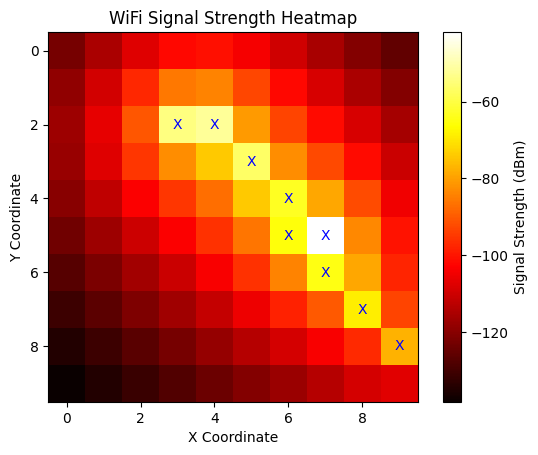

In [4]:
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import warnings
from sklearn.ensemble import GradientBoostingRegressor

# Load the gradient boosting model and encoders
model = joblib.load('gradient_boosting_model.pkl')
encoder = joblib.load('material_type_encoder.pkl')
feature_names = joblib.load('feature_names.pkl')

# Function to calculate Free Space Path Loss (FSPL)
def calculate_fspl(distance, frequency):
    c = 3e8  # Speed of light in meters per second
    return 20 * math.log10(distance) + 20 * math.log10(frequency) + 20 * math.log10(4 * math.pi / c)

# Function to calculate Distance Loss using the inverse square law
def calculate_distance_loss(distance):
    return 10 * math.log10(distance)

def predict_material_loss(distance, material_type):
    features = pd.DataFrame([[distance, material_type]], columns=['distance', 'material_type'])
    encoded_features = encoder.transform(features[['material_type']])
    if isinstance(encoded_features, np.ndarray):
        feature_values = np.hstack((features.drop('material_type', axis=1).values, encoded_features))
    else:
        feature_values = np.hstack((features.drop('material_type', axis=1).values, encoded_features.toarray()))
    expected_columns = feature_names
    df = pd.DataFrame([feature_values.flatten()], columns=expected_columns)
    prediction = model.predict(df)
    return prediction[0]

# Function to calculate received signal power based on transmitted signal power and losses
def calculate_received_power(transmitted_power, distance, frequency, material_loss):
    fspl = calculate_fspl(distance, frequency)
    distance_loss = calculate_distance_loss(distance)
    return transmitted_power - (fspl + material_loss + distance_loss)

# Function to add a wall to the environment map
def add_wall_to_map(environment_map, x1, y1, x2, y2, wall_thickness=1):
    dx = abs(x2 - x1)
    dy = abs(y2 - y1)
    sx = 1 if x1 < x2 else -1
    sy = 1 if y1 < y2 else -1
    err = dx - dy

    while True:
        if x1 >= 0 and y1 >= 0 and x1 < environment_map.shape[0] and y1 < environment_map.shape[1]:
            environment_map[x1, y1] = 1  # Mark the wall on the map
        if (x1 == x2) and (y1 == y2):
            break
        e2 = 2 * err
        if e2 > -dy:
            err -= dy
            x1 += sx
        if e2 < dx:
            err += dx
            y1 += sy

def analyze_obstacles(obstacles, transmitted_power, frequency, encoder, model):
    # Determine grid size based on obstacle coordinates
    max_x = max([max(obstacle[0], obstacle[1]) for obstacle in obstacles if len(obstacle) == 3] +
                [max(obstacle[0], obstacle[2]) for obstacle in obstacles if len(obstacle) == 5])
    max_y = max([max(obstacle[0], obstacle[1]) for obstacle in obstacles if len(obstacle) == 3] +
                [max(obstacle[1], obstacle[3]) for obstacle in obstacles if len(obstacle) == 5])
    grid_size = max(max_x, max_y) + 1

    environment_map = np.zeros((grid_size, grid_size))
    results = np.zeros((grid_size, grid_size))

    for obstacle in obstacles:
        if len(obstacle) == 3:
            # Point obstacle
            ox, oy, material_type = obstacle
            if ox >= 0 and oy >= 0 and ox < grid_size and oy < grid_size:
                environment_map[ox, oy] = 1
        elif len(obstacle) == 5:
            # Wall obstacle
            x1, y1, x2, y2, material_type = obstacle
            add_wall_to_map(environment_map, x1, y1, x2, y2)

    for x in range(grid_size):
        for y in range(grid_size):
            received_power = transmitted_power
            for obstacle in obstacles:
                if len(obstacle) == 3:
                    # Point obstacle
                    obstacle_x, obstacle_y, obstacle_type = obstacle
                    distance = math.sqrt((x - obstacle_x) ** 2 + (y - obstacle_y) ** 2)
                    if distance < 0.01:  # Avoid dividing by zero
                        continue

                    # Predict material loss
                    material_loss = predict_material_loss(distance, obstacle_type)
                    
                    # Calculate received power
                    received_power += calculate_received_power(transmitted_power, distance, frequency, material_loss)
                    
                elif len(obstacle) == 5:
                    # Wall obstacle
                    x1, y1, x2, y2, material_type = obstacle
                    wall_distance = distance_to_wall(x, y, x1, y1, x2, y2)
                    if wall_distance < 0.01:  # Avoid dividing by zero
                        continue
                    
                    # Predict material loss
                    material_loss = predict_material_loss(wall_distance, material_type)
                    
                    # Calculate received power
                    received_power += calculate_received_power(transmitted_power, wall_distance, frequency, material_loss)
                    
            results[x, y] = received_power
    return results, environment_map

# Function to calculate the distance from a point to a wall segment
def distance_to_wall(px, py, x1, y1, x2, y2):
    if (x1 == x2) and (y1 == y2):
        return math.sqrt((px - x1) ** 2 + (py - y1) ** 2)
    line_mag = math.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
    u = ((px - x1) * (x2 - x1) + (py - y1) * (y2 - y1)) / line_mag ** 2
    if u < 0:
        closest_point = (x1, y1)
    elif u > 1:
        closest_point = (x2, y2)
    else:
        closest_point = (x1 + u * (x2 - x1), y1 + u * (y2 - y1))
    return math.sqrt((px - closest_point[0]) ** 2 + (py - closest_point[1]) ** 2)

# Function to save results to a text file
def save_results(results, environment_map, layout_length, layout_width, file_name):
    with open(file_name, 'w') as file:
        file.write(f"Layout Size: {layout_length} {layout_width}\n")
        for point, received_power in np.ndenumerate(results):
            file.write(f"Point {point}: Received Power = {received_power} dBm\n")

# Function to visualize results using a heatmap
def visualize_results(results, environment_map):
    plt.imshow(results, cmap='hot', interpolation='nearest')
    plt.colorbar(label='Signal Strength (dBm)')
    plt.title('WiFi Signal Strength Heatmap')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    for (x, y), value in np.ndenumerate(environment_map):
        if value == 1:
            plt.text(y, x, 'X', ha='center', va='center', color='blue')
    plt.show()

def main():
    # Read parameters from text file
    with open("input_parameters.txt", "r") as file:
        lines = file.readlines()
        layout_length = float(lines[0].strip())  # Parse as float
        layout_width = float(lines[1].strip())   # Parse as float
        num_obstacles = int(lines[2].strip())
        obstacles = []
        for line in lines[3:3+num_obstacles]:
            coords = line.split()
            if len(coords) == 3:
                # Point obstacle
                x, y, material_type = coords
                obstacles.append((int(x), int(y), material_type.strip()))
            elif len(coords) == 5:
                # Wall obstacle
                x1, y1, x2, y2, material_type = coords
                obstacles.append((int(x1), int(y1), int(x2), int(y2), material_type.strip()))
    
    transmitted_power = 18.0  # Example transmitted power in dBm
    frequency = 2.4e9  # Example frequency in Hz (2.4 GHz)

    # Analyze obstacles and calculate signal degradation for each point in the grid
    results, environment_map = analyze_obstacles(obstacles, transmitted_power, frequency, encoder, model)

    # Save results to a text file
    save_results(results, environment_map, layout_length, layout_width, "signal_degradation4.txt")
    print("Results saved to 'signal_degradation4.txt'")

    # Visualize results
    visualize_results(results, environment_map)

if __name__ == "__main__":
    main()


import pandas as pd
import numpy as np
import joblib
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score, KFold
from sklearn.metrics import mean_squared_error, r2_score

# Load dataset
data = pd.read_csv("material_losses.csv")  # Assuming columns: distance, material_type, loss

# Separate features and target
X = data.drop('loss', axis=1)
y = data['loss']

# Encode categorical features
categorical_features = ['material_type']
encoder = OneHotEncoder(sparse=False)
encoded_features = encoder.fit_transform(X[categorical_features])

# Combine encoded features with other features (only distance remains)
X_encoded = np.hstack((X.drop(categorical_features, axis=1).values, encoded_features))

# Define the Gradient Boosting Regressor
model = GradientBoostingRegressor(n_estimators=200, learning_rate=0.1, max_depth=3, random_state=42)

# Set up k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Evaluate the model using cross-validation
cv_scores = cross_val_score(model, X_encoded, y, cv=kf, scoring='neg_mean_squared_error')

# Calculate the mean and standard deviation of the cross-validation scores
mean_cv_score = np.mean(cv_scores)
std_cv_score = np.std(cv_scores)

print(f"Mean Cross-Validation Score (MSE): {-mean_cv_score:.4f}")
print(f"Standard Deviation of CV Scores: {std_cv_score:.4f}")

# Train the model on the entire dataset (optional, after cross-validation)
model.fit(X_encoded, y)

# Save the trained model and encoder
joblib.dump(model, 'gradient_boosting_model.pkl')
joblib.dump(encoder, 'material_type_encoder.pkl')


# Assuming model, encoder, and scaler are already loaded as shown in the previous steps
# and X_test is already preprocessed similarly to the training data

# Predict the loss for the test data
y_pred = model.predict(X_test)

# Print the predictions
print("Predicted signal losses for test data:", y_pred)

# Optionally, you can compare these predictions with the actual values (y_test)
# Print actual vs predicted values for comparison
for actual, predicted in zip(y_test, y_pred):
    print(f"Actual: {actual}, Predicted: {predicted}")


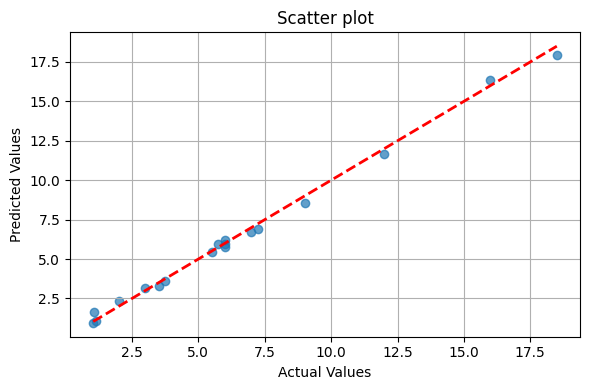

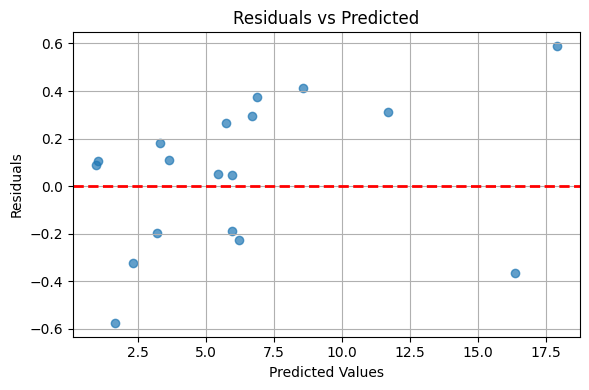

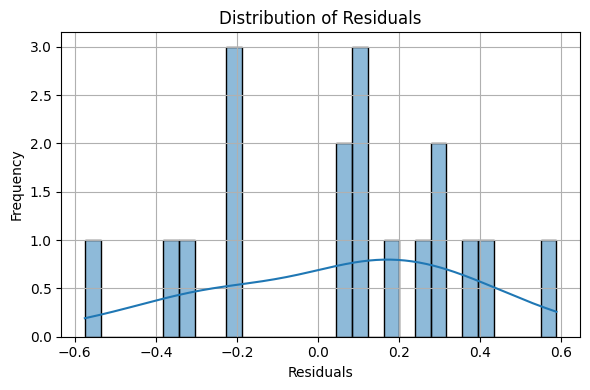

Mean Absolute Error (MAE): 0.2616
Root Mean Squared Error (RMSE): 0.3051


In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

# Reduce the size of the plots
figsize = (6, 4)  # You can adjust the values to your preference

# Scatter plot of actual vs predicted values
plt.figure(figsize=figsize)
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', linewidth=2)
plt.title('Scatter plot')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.grid(True)
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

# Residual plot
residuals = y_test - y_pred
plt.figure(figsize=figsize)
plt.scatter(y_pred, residuals, alpha=0.7)
plt.axhline(y=0, color='red', linestyle='--', linewidth=2)
plt.title('Residuals vs Predicted')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.grid(True)
plt.tight_layout()
plt.show()

# Histogram of residuals
plt.figure(figsize=figsize)
sns.histplot(residuals, kde=True, bins=30)
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.show()

# Evaluation metrics
mae = np.mean(np.abs(residuals))
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")


In [3]:
import math
import numpy as np
import pandas as pd
import joblib
import os

# Load the gradient boosting model and encoders with correct paths
model = joblib.load('gradient_boosting_model.pkl')
encoder = joblib.load('material_type_encoder.pkl')
feature_names = joblib.load('feature_names.pkl')

# Function to calculate Free Space Path Loss (FSPL)
def calculate_fspl(distance, frequency):
    c = 3e8  # Speed of light in meters per second
    return 20 * math.log10(distance) + 20 * math.log10(frequency) + 20 * math.log10(4 * math.pi / c)

# Function to calculate Distance Loss using the inverse square law
def calculate_distance_loss(distance):
    return 10 * math.log10(distance)

def predict_material_loss(distance, material_type):
    features = pd.DataFrame([[distance, material_type]], columns=['distance', 'material_type'])
    encoded_features = encoder.transform(features[['material_type']])
    if isinstance(encoded_features, np.ndarray):
        feature_values = np.hstack((features.drop('material_type', axis=1).values, encoded_features))
    else:
        feature_values = np.hstack((features.drop('material_type', axis=1).values, encoded_features.toarray()))

    # Convert feature_values to numpy array without column names
    prediction = model.predict(feature_values)
    return prediction[0]


# Function to calculate received signal power based on transmitted signal power and losses
def calculate_received_power(transmitted_power, distance, frequency, material_loss):
    fspl = calculate_fspl(distance, frequency)
    distance_loss = calculate_distance_loss(distance)
    return transmitted_power - (fspl + material_loss + distance_loss)

# Function to add a wall to the environment map
def add_wall_to_map(environment_map, x1, y1, x2, y2, wall_thickness=1):
    dx = abs(x2 - x1)
    dy = abs(y2 - y1)
    sx = 1 if x1 < x2 else -1
    sy = 1 if y1 < y2 else -1
    err = dx - dy

    while True:
        if x1 >= 0 and y1 >= 0 and x1 < environment_map.shape[0] and y1 < environment_map.shape[1]:
            environment_map[x1, y1] = 1  # Mark the wall on the map
        if (x1 == x2) and (y1 == y2):
            break
        e2 = 2 * err
        if e2 > -dy:
            err -= dy
            x1 += sx
        if e2 < dx:
            err += dx
            y1 += sy

def analyze_signal_strength(transmitted_power, frequency, encoder, model, grid_size, obstacles):
    # Initialize a dictionary to store results for each router placement
    all_results = {}

    # Iterate over every possible router placement in the grid
    for router_x in range(grid_size):
        for router_y in range(grid_size):
            # Initialize grid for storing received power at each point for this router position
            results = np.zeros((grid_size, grid_size))

            for x in range(grid_size):
                for y in range(grid_size):
                    received_power = transmitted_power
                    for obstacle in obstacles:
                        if len(obstacle) == 3:
                            # Point obstacle
                            obstacle_x, obstacle_y, obstacle_type = obstacle
                            distance = math.sqrt((x - obstacle_x) ** 2 + (y - obstacle_y) ** 2)
                            if distance < 0.01:  # Avoid dividing by zero
                                continue

                            # Predict material loss
                            material_loss = predict_material_loss(distance, obstacle_type)
                            
                            # Calculate received power for the current router position
                            received_power += calculate_received_power(transmitted_power, distance, frequency, material_loss)
                            
                        elif len(obstacle) == 5:
                            # Wall obstacle
                            x1, y1, x2, y2, material_type = obstacle
                            wall_distance = distance_to_wall(x, y, x1, y1, x2, y2)
                            if wall_distance < 0.01:  # Avoid dividing by zero
                                continue
                            
                            # Predict material loss
                            material_loss = predict_material_loss(wall_distance, material_type)
                            
                            # Calculate received power for the current router position
                            received_power += calculate_received_power(transmitted_power, wall_distance, frequency, material_loss)

                    # Calculate distance loss and FSPL for the router to each grid point
                    router_distance = math.sqrt((x - router_x) ** 2 + (y - router_y) ** 2)
                    if router_distance >= 0.01:
                        fspl = calculate_fspl(router_distance, frequency)
                        distance_loss = calculate_distance_loss(router_distance)
                        received_power -= (fspl + distance_loss)

                    # Save the calculated received power
                    results[x, y] = received_power

            # Store the results for this router position
            all_results[(router_x, router_y)] = results

    return all_results

# Function to calculate the distance from a point to a wall segment
def distance_to_wall(px, py, x1, y1, x2, y2):
    if (x1 == x2) and (y1 == y2):
        return math.sqrt((px - x1) ** 2 + (py - y1) ** 2)
    line_mag = math.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
    u = ((px - x1) * (x2 - x1) + (py - y1) * (y2 - y1)) / line_mag ** 2
    if u < 0:
        closest_point = (x1, y1)
    elif u > 1:
        closest_point = (x2, y2)
    else:
        closest_point = (x1 + u * (x2 - x1), y1 + u * (y2 - y1))
    return math.sqrt((px - closest_point[0]) ** 2 + (py - closest_point[1]) ** 2)

# Function to save results for each router placement
def save_results_for_all_positions(all_results, file_name):
    with open(file_name, 'w') as file:
        for position, results in all_results.items():
            file.write(f"Router Position: {position}\n")
            for (x, y), received_power in np.ndenumerate(results):
                file.write(f"Point ({x}, {y}): Received Power = {received_power} dBm\n")
            file.write("\n")

# Main function to execute the analysis and save the results
def main():
    
    
        
    # Read parameters from text file
    with open("combined_data.txt", "r") as file:
        lines = file.readlines()
        layout_length = float(lines[0].strip())  # Parse as float
        layout_width = float(lines[1].strip())   # Parse as float
        num_obstacles = int(lines[2].strip())
        obstacles = []
        for line in lines[3:3+num_obstacles]:
            coords = line.split()
            if len(coords) == 3:
                # Point obstacle
                x, y, material_type = coords
                obstacles.append((int(x), int(y), material_type.strip()))
            elif len(coords) == 5:
                # Wall obstacle
                x1, y1, x2, y2, material_type = coords
                obstacles.append((int(x1), int(y1), int(x2), int(y2), material_type.strip()))
    
    grid_size = int(max(layout_length, layout_width))
    transmitted_power = 18.0  # Example transmitted power in dBm
    frequency = 2.4e9  # Example frequency in Hz (2.4 GHz)

    # Analyze signal strength for each router position
    all_results = analyze_signal_strength(transmitted_power, frequency, encoder, model, grid_size, obstacles)

    # Save all results to a text file
    save_results_for_all_positions(all_results, "signal_degradation.txt")
    
    

if __name__ == "__main__":
    main()


In [6]:
import math
import numpy as np
import pandas as pd
import joblib
import os
import psutil
import time

# Load the gradient boosting model and encoders with correct paths
model = joblib.load('gradient_boosting_model.pkl')
encoder = joblib.load('material_type_encoder.pkl')
feature_names = joblib.load('feature_names.pkl')

# Function to calculate Free Space Path Loss (FSPL)
def calculate_fspl(distance, frequency):
    c = 3e8  # Speed of light in meters per second
    return 20 * math.log10(distance) + 20 * math.log10(frequency) + 20 * math.log10(4 * math.pi / c)

# Function to calculate Distance Loss using the inverse square law
def calculate_distance_loss(distance):
    return 10 * math.log10(distance)

# Variable to keep track of total time and number of calls
total_time = 0
num_calls = 0

def predict_material_loss(distance, material_type):
    global total_time, num_calls  # Access the global variables

    start_time = time.time()  # Record the start time

    features = pd.DataFrame([[distance, material_type]], columns=['distance', 'material_type'])
    encoded_features = encoder.transform(features[['material_type']])
    if isinstance(encoded_features, np.ndarray):
        feature_values = np.hstack((features.drop('material_type', axis=1).values, encoded_features))
    else:
        feature_values = np.hstack((features.drop('material_type', axis=1).values, encoded_features.toarray()))

    # Convert feature_values to numpy array without column names
    prediction = model.predict(feature_values)

    end_time = time.time()  # Record the end time
    execution_time = end_time - start_time  # Calculate the execution time

    # Accumulate total time and number of calls
    total_time += execution_time
    num_calls += 1

    # Calculate the average execution time
    avg_time = total_time / num_calls if num_calls > 0 else 0

    print(f"Material loss prediction execution time: {execution_time:.6f} seconds")
    print(f"Average execution time after {num_calls} calls: {avg_time:.6f} seconds")
    
    return prediction[0]

# Function to calculate received signal power based on transmitted signal power and losses
def calculate_received_power(transmitted_power, distance, frequency, material_loss):
    fspl = calculate_fspl(distance, frequency)
    distance_loss = calculate_distance_loss(distance)
    return transmitted_power - (fspl + material_loss + distance_loss)

# Function to add a wall to the environment map
def add_wall_to_map(environment_map, x1, y1, x2, y2, wall_thickness=1):
    dx = abs(x2 - x1)
    dy = abs(y2 - y1)
    sx = 1 if x1 < x2 else -1
    sy = 1 if y1 < y2 else -1
    err = dx - dy

    while True:
        if x1 >= 0 and y1 >= 0 and x1 < environment_map.shape[0] and y1 < environment_map.shape[1]:
            environment_map[x1, y1] = 1  # Mark the wall on the map
        if (x1 == x2) and (y1 == y2):
            break
        e2 = 2 * err
        if e2 > -dy:
            err -= dy
            x1 += sx
        if e2 < dx:
            err += dx
            y1 += sy

def analyze_signal_strength(transmitted_power, frequency, encoder, model, grid_size, obstacles):
    # Initialize a dictionary to store results for each router placement
    all_results = {}

    # Iterate over every possible router placement in the grid
    for router_x in range(grid_size):
        for router_y in range(grid_size):
            # Initialize grid for storing received power at each point for this router position
            results = np.zeros((grid_size, grid_size))

            for x in range(grid_size):
                for y in range(grid_size):
                    received_power = transmitted_power
                    for obstacle in obstacles:
                        if len(obstacle) == 3:
                            # Point obstacle
                            obstacle_x, obstacle_y, obstacle_type = obstacle
                            distance = math.sqrt((x - obstacle_x) ** 2 + (y - obstacle_y) ** 2)
                            if distance < 0.01:  # Avoid dividing by zero
                                continue

                            # Predict material loss
                            material_loss = predict_material_loss(distance, obstacle_type)
                            
                            # Calculate received power for the current router position
                            received_power += calculate_received_power(transmitted_power, distance, frequency, material_loss)
                            
                        elif len(obstacle) == 5:
                            # Wall obstacle
                            x1, y1, x2, y2, material_type = obstacle
                            wall_distance = distance_to_wall(x, y, x1, y1, x2, y2)
                            if wall_distance < 0.01:  # Avoid dividing by zero
                                continue
                            
                            # Predict material loss
                            material_loss = predict_material_loss(wall_distance, material_type)
                            
                            # Calculate received power for the current router position
                            received_power += calculate_received_power(transmitted_power, wall_distance, frequency, material_loss)

                    # Calculate distance loss and FSPL for the router to each grid point
                    router_distance = math.sqrt((x - router_x) ** 2 + (y - router_y) ** 2)
                    if router_distance >= 0.01:
                        fspl = calculate_fspl(router_distance, frequency)
                        distance_loss = calculate_distance_loss(router_distance)
                        received_power -= (fspl + distance_loss)

                    # Save the calculated received power
                    results[x, y] = received_power

            # Store the results for this router position
            all_results[(router_x, router_y)] = results

    return all_results

# Function to calculate the distance from a point to a wall segment
def distance_to_wall(px, py, x1, y1, x2, y2):
    if (x1 == x2) and (y1 == y2):
        return math.sqrt((px - x1) ** 2 + (py - y1) ** 2)
    line_mag = math.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2)
    u = ((px - x1) * (x2 - x1) + (py - y1) * (y2 - y1)) / line_mag ** 2
    if u < 0:
        closest_point = (x1, y1)
    elif u > 1:
        closest_point = (x2, y2)
    else:
        closest_point = (x1 + u * (x2 - x1), y1 + u * (y2 - y1))
    return math.sqrt((px - closest_point[0]) ** 2 + (py - closest_point[1]) ** 2)

# Function to save results for each router placement
def save_results_for_all_positions(all_results, file_name):
    with open(file_name, 'w') as file:
        for position, results in all_results.items():
            file.write(f"Router Position: {position}\n")
            for (x, y), received_power in np.ndenumerate(results):
                file.write(f"Point ({x}, {y}): Received Power = {received_power} dBm\n")
            file.write("\n")

# Function to perform memory usage testing
def perform_memory_usage_testing():
    initial_memory = psutil.virtual_memory().used  # Memory usage before the analysis

    # Run the main analysis logic
    main()

    final_memory = psutil.virtual_memory().used  # Memory usage after the analysis

    # Calculate memory increase
    memory_usage_increase = (final_memory - initial_memory) / (1024 * 1024)  # Convert to MB

    print(f"Memory Usage Increase: {memory_usage_increase:.2f} MB")

if __name__ == "__main__":
    perform_memory_usage_testing()


Material loss prediction execution time: 0.003162 seconds
Average execution time after 1 calls: 0.003162 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2 calls: 0.001581 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3 calls: 0.001054 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4 calls: 0.000791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5 calls: 0.000632 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6 calls: 0.000527 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7 calls: 0.000452 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8 calls: 0.000395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9 calls: 

Material loss prediction execution time: 0.015558 seconds
Average execution time after 155 calls: 0.001432 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 156 calls: 0.001422 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 157 calls: 0.001413 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 158 calls: 0.001404 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 159 calls: 0.001396 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 160 calls: 0.001387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 161 calls: 0.001378 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 162 calls: 0.001370 seconds
Material loss prediction execution time: 0.015619 seconds
Average execution time

Material loss prediction execution time: 0.001991 seconds
Average execution time after 300 calls: 0.001487 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 301 calls: 0.001486 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 302 calls: 0.001484 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 303 calls: 0.001486 seconds
Material loss prediction execution time: 0.002009 seconds
Average execution time after 304 calls: 0.001488 seconds
Material loss prediction execution time: 0.002990 seconds
Average execution time after 305 calls: 0.001493 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 306 calls: 0.001494 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 307 calls: 0.001499 seconds
Material loss prediction execution time: 0.001001 seconds
Average execution time

Material loss prediction execution time: 0.000000 seconds
Average execution time after 428 calls: 0.001533 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 429 calls: 0.001530 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 430 calls: 0.001526 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 431 calls: 0.001523 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 432 calls: 0.001519 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 433 calls: 0.001516 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 434 calls: 0.001512 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 435 calls: 0.001509 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time

Material loss prediction execution time: 0.015628 seconds
Average execution time after 568 calls: 0.001582 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 569 calls: 0.001579 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 570 calls: 0.001577 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 571 calls: 0.001574 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 572 calls: 0.001571 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 573 calls: 0.001568 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 574 calls: 0.001566 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 575 calls: 0.001563 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time

Material loss prediction execution time: 0.001991 seconds
Average execution time after 726 calls: 0.001634 seconds
Material loss prediction execution time: 0.002999 seconds
Average execution time after 727 calls: 0.001636 seconds
Material loss prediction execution time: 0.002290 seconds
Average execution time after 728 calls: 0.001637 seconds
Material loss prediction execution time: 0.001901 seconds
Average execution time after 729 calls: 0.001637 seconds
Material loss prediction execution time: 0.001110 seconds
Average execution time after 730 calls: 0.001636 seconds
Material loss prediction execution time: 0.000989 seconds
Average execution time after 731 calls: 0.001635 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 732 calls: 0.001636 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 733 calls: 0.001635 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time

Material loss prediction execution time: 0.000000 seconds
Average execution time after 931 calls: 0.001609 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 932 calls: 0.001607 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 933 calls: 0.001605 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 934 calls: 0.001604 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 935 calls: 0.001602 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 936 calls: 0.001600 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 937 calls: 0.001598 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 938 calls: 0.001597 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time

Material loss prediction execution time: 0.015116 seconds
Average execution time after 1077 calls: 0.001612 seconds
Material loss prediction execution time: 0.000910 seconds
Average execution time after 1078 calls: 0.001611 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1079 calls: 0.001610 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1080 calls: 0.001608 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1081 calls: 0.001607 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1082 calls: 0.001605 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1083 calls: 0.001604 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1084 calls: 0.001602 seconds
Material loss prediction execution time: 0.015651 seconds
Average execut

Material loss prediction execution time: 0.015507 seconds
Average execution time after 1223 calls: 0.001609 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1224 calls: 0.001608 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1225 calls: 0.001607 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1226 calls: 0.001605 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1227 calls: 0.001604 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1228 calls: 0.001603 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1229 calls: 0.001601 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1230 calls: 0.001600 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015629 seconds
Average execution time after 1367 calls: 0.001610 seconds
Material loss prediction execution time: 0.000878 seconds
Average execution time after 1368 calls: 0.001609 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1369 calls: 0.001608 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1370 calls: 0.001607 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1371 calls: 0.001605 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1372 calls: 0.001604 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1373 calls: 0.001603 seconds
Material loss prediction execution time: 0.016593 seconds
Average execution time after 1374 calls: 0.001614 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015276 seconds
Average execution time after 1497 calls: 0.001636 seconds
Material loss prediction execution time: 0.001210 seconds
Average execution time after 1498 calls: 0.001636 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1499 calls: 0.001635 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1500 calls: 0.001633 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1501 calls: 0.001632 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1502 calls: 0.001631 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1503 calls: 0.001630 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1504 calls: 0.001629 seconds
Material loss prediction execution time: 0.016824 seconds
Average execut

Material loss prediction execution time: 0.015663 seconds
Average execution time after 1638 calls: 0.001649 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1639 calls: 0.001648 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1640 calls: 0.001647 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1641 calls: 0.001646 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1642 calls: 0.001645 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1643 calls: 0.001644 seconds
Material loss prediction execution time: 0.016058 seconds
Average execution time after 1644 calls: 0.001653 seconds
Material loss prediction execution time: 0.000785 seconds
Average execution time after 1645 calls: 0.001653 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000999 seconds
Average execution time after 1780 calls: 0.001665 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 1781 calls: 0.001664 seconds
Material loss prediction execution time: 0.001532 seconds
Average execution time after 1782 calls: 0.001664 seconds
Material loss prediction execution time: 0.002040 seconds
Average execution time after 1783 calls: 0.001664 seconds
Material loss prediction execution time: 0.002039 seconds
Average execution time after 1784 calls: 0.001665 seconds
Material loss prediction execution time: 0.001989 seconds
Average execution time after 1785 calls: 0.001665 seconds
Material loss prediction execution time: 0.002050 seconds
Average execution time after 1786 calls: 0.001665 seconds
Material loss prediction execution time: 0.002011 seconds
Average execution time after 1787 calls: 0.001665 seconds
Material loss prediction execution time: 0.002000 seconds
Average execut

Material loss prediction execution time: 0.015586 seconds
Average execution time after 1942 calls: 0.001644 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1943 calls: 0.001643 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1944 calls: 0.001643 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1945 calls: 0.001642 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1946 calls: 0.001641 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 1947 calls: 0.001640 seconds
Material loss prediction execution time: 0.015729 seconds
Average execution time after 1948 calls: 0.001647 seconds
Material loss prediction execution time: 0.002626 seconds
Average execution time after 1949 calls: 0.001648 seconds
Material loss prediction execution time: 0.003003 seconds
Average execut

Material loss prediction execution time: 0.015650 seconds
Average execution time after 2068 calls: 0.001652 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2069 calls: 0.001651 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2070 calls: 0.001651 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2071 calls: 0.001650 seconds
Material loss prediction execution time: 0.009708 seconds
Average execution time after 2072 calls: 0.001654 seconds
Material loss prediction execution time: 0.001043 seconds
Average execution time after 2073 calls: 0.001653 seconds
Material loss prediction execution time: 0.002002 seconds
Average execution time after 2074 calls: 0.001653 seconds
Material loss prediction execution time: 0.001997 seconds
Average execution time after 2075 calls: 0.001654 seconds
Material loss prediction execution time: 0.002000 seconds
Average execut

Material loss prediction execution time: 0.002001 seconds
Average execution time after 2229 calls: 0.001637 seconds
Material loss prediction execution time: 0.002243 seconds
Average execution time after 2230 calls: 0.001638 seconds
Material loss prediction execution time: 0.002020 seconds
Average execution time after 2231 calls: 0.001638 seconds
Material loss prediction execution time: 0.002211 seconds
Average execution time after 2232 calls: 0.001638 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 2233 calls: 0.001638 seconds
Material loss prediction execution time: 0.002380 seconds
Average execution time after 2234 calls: 0.001638 seconds
Material loss prediction execution time: 0.002633 seconds
Average execution time after 2235 calls: 0.001639 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2236 calls: 0.001638 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.002000 seconds
Average execution time after 2412 calls: 0.001616 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 2413 calls: 0.001615 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 2414 calls: 0.001615 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 2415 calls: 0.001615 seconds
Material loss prediction execution time: 0.000412 seconds
Average execution time after 2416 calls: 0.001614 seconds
Material loss prediction execution time: 0.002041 seconds
Average execution time after 2417 calls: 0.001614 seconds
Material loss prediction execution time: 0.001009 seconds
Average execution time after 2418 calls: 0.001614 seconds
Material loss prediction execution time: 0.000990 seconds
Average execution time after 2419 calls: 0.001614 seconds
Material loss prediction execution time: 0.001010 seconds
Average execut

Material loss prediction execution time: 0.002000 seconds
Average execution time after 2609 calls: 0.001599 seconds
Material loss prediction execution time: 0.001003 seconds
Average execution time after 2610 calls: 0.001598 seconds
Material loss prediction execution time: 0.001079 seconds
Average execution time after 2611 calls: 0.001598 seconds
Material loss prediction execution time: 0.000996 seconds
Average execution time after 2612 calls: 0.001598 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 2613 calls: 0.001598 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 2614 calls: 0.001598 seconds
Material loss prediction execution time: 0.001757 seconds
Average execution time after 2615 calls: 0.001598 seconds
Material loss prediction execution time: 0.002004 seconds
Average execution time after 2616 calls: 0.001598 seconds
Material loss prediction execution time: 0.002002 seconds
Average execut

Material loss prediction execution time: 0.016674 seconds
Average execution time after 2762 calls: 0.001597 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2763 calls: 0.001597 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2764 calls: 0.001596 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2765 calls: 0.001596 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 2766 calls: 0.001595 seconds
Material loss prediction execution time: 0.015263 seconds
Average execution time after 2767 calls: 0.001600 seconds
Material loss prediction execution time: 0.002196 seconds
Average execution time after 2768 calls: 0.001600 seconds
Material loss prediction execution time: 0.002096 seconds
Average execution time after 2769 calls: 0.001600 seconds
Material loss prediction execution time: 0.002004 seconds
Average execut

Material loss prediction execution time: 0.002000 seconds
Average execution time after 2927 calls: 0.001585 seconds
Material loss prediction execution time: 0.000999 seconds
Average execution time after 2928 calls: 0.001585 seconds
Material loss prediction execution time: 0.001350 seconds
Average execution time after 2929 calls: 0.001584 seconds
Material loss prediction execution time: 0.001047 seconds
Average execution time after 2930 calls: 0.001584 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 2931 calls: 0.001584 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 2932 calls: 0.001584 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 2933 calls: 0.001584 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 2934 calls: 0.001583 seconds
Material loss prediction execution time: 0.001000 seconds
Average execut

Material loss prediction execution time: 0.015633 seconds
Average execution time after 3100 calls: 0.001569 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3101 calls: 0.001568 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3102 calls: 0.001568 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3103 calls: 0.001567 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3104 calls: 0.001567 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3105 calls: 0.001566 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3106 calls: 0.001566 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3107 calls: 0.001565 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015554 seconds
Average execution time after 3260 calls: 0.001568 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3261 calls: 0.001568 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3262 calls: 0.001567 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3263 calls: 0.001567 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3264 calls: 0.001566 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3265 calls: 0.001566 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3266 calls: 0.001565 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3267 calls: 0.001565 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015921 seconds
Average execution time after 3399 calls: 0.001578 seconds
Material loss prediction execution time: 0.000812 seconds
Average execution time after 3400 calls: 0.001578 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3401 calls: 0.001577 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3402 calls: 0.001577 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3403 calls: 0.001576 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3404 calls: 0.001576 seconds
Material loss prediction execution time: 0.015005 seconds
Average execution time after 3405 calls: 0.001580 seconds
Material loss prediction execution time: 0.001933 seconds
Average execution time after 3406 calls: 0.001580 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.002001 seconds
Average execution time after 3566 calls: 0.001586 seconds
Material loss prediction execution time: 0.001871 seconds
Average execution time after 3567 calls: 0.001586 seconds
Material loss prediction execution time: 0.002798 seconds
Average execution time after 3568 calls: 0.001587 seconds
Material loss prediction execution time: 0.003889 seconds
Average execution time after 3569 calls: 0.001587 seconds
Material loss prediction execution time: 0.000833 seconds
Average execution time after 3570 calls: 0.001587 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3571 calls: 0.001587 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 3572 calls: 0.001586 seconds
Material loss prediction execution time: 0.012098 seconds
Average execution time after 3573 calls: 0.001589 seconds
Material loss prediction execution time: 0.003002 seconds
Average execut

Material loss prediction execution time: 0.002001 seconds
Average execution time after 3709 calls: 0.001590 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 3710 calls: 0.001590 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 3711 calls: 0.001590 seconds
Material loss prediction execution time: 0.001011 seconds
Average execution time after 3712 calls: 0.001590 seconds
Material loss prediction execution time: 0.000989 seconds
Average execution time after 3713 calls: 0.001590 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 3714 calls: 0.001590 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 3715 calls: 0.001590 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 3716 calls: 0.001590 seconds
Material loss prediction execution time: 0.001014 seconds
Average execut

Material loss prediction execution time: 0.002145 seconds
Average execution time after 3873 calls: 0.001582 seconds
Material loss prediction execution time: 0.001109 seconds
Average execution time after 3874 calls: 0.001582 seconds
Material loss prediction execution time: 0.001991 seconds
Average execution time after 3875 calls: 0.001582 seconds
Material loss prediction execution time: 0.001008 seconds
Average execution time after 3876 calls: 0.001582 seconds
Material loss prediction execution time: 0.000946 seconds
Average execution time after 3877 calls: 0.001582 seconds
Material loss prediction execution time: 0.001971 seconds
Average execution time after 3878 calls: 0.001582 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 3879 calls: 0.001582 seconds
Material loss prediction execution time: 0.000998 seconds
Average execution time after 3880 calls: 0.001581 seconds
Material loss prediction execution time: 0.002010 seconds
Average execut

Material loss prediction execution time: 0.015549 seconds
Average execution time after 4041 calls: 0.001585 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4042 calls: 0.001584 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4043 calls: 0.001584 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4044 calls: 0.001584 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4045 calls: 0.001583 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4046 calls: 0.001583 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 4047 calls: 0.001586 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4048 calls: 0.001586 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015552 seconds
Average execution time after 4164 calls: 0.001597 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4165 calls: 0.001597 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4166 calls: 0.001596 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4167 calls: 0.001596 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4168 calls: 0.001596 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4169 calls: 0.001595 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4170 calls: 0.001595 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 4171 calls: 0.001598 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.012352 seconds
Average execution time after 4282 calls: 0.001609 seconds
Material loss prediction execution time: 0.002004 seconds
Average execution time after 4283 calls: 0.001609 seconds
Material loss prediction execution time: 0.000999 seconds
Average execution time after 4284 calls: 0.001609 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4285 calls: 0.001608 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4286 calls: 0.001608 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4287 calls: 0.001608 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4288 calls: 0.001607 seconds
Material loss prediction execution time: 0.015772 seconds
Average execution time after 4289 calls: 0.001611 seconds
Material loss prediction execution time: 0.000704 seconds
Average execut

Material loss prediction execution time: 0.000605 seconds
Average execution time after 4418 calls: 0.001635 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4419 calls: 0.001635 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4420 calls: 0.001635 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4421 calls: 0.001634 seconds
Material loss prediction execution time: 0.015382 seconds
Average execution time after 4422 calls: 0.001637 seconds
Material loss prediction execution time: 0.001587 seconds
Average execution time after 4423 calls: 0.001637 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4424 calls: 0.001637 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4425 calls: 0.001637 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 4526 calls: 0.001647 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4527 calls: 0.001647 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4528 calls: 0.001647 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4529 calls: 0.001646 seconds
Material loss prediction execution time: 0.012835 seconds
Average execution time after 4530 calls: 0.001649 seconds
Material loss prediction execution time: 0.001003 seconds
Average execution time after 4531 calls: 0.001649 seconds
Material loss prediction execution time: 0.002782 seconds
Average execution time after 4532 calls: 0.001649 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4533 calls: 0.001648 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.001036 seconds
Average execution time after 4656 calls: 0.001649 seconds
Material loss prediction execution time: 0.002999 seconds
Average execution time after 4657 calls: 0.001649 seconds
Material loss prediction execution time: 0.003709 seconds
Average execution time after 4658 calls: 0.001649 seconds
Material loss prediction execution time: 0.002043 seconds
Average execution time after 4659 calls: 0.001649 seconds
Material loss prediction execution time: 0.001976 seconds
Average execution time after 4660 calls: 0.001650 seconds
Material loss prediction execution time: 0.001987 seconds
Average execution time after 4661 calls: 0.001650 seconds
Material loss prediction execution time: 0.002048 seconds
Average execution time after 4662 calls: 0.001650 seconds
Material loss prediction execution time: 0.002952 seconds
Average execution time after 4663 calls: 0.001650 seconds
Material loss prediction execution time: 0.002014 seconds
Average execut

Material loss prediction execution time: 0.005001 seconds
Average execution time after 4861 calls: 0.001648 seconds
Material loss prediction execution time: 0.004000 seconds
Average execution time after 4862 calls: 0.001649 seconds
Material loss prediction execution time: 0.004000 seconds
Average execution time after 4863 calls: 0.001649 seconds
Material loss prediction execution time: 0.003370 seconds
Average execution time after 4864 calls: 0.001650 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4865 calls: 0.001649 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4866 calls: 0.001649 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4867 calls: 0.001649 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4868 calls: 0.001648 seconds
Material loss prediction execution time: 0.015627 seconds
Average execut

Material loss prediction execution time: 0.015620 seconds
Average execution time after 4940 calls: 0.001673 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4941 calls: 0.001672 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4942 calls: 0.001672 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4943 calls: 0.001672 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 4944 calls: 0.001671 seconds
Material loss prediction execution time: 0.019747 seconds
Average execution time after 4945 calls: 0.001675 seconds
Material loss prediction execution time: 0.003008 seconds
Average execution time after 4946 calls: 0.001675 seconds
Material loss prediction execution time: 0.003909 seconds
Average execution time after 4947 calls: 0.001676 seconds
Material loss prediction execution time: 0.003831 seconds
Average execut

Material loss prediction execution time: 0.015624 seconds
Average execution time after 5068 calls: 0.001722 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5069 calls: 0.001721 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5070 calls: 0.001721 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5071 calls: 0.001721 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5072 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5073 calls: 0.001720 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 5074 calls: 0.001723 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5075 calls: 0.001722 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015699 seconds
Average execution time after 5203 calls: 0.001764 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5204 calls: 0.001764 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5205 calls: 0.001763 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5206 calls: 0.001763 seconds
Material loss prediction execution time: 0.017611 seconds
Average execution time after 5207 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5208 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5209 calls: 0.001765 seconds
Material loss prediction execution time: 0.014007 seconds
Average execution time after 5210 calls: 0.001768 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 5300 calls: 0.001767 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5301 calls: 0.001767 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5302 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5303 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5304 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5305 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5306 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5307 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015649 seconds
Average execution time after 5412 calls: 0.001767 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5413 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5414 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5415 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5416 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5417 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5418 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5419 calls: 0.001764 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 5539 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5540 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5541 calls: 0.001764 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5542 calls: 0.001764 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5543 calls: 0.001764 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5544 calls: 0.001763 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5545 calls: 0.001763 seconds
Material loss prediction execution time: 0.015629 seconds
Average execution time after 5546 calls: 0.001765 seconds
Material loss prediction execution time: 0.001918 seconds
Average execut

Material loss prediction execution time: 0.015628 seconds
Average execution time after 5722 calls: 0.001754 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5723 calls: 0.001754 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5724 calls: 0.001754 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5725 calls: 0.001753 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5726 calls: 0.001753 seconds
Material loss prediction execution time: 0.015597 seconds
Average execution time after 5727 calls: 0.001756 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5728 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5729 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 5855 calls: 0.001749 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5856 calls: 0.001749 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5857 calls: 0.001749 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5858 calls: 0.001748 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5859 calls: 0.001748 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5860 calls: 0.001748 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5861 calls: 0.001747 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5862 calls: 0.001747 seconds
Material loss prediction execution time: 0.015621 seconds
Average execut

Material loss prediction execution time: 0.015569 seconds
Average execution time after 5980 calls: 0.001756 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5981 calls: 0.001756 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5982 calls: 0.001756 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5983 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5984 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5985 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 5986 calls: 0.001754 seconds
Material loss prediction execution time: 0.015700 seconds
Average execution time after 5987 calls: 0.001757 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.005506 seconds
Average execution time after 6114 calls: 0.001762 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6115 calls: 0.001761 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6116 calls: 0.001761 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6117 calls: 0.001761 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6118 calls: 0.001761 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6119 calls: 0.001760 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6120 calls: 0.001760 seconds
Material loss prediction execution time: 0.015710 seconds
Average execution time after 6121 calls: 0.001762 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015612 seconds
Average execution time after 6244 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6245 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6246 calls: 0.001765 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6247 calls: 0.001765 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 6248 calls: 0.001767 seconds
Material loss prediction execution time: 0.000818 seconds
Average execution time after 6249 calls: 0.001767 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6250 calls: 0.001767 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6251 calls: 0.001766 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.014507 seconds
Average execution time after 6375 calls: 0.001768 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6376 calls: 0.001768 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6377 calls: 0.001767 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6378 calls: 0.001767 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6379 calls: 0.001767 seconds
Material loss prediction execution time: 0.015987 seconds
Average execution time after 6380 calls: 0.001769 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6381 calls: 0.001769 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 6382 calls: 0.001768 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.001827 seconds
Average execution time after 6517 calls: 0.001763 seconds
Material loss prediction execution time: 0.002004 seconds
Average execution time after 6518 calls: 0.001763 seconds
Material loss prediction execution time: 0.001996 seconds
Average execution time after 6519 calls: 0.001763 seconds
Material loss prediction execution time: 0.002472 seconds
Average execution time after 6520 calls: 0.001763 seconds
Material loss prediction execution time: 0.001034 seconds
Average execution time after 6521 calls: 0.001763 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 6522 calls: 0.001763 seconds
Material loss prediction execution time: 0.000999 seconds
Average execution time after 6523 calls: 0.001763 seconds
Material loss prediction execution time: 0.001386 seconds
Average execution time after 6524 calls: 0.001763 seconds
Material loss prediction execution time: 0.002003 seconds
Average execut

Material loss prediction execution time: 0.016560 seconds
Average execution time after 6731 calls: 0.001754 seconds
Material loss prediction execution time: 0.000914 seconds
Average execution time after 6732 calls: 0.001754 seconds
Material loss prediction execution time: 0.002058 seconds
Average execution time after 6733 calls: 0.001754 seconds
Material loss prediction execution time: 0.000991 seconds
Average execution time after 6734 calls: 0.001754 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 6735 calls: 0.001754 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 6736 calls: 0.001754 seconds
Material loss prediction execution time: 0.001006 seconds
Average execution time after 6737 calls: 0.001753 seconds
Material loss prediction execution time: 0.002007 seconds
Average execution time after 6738 calls: 0.001753 seconds
Material loss prediction execution time: 0.000987 seconds
Average execut

Material loss prediction execution time: 0.002000 seconds
Average execution time after 6906 calls: 0.001746 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 6907 calls: 0.001746 seconds
Material loss prediction execution time: 0.002124 seconds
Average execution time after 6908 calls: 0.001746 seconds
Material loss prediction execution time: 0.000995 seconds
Average execution time after 6909 calls: 0.001746 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 6910 calls: 0.001746 seconds
Material loss prediction execution time: 0.001003 seconds
Average execution time after 6911 calls: 0.001746 seconds
Material loss prediction execution time: 0.001035 seconds
Average execution time after 6912 calls: 0.001745 seconds
Material loss prediction execution time: 0.002242 seconds
Average execution time after 6913 calls: 0.001746 seconds
Material loss prediction execution time: 0.001015 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 7032 calls: 0.001743 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7033 calls: 0.001743 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7034 calls: 0.001742 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7035 calls: 0.001742 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7036 calls: 0.001742 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7037 calls: 0.001742 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7038 calls: 0.001741 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7039 calls: 0.001741 seconds
Material loss prediction execution time: 0.015609 seconds
Average execut

Material loss prediction execution time: 0.015541 seconds
Average execution time after 7173 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7174 calls: 0.001739 seconds
Material loss prediction execution time: 0.004685 seconds
Average execution time after 7175 calls: 0.001739 seconds
Material loss prediction execution time: 0.002999 seconds
Average execution time after 7176 calls: 0.001739 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 7177 calls: 0.001739 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 7178 calls: 0.001740 seconds
Material loss prediction execution time: 0.002009 seconds
Average execution time after 7179 calls: 0.001740 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 7180 calls: 0.001740 seconds
Material loss prediction execution time: 0.001992 seconds
Average execut

Material loss prediction execution time: 0.011397 seconds
Average execution time after 7296 calls: 0.001739 seconds
Material loss prediction execution time: 0.002004 seconds
Average execution time after 7297 calls: 0.001739 seconds
Material loss prediction execution time: 0.001601 seconds
Average execution time after 7298 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7299 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7300 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7301 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7302 calls: 0.001738 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7303 calls: 0.001738 seconds
Material loss prediction execution time: 0.014937 seconds
Average execut

Material loss prediction execution time: 0.012633 seconds
Average execution time after 7391 calls: 0.001748 seconds
Material loss prediction execution time: 0.001287 seconds
Average execution time after 7392 calls: 0.001748 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7393 calls: 0.001748 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7394 calls: 0.001748 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7395 calls: 0.001748 seconds
Material loss prediction execution time: 0.013596 seconds
Average execution time after 7396 calls: 0.001749 seconds
Material loss prediction execution time: 0.002009 seconds
Average execution time after 7397 calls: 0.001749 seconds
Material loss prediction execution time: 0.001993 seconds
Average execution time after 7398 calls: 0.001749 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.013763 seconds
Average execution time after 7489 calls: 0.001759 seconds
Material loss prediction execution time: 0.002264 seconds
Average execution time after 7490 calls: 0.001759 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7491 calls: 0.001758 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7492 calls: 0.001758 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7493 calls: 0.001758 seconds
Material loss prediction execution time: 0.013614 seconds
Average execution time after 7494 calls: 0.001760 seconds
Material loss prediction execution time: 0.001002 seconds
Average execution time after 7495 calls: 0.001759 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 7496 calls: 0.001759 seconds
Material loss prediction execution time: 0.002002 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 7621 calls: 0.001754 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7622 calls: 0.001754 seconds
Material loss prediction execution time: 0.015104 seconds
Average execution time after 7623 calls: 0.001756 seconds
Material loss prediction execution time: 0.001098 seconds
Average execution time after 7624 calls: 0.001756 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7625 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7626 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7627 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7628 calls: 0.001755 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.001521 seconds
Average execution time after 7758 calls: 0.001753 seconds
Material loss prediction execution time: 0.001003 seconds
Average execution time after 7759 calls: 0.001753 seconds
Material loss prediction execution time: 0.002003 seconds
Average execution time after 7760 calls: 0.001753 seconds
Material loss prediction execution time: 0.001025 seconds
Average execution time after 7761 calls: 0.001753 seconds
Material loss prediction execution time: 0.000974 seconds
Average execution time after 7762 calls: 0.001752 seconds
Material loss prediction execution time: 0.001020 seconds
Average execution time after 7763 calls: 0.001752 seconds
Material loss prediction execution time: 0.001982 seconds
Average execution time after 7764 calls: 0.001752 seconds
Material loss prediction execution time: 0.001041 seconds
Average execution time after 7765 calls: 0.001752 seconds
Material loss prediction execution time: 0.001126 seconds
Average execut

Material loss prediction execution time: 0.003427 seconds
Average execution time after 7925 calls: 0.001747 seconds
Material loss prediction execution time: 0.001816 seconds
Average execution time after 7926 calls: 0.001747 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7927 calls: 0.001747 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7928 calls: 0.001747 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7929 calls: 0.001746 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7930 calls: 0.001746 seconds
Material loss prediction execution time: 0.015234 seconds
Average execution time after 7931 calls: 0.001748 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 7932 calls: 0.001748 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 8079 calls: 0.001741 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 8080 calls: 0.001743 seconds
Material loss prediction execution time: 0.002223 seconds
Average execution time after 8081 calls: 0.001743 seconds
Material loss prediction execution time: 0.002079 seconds
Average execution time after 8082 calls: 0.001743 seconds
Material loss prediction execution time: 0.001998 seconds
Average execution time after 8083 calls: 0.001743 seconds
Material loss prediction execution time: 0.001009 seconds
Average execution time after 8084 calls: 0.001743 seconds
Material loss prediction execution time: 0.001944 seconds
Average execution time after 8085 calls: 0.001743 seconds
Material loss prediction execution time: 0.001867 seconds
Average execution time after 8086 calls: 0.001743 seconds
Material loss prediction execution time: 0.000105 seconds
Average execut

Material loss prediction execution time: 0.015622 seconds
Average execution time after 8212 calls: 0.001740 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8213 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8214 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8215 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8216 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8217 calls: 0.001738 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8218 calls: 0.001738 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8219 calls: 0.001738 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 8364 calls: 0.001735 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8365 calls: 0.001734 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8366 calls: 0.001734 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8367 calls: 0.001734 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8368 calls: 0.001734 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8369 calls: 0.001734 seconds
Material loss prediction execution time: 0.015650 seconds
Average execution time after 8370 calls: 0.001735 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8371 calls: 0.001735 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015622 seconds
Average execution time after 8544 calls: 0.001730 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8545 calls: 0.001730 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8546 calls: 0.001729 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8547 calls: 0.001729 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8548 calls: 0.001729 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8549 calls: 0.001729 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8550 calls: 0.001729 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8551 calls: 0.001728 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 8700 calls: 0.001723 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8701 calls: 0.001723 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8702 calls: 0.001723 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8703 calls: 0.001723 seconds
Material loss prediction execution time: 0.015659 seconds
Average execution time after 8704 calls: 0.001724 seconds
Material loss prediction execution time: 0.002004 seconds
Average execution time after 8705 calls: 0.001724 seconds
Material loss prediction execution time: 0.002008 seconds
Average execution time after 8706 calls: 0.001724 seconds
Material loss prediction execution time: 0.002228 seconds
Average execution time after 8707 calls: 0.001724 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015615 seconds
Average execution time after 8836 calls: 0.001722 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8837 calls: 0.001722 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8838 calls: 0.001722 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8839 calls: 0.001722 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8840 calls: 0.001721 seconds
Material loss prediction execution time: 0.015629 seconds
Average execution time after 8841 calls: 0.001723 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8842 calls: 0.001723 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8843 calls: 0.001723 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 8998 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 8999 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9000 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9001 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9002 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9003 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9004 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9005 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.015505 seconds
Average execution time after 9180 calls: 0.001712 seconds
Material loss prediction execution time: 0.002228 seconds
Average execution time after 9181 calls: 0.001712 seconds
Material loss prediction execution time: 0.001785 seconds
Average execution time after 9182 calls: 0.001712 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9183 calls: 0.001712 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9184 calls: 0.001711 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9185 calls: 0.001711 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9186 calls: 0.001711 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9187 calls: 0.001711 seconds
Material loss prediction execution time: 0.013904 seconds
Average execut

Material loss prediction execution time: 0.001859 seconds
Average execution time after 9302 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9303 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9304 calls: 0.001714 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9305 calls: 0.001714 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9306 calls: 0.001714 seconds
Material loss prediction execution time: 0.014850 seconds
Average execution time after 9307 calls: 0.001715 seconds
Material loss prediction execution time: 0.001061 seconds
Average execution time after 9308 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9309 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 9443 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9444 calls: 0.001715 seconds
Material loss prediction execution time: 0.015234 seconds
Average execution time after 9445 calls: 0.001717 seconds
Material loss prediction execution time: 0.002358 seconds
Average execution time after 9446 calls: 0.001717 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9447 calls: 0.001717 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9448 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9449 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9450 calls: 0.001716 seconds
Material loss prediction execution time: 0.014454 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 9561 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9562 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9563 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9564 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9565 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9566 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9567 calls: 0.001719 seconds
Material loss prediction execution time: 0.014643 seconds
Average execution time after 9568 calls: 0.001720 seconds
Material loss prediction execution time: 0.002134 seconds
Average execut

Material loss prediction execution time: 0.002001 seconds
Average execution time after 9698 calls: 0.001721 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 9699 calls: 0.001721 seconds
Material loss prediction execution time: 0.000928 seconds
Average execution time after 9700 calls: 0.001721 seconds
Material loss prediction execution time: 0.001180 seconds
Average execution time after 9701 calls: 0.001721 seconds
Material loss prediction execution time: 0.000998 seconds
Average execution time after 9702 calls: 0.001721 seconds
Material loss prediction execution time: 0.002003 seconds
Average execution time after 9703 calls: 0.001721 seconds
Material loss prediction execution time: 0.000999 seconds
Average execution time after 9704 calls: 0.001721 seconds
Material loss prediction execution time: 0.001960 seconds
Average execution time after 9705 calls: 0.001721 seconds
Material loss prediction execution time: 0.001043 seconds
Average execut

Material loss prediction execution time: 0.015621 seconds
Average execution time after 9856 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9857 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9858 calls: 0.001717 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9859 calls: 0.001717 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9860 calls: 0.001717 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9861 calls: 0.001717 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9862 calls: 0.001717 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9863 calls: 0.001717 seconds
Material loss prediction execution time: 0.014019 seconds
Average execut

Material loss prediction execution time: 0.005399 seconds
Average execution time after 9982 calls: 0.001721 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9983 calls: 0.001721 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9984 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9985 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9986 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 9987 calls: 0.001720 seconds
Material loss prediction execution time: 0.011858 seconds
Average execution time after 9988 calls: 0.001721 seconds
Material loss prediction execution time: 0.001004 seconds
Average execution time after 9989 calls: 0.001721 seconds
Material loss prediction execution time: 0.000000 seconds
Average execut

Material loss prediction execution time: 0.000000 seconds
Average execution time after 10105 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10106 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10107 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10108 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10109 calls: 0.001719 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 10110 calls: 0.001721 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10111 calls: 0.001721 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10112 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 10232 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10233 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10234 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10235 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10236 calls: 0.001718 seconds
Material loss prediction execution time: 0.015929 seconds
Average execution time after 10237 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10238 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10239 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015611 seconds
Average execution time after 10343 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10344 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10345 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10346 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10347 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10348 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10349 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10350 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 10485 calls: 0.001714 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10486 calls: 0.001714 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10487 calls: 0.001714 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 10488 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10489 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10490 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10491 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10492 calls: 0.001715 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001999 seconds
Average execution time after 10629 calls: 0.001713 seconds
Material loss prediction execution time: 0.002003 seconds
Average execution time after 10630 calls: 0.001713 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 10631 calls: 0.001713 seconds
Material loss prediction execution time: 0.000997 seconds
Average execution time after 10632 calls: 0.001713 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 10633 calls: 0.001713 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 10634 calls: 0.001713 seconds
Material loss prediction execution time: 0.000990 seconds
Average execution time after 10635 calls: 0.001713 seconds
Material loss prediction execution time: 0.002009 seconds
Average execution time after 10636 calls: 0.001713 seconds
Material loss prediction execution time: 0.001001 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 10807 calls: 0.001711 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10808 calls: 0.001711 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10809 calls: 0.001710 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10810 calls: 0.001710 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10811 calls: 0.001710 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10812 calls: 0.001710 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10813 calls: 0.001710 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10814 calls: 0.001710 seconds
Material loss prediction execution time: 0.015705 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 10968 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10969 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10970 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10971 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10972 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10973 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10974 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 10975 calls: 0.001704 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001049 seconds
Average execution time after 11107 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11108 calls: 0.001704 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11109 calls: 0.001704 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11110 calls: 0.001704 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11111 calls: 0.001704 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11112 calls: 0.001704 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11113 calls: 0.001704 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11114 calls: 0.001703 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 11249 calls: 0.001707 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11250 calls: 0.001707 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11251 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11252 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11253 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11254 calls: 0.001706 seconds
Material loss prediction execution time: 0.015629 seconds
Average execution time after 11255 calls: 0.001707 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11256 calls: 0.001707 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015549 seconds
Average execution time after 11392 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11393 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11394 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11395 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11396 calls: 0.001705 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11397 calls: 0.001705 seconds
Material loss prediction execution time: 0.015714 seconds
Average execution time after 11398 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11399 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.002070 seconds
Average execution time after 11567 calls: 0.001702 seconds
Material loss prediction execution time: 0.001929 seconds
Average execution time after 11568 calls: 0.001702 seconds
Material loss prediction execution time: 0.002045 seconds
Average execution time after 11569 calls: 0.001702 seconds
Material loss prediction execution time: 0.003027 seconds
Average execution time after 11570 calls: 0.001702 seconds
Material loss prediction execution time: 0.000671 seconds
Average execution time after 11571 calls: 0.001702 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11572 calls: 0.001702 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11573 calls: 0.001702 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11574 calls: 0.001702 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 11683 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11684 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11685 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11686 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11687 calls: 0.001706 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11688 calls: 0.001706 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 11689 calls: 0.001707 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11690 calls: 0.001707 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015633 seconds
Average execution time after 11816 calls: 0.001709 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11817 calls: 0.001708 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11818 calls: 0.001708 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11819 calls: 0.001708 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11820 calls: 0.001708 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11821 calls: 0.001708 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11822 calls: 0.001708 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11823 calls: 0.001708 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016526 seconds
Average execution time after 11939 calls: 0.001713 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11940 calls: 0.001713 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11941 calls: 0.001712 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11942 calls: 0.001712 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11943 calls: 0.001712 seconds
Material loss prediction execution time: 0.015629 seconds
Average execution time after 11944 calls: 0.001713 seconds
Material loss prediction execution time: 0.000943 seconds
Average execution time after 11945 calls: 0.001713 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 11946 calls: 0.001713 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 12050 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12051 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12052 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12053 calls: 0.001715 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 12054 calls: 0.001717 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12055 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12056 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12057 calls: 0.001716 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.003227 seconds
Average execution time after 12170 calls: 0.001718 seconds
Material loss prediction execution time: 0.000856 seconds
Average execution time after 12171 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12172 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12173 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12174 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12175 calls: 0.001718 seconds
Material loss prediction execution time: 0.014516 seconds
Average execution time after 12176 calls: 0.001719 seconds
Material loss prediction execution time: 0.001756 seconds
Average execution time after 12177 calls: 0.001719 seconds
Material loss prediction execution time: 0.002000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 12288 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12289 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12290 calls: 0.001719 seconds
Material loss prediction execution time: 0.015119 seconds
Average execution time after 12291 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12292 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12293 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12294 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12295 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.002000 seconds
Average execution time after 12415 calls: 0.001720 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 12416 calls: 0.001720 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 12417 calls: 0.001720 seconds
Material loss prediction execution time: 0.002037 seconds
Average execution time after 12418 calls: 0.001720 seconds
Material loss prediction execution time: 0.001283 seconds
Average execution time after 12419 calls: 0.001720 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 12420 calls: 0.001720 seconds
Material loss prediction execution time: 0.000387 seconds
Average execution time after 12421 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12422 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015694 seconds
Average execution time after 12557 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12558 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12559 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12560 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12561 calls: 0.001718 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12562 calls: 0.001718 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 12563 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12564 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015559 seconds
Average execution time after 12679 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12680 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12681 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12682 calls: 0.001719 seconds
Material loss prediction execution time: 0.007473 seconds
Average execution time after 12683 calls: 0.001719 seconds
Material loss prediction execution time: 0.001997 seconds
Average execution time after 12684 calls: 0.001719 seconds
Material loss prediction execution time: 0.000923 seconds
Average execution time after 12685 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12686 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001000 seconds
Average execution time after 12815 calls: 0.001720 seconds
Material loss prediction execution time: 0.000916 seconds
Average execution time after 12816 calls: 0.001720 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 12817 calls: 0.001720 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 12818 calls: 0.001720 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 12819 calls: 0.001720 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 12820 calls: 0.001720 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 12821 calls: 0.001720 seconds
Material loss prediction execution time: 0.001909 seconds
Average execution time after 12822 calls: 0.001720 seconds
Material loss prediction execution time: 0.001007 seconds
Averag

Material loss prediction execution time: 0.002001 seconds
Average execution time after 12978 calls: 0.001719 seconds
Material loss prediction execution time: 0.002003 seconds
Average execution time after 12979 calls: 0.001719 seconds
Material loss prediction execution time: 0.001997 seconds
Average execution time after 12980 calls: 0.001719 seconds
Material loss prediction execution time: 0.002321 seconds
Average execution time after 12981 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12982 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12983 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12984 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 12985 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 13116 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13117 calls: 0.001719 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13118 calls: 0.001719 seconds
Material loss prediction execution time: 0.015531 seconds
Average execution time after 13119 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13120 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13121 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13122 calls: 0.001720 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13123 calls: 0.001720 seconds
Material loss prediction execution time: 0.015628 seconds
Averag

Material loss prediction execution time: 0.014489 seconds
Average execution time after 13219 calls: 0.001726 seconds
Material loss prediction execution time: 0.002034 seconds
Average execution time after 13220 calls: 0.001726 seconds
Material loss prediction execution time: 0.002078 seconds
Average execution time after 13221 calls: 0.001726 seconds
Material loss prediction execution time: 0.002003 seconds
Average execution time after 13222 calls: 0.001726 seconds
Material loss prediction execution time: 0.000995 seconds
Average execution time after 13223 calls: 0.001726 seconds
Material loss prediction execution time: 0.000996 seconds
Average execution time after 13224 calls: 0.001726 seconds
Material loss prediction execution time: 0.001001 seconds
Average execution time after 13225 calls: 0.001726 seconds
Material loss prediction execution time: 0.000996 seconds
Average execution time after 13226 calls: 0.001726 seconds
Material loss prediction execution time: 0.001001 seconds
Averag

Material loss prediction execution time: 0.015610 seconds
Average execution time after 13352 calls: 0.001726 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13353 calls: 0.001726 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13354 calls: 0.001726 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13355 calls: 0.001726 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13356 calls: 0.001726 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13357 calls: 0.001726 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 13358 calls: 0.001727 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13359 calls: 0.001727 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001759 seconds
Average execution time after 13497 calls: 0.001727 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13498 calls: 0.001727 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13499 calls: 0.001727 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13500 calls: 0.001727 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13501 calls: 0.001727 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13502 calls: 0.001727 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13503 calls: 0.001727 seconds
Material loss prediction execution time: 0.013613 seconds
Average execution time after 13504 calls: 0.001727 seconds
Material loss prediction execution time: 0.001000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 13633 calls: 0.001725 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13634 calls: 0.001725 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13635 calls: 0.001725 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 13636 calls: 0.001726 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13637 calls: 0.001726 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13638 calls: 0.001725 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13639 calls: 0.001725 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13640 calls: 0.001725 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 13727 calls: 0.001729 seconds
Material loss prediction execution time: 0.008569 seconds
Average execution time after 13728 calls: 0.001730 seconds
Material loss prediction execution time: 0.004030 seconds
Average execution time after 13729 calls: 0.001730 seconds
Material loss prediction execution time: 0.003968 seconds
Average execution time after 13730 calls: 0.001730 seconds
Material loss prediction execution time: 0.001118 seconds
Average execution time after 13731 calls: 0.001730 seconds
Material loss prediction execution time: 0.007846 seconds
Average execution time after 13732 calls: 0.001731 seconds
Material loss prediction execution time: 0.003232 seconds
Average execution time after 13733 calls: 0.001731 seconds
Material loss prediction execution time: 0.003999 seconds
Average execution time after 13734 calls: 0.001731 seconds
Material loss prediction execution time: 0.002000 seconds
Averag

Material loss prediction execution time: 0.015291 seconds
Average execution time after 13816 calls: 0.001738 seconds
Material loss prediction execution time: 0.001200 seconds
Average execution time after 13817 calls: 0.001738 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13818 calls: 0.001738 seconds
Material loss prediction execution time: 0.010890 seconds
Average execution time after 13819 calls: 0.001739 seconds
Material loss prediction execution time: 0.005065 seconds
Average execution time after 13820 calls: 0.001739 seconds
Material loss prediction execution time: 0.002997 seconds
Average execution time after 13821 calls: 0.001739 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13822 calls: 0.001739 seconds
Material loss prediction execution time: 0.009047 seconds
Average execution time after 13823 calls: 0.001739 seconds
Material loss prediction execution time: 0.004029 seconds
Averag

Material loss prediction execution time: 0.004060 seconds
Average execution time after 13962 calls: 0.001757 seconds
Material loss prediction execution time: 0.002036 seconds
Average execution time after 13963 calls: 0.001757 seconds
Material loss prediction execution time: 0.003001 seconds
Average execution time after 13964 calls: 0.001757 seconds
Material loss prediction execution time: 0.000157 seconds
Average execution time after 13965 calls: 0.001757 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 13966 calls: 0.001757 seconds
Material loss prediction execution time: 0.011602 seconds
Average execution time after 13967 calls: 0.001758 seconds
Material loss prediction execution time: 0.003055 seconds
Average execution time after 13968 calls: 0.001758 seconds
Material loss prediction execution time: 0.001005 seconds
Average execution time after 13969 calls: 0.001758 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.011193 seconds
Average execution time after 14038 calls: 0.001766 seconds
Material loss prediction execution time: 0.004000 seconds
Average execution time after 14039 calls: 0.001766 seconds
Material loss prediction execution time: 0.004135 seconds
Average execution time after 14040 calls: 0.001766 seconds
Material loss prediction execution time: 0.010928 seconds
Average execution time after 14041 calls: 0.001767 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 14042 calls: 0.001767 seconds
Material loss prediction execution time: 0.002999 seconds
Average execution time after 14043 calls: 0.001767 seconds
Material loss prediction execution time: 0.005312 seconds
Average execution time after 14044 calls: 0.001767 seconds
Material loss prediction execution time: 0.005004 seconds
Average execution time after 14045 calls: 0.001767 seconds
Material loss prediction execution time: 0.004240 seconds
Averag

Material loss prediction execution time: 0.013653 seconds
Average execution time after 14121 calls: 0.001771 seconds
Material loss prediction execution time: 0.003044 seconds
Average execution time after 14122 calls: 0.001771 seconds
Material loss prediction execution time: 0.002056 seconds
Average execution time after 14123 calls: 0.001771 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14124 calls: 0.001771 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14125 calls: 0.001771 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14126 calls: 0.001771 seconds
Material loss prediction execution time: 0.010817 seconds
Average execution time after 14127 calls: 0.001772 seconds
Material loss prediction execution time: 0.002993 seconds
Average execution time after 14128 calls: 0.001772 seconds
Material loss prediction execution time: 0.002002 seconds
Averag

Material loss prediction execution time: 0.003287 seconds
Average execution time after 14223 calls: 0.001779 seconds
Material loss prediction execution time: 0.002979 seconds
Average execution time after 14224 calls: 0.001779 seconds
Material loss prediction execution time: 0.001966 seconds
Average execution time after 14225 calls: 0.001779 seconds
Material loss prediction execution time: 0.002039 seconds
Average execution time after 14226 calls: 0.001779 seconds
Material loss prediction execution time: 0.002923 seconds
Average execution time after 14227 calls: 0.001779 seconds
Material loss prediction execution time: 0.003256 seconds
Average execution time after 14228 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14229 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14230 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000984 seconds
Average execution time after 14362 calls: 0.001781 seconds
Material loss prediction execution time: 0.002998 seconds
Average execution time after 14363 calls: 0.001781 seconds
Material loss prediction execution time: 0.000082 seconds
Average execution time after 14364 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14365 calls: 0.001780 seconds
Material loss prediction execution time: 0.008789 seconds
Average execution time after 14366 calls: 0.001781 seconds
Material loss prediction execution time: 0.001001 seconds
Average execution time after 14367 calls: 0.001781 seconds
Material loss prediction execution time: 0.003012 seconds
Average execution time after 14368 calls: 0.001781 seconds
Material loss prediction execution time: 0.002063 seconds
Average execution time after 14369 calls: 0.001781 seconds
Material loss prediction execution time: 0.002997 seconds
Averag

Material loss prediction execution time: 0.002938 seconds
Average execution time after 14504 calls: 0.001783 seconds
Material loss prediction execution time: 0.002025 seconds
Average execution time after 14505 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14506 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14507 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14508 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14509 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14510 calls: 0.001782 seconds
Material loss prediction execution time: 0.017430 seconds
Average execution time after 14511 calls: 0.001783 seconds
Material loss prediction execution time: 0.003914 seconds
Averag

Material loss prediction execution time: 0.016716 seconds
Average execution time after 14606 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14607 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14608 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14609 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14610 calls: 0.001786 seconds
Material loss prediction execution time: 0.017729 seconds
Average execution time after 14611 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14612 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14613 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.003782 seconds
Average execution time after 14698 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14699 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14700 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14701 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14702 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14703 calls: 0.001789 seconds
Material loss prediction execution time: 0.017637 seconds
Average execution time after 14704 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14705 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.009400 seconds
Average execution time after 14837 calls: 0.001792 seconds
Material loss prediction execution time: 0.002995 seconds
Average execution time after 14838 calls: 0.001792 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 14839 calls: 0.001792 seconds
Material loss prediction execution time: 0.003134 seconds
Average execution time after 14840 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14841 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14842 calls: 0.001792 seconds
Material loss prediction execution time: 0.009544 seconds
Average execution time after 14843 calls: 0.001793 seconds
Material loss prediction execution time: 0.004000 seconds
Average execution time after 14844 calls: 0.001793 seconds
Material loss prediction execution time: 0.002000 seconds
Averag

Material loss prediction execution time: 0.009200 seconds
Average execution time after 14949 calls: 0.001795 seconds
Material loss prediction execution time: 0.002005 seconds
Average execution time after 14950 calls: 0.001795 seconds
Material loss prediction execution time: 0.002071 seconds
Average execution time after 14951 calls: 0.001795 seconds
Material loss prediction execution time: 0.002006 seconds
Average execution time after 14952 calls: 0.001795 seconds
Material loss prediction execution time: 0.001998 seconds
Average execution time after 14953 calls: 0.001795 seconds
Material loss prediction execution time: 0.000143 seconds
Average execution time after 14954 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14955 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 14956 calls: 0.001795 seconds
Material loss prediction execution time: 0.006451 seconds
Averag

Material loss prediction execution time: 0.009592 seconds
Average execution time after 15106 calls: 0.001797 seconds
Material loss prediction execution time: 0.002082 seconds
Average execution time after 15107 calls: 0.001797 seconds
Material loss prediction execution time: 0.001991 seconds
Average execution time after 15108 calls: 0.001797 seconds
Material loss prediction execution time: 0.002010 seconds
Average execution time after 15109 calls: 0.001797 seconds
Material loss prediction execution time: 0.001071 seconds
Average execution time after 15110 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15111 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15112 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15113 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.003195 seconds
Average execution time after 15232 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15233 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15234 calls: 0.001798 seconds
Material loss prediction execution time: 0.009751 seconds
Average execution time after 15235 calls: 0.001798 seconds
Material loss prediction execution time: 0.002060 seconds
Average execution time after 15236 calls: 0.001798 seconds
Material loss prediction execution time: 0.002963 seconds
Average execution time after 15237 calls: 0.001798 seconds
Material loss prediction execution time: 0.003003 seconds
Average execution time after 15238 calls: 0.001798 seconds
Material loss prediction execution time: 0.001116 seconds
Average execution time after 15239 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016451 seconds
Average execution time after 15369 calls: 0.001799 seconds
Material loss prediction execution time: 0.003163 seconds
Average execution time after 15370 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15371 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15372 calls: 0.001798 seconds
Material loss prediction execution time: 0.010451 seconds
Average execution time after 15373 calls: 0.001799 seconds
Material loss prediction execution time: 0.003058 seconds
Average execution time after 15374 calls: 0.001799 seconds
Material loss prediction execution time: 0.003023 seconds
Average execution time after 15375 calls: 0.001799 seconds
Material loss prediction execution time: 0.001170 seconds
Average execution time after 15376 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000991 seconds
Average execution time after 15483 calls: 0.001801 seconds
Material loss prediction execution time: 0.000998 seconds
Average execution time after 15484 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15485 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15486 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15487 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15488 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15489 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15490 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001179 seconds
Average execution time after 15609 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15610 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15611 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15612 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15613 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15614 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15615 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15616 calls: 0.001799 seconds
Material loss prediction execution time: 0.016407 seconds
Averag

Material loss prediction execution time: 0.014726 seconds
Average execution time after 15721 calls: 0.001803 seconds
Material loss prediction execution time: 0.002012 seconds
Average execution time after 15722 calls: 0.001803 seconds
Material loss prediction execution time: 0.001987 seconds
Average execution time after 15723 calls: 0.001803 seconds
Material loss prediction execution time: 0.001998 seconds
Average execution time after 15724 calls: 0.001803 seconds
Material loss prediction execution time: 0.000509 seconds
Average execution time after 15725 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15726 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15727 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15728 calls: 0.001803 seconds
Material loss prediction execution time: 0.010463 seconds
Averag

Material loss prediction execution time: 0.010535 seconds
Average execution time after 15862 calls: 0.001804 seconds
Material loss prediction execution time: 0.004019 seconds
Average execution time after 15863 calls: 0.001805 seconds
Material loss prediction execution time: 0.002988 seconds
Average execution time after 15864 calls: 0.001805 seconds
Material loss prediction execution time: 0.001255 seconds
Average execution time after 15865 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 15866 calls: 0.001805 seconds
Material loss prediction execution time: 0.007337 seconds
Average execution time after 15867 calls: 0.001805 seconds
Material loss prediction execution time: 0.003040 seconds
Average execution time after 15868 calls: 0.001805 seconds
Material loss prediction execution time: 0.003081 seconds
Average execution time after 15869 calls: 0.001805 seconds
Material loss prediction execution time: 0.002972 seconds
Averag

Material loss prediction execution time: 0.004601 seconds
Average execution time after 16007 calls: 0.001805 seconds
Material loss prediction execution time: 0.003085 seconds
Average execution time after 16008 calls: 0.001806 seconds
Material loss prediction execution time: 0.000982 seconds
Average execution time after 16009 calls: 0.001805 seconds
Material loss prediction execution time: 0.000921 seconds
Average execution time after 16010 calls: 0.001805 seconds
Material loss prediction execution time: 0.001072 seconds
Average execution time after 16011 calls: 0.001805 seconds
Material loss prediction execution time: 0.001930 seconds
Average execution time after 16012 calls: 0.001805 seconds
Material loss prediction execution time: 0.001001 seconds
Average execution time after 16013 calls: 0.001805 seconds
Material loss prediction execution time: 0.000999 seconds
Average execution time after 16014 calls: 0.001805 seconds
Material loss prediction execution time: 0.000996 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 16127 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16128 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16129 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16130 calls: 0.001805 seconds
Material loss prediction execution time: 0.015901 seconds
Average execution time after 16131 calls: 0.001806 seconds
Material loss prediction execution time: 0.001002 seconds
Average execution time after 16132 calls: 0.001806 seconds
Material loss prediction execution time: 0.001256 seconds
Average execution time after 16133 calls: 0.001806 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16134 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001991 seconds
Average execution time after 16258 calls: 0.001805 seconds
Material loss prediction execution time: 0.002007 seconds
Average execution time after 16259 calls: 0.001805 seconds
Material loss prediction execution time: 0.002535 seconds
Average execution time after 16260 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16261 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16262 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16263 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16264 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16265 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.002988 seconds
Average execution time after 16395 calls: 0.001807 seconds
Material loss prediction execution time: 0.002065 seconds
Average execution time after 16396 calls: 0.001807 seconds
Material loss prediction execution time: 0.002803 seconds
Average execution time after 16397 calls: 0.001807 seconds
Material loss prediction execution time: 0.003009 seconds
Average execution time after 16398 calls: 0.001807 seconds
Material loss prediction execution time: 0.002994 seconds
Average execution time after 16399 calls: 0.001807 seconds
Material loss prediction execution time: 0.003021 seconds
Average execution time after 16400 calls: 0.001807 seconds
Material loss prediction execution time: 0.002979 seconds
Average execution time after 16401 calls: 0.001807 seconds
Material loss prediction execution time: 0.002047 seconds
Average execution time after 16402 calls: 0.001807 seconds
Material loss prediction execution time: 0.003464 seconds
Averag

Material loss prediction execution time: 0.015649 seconds
Average execution time after 16531 calls: 0.001805 seconds
Material loss prediction execution time: 0.002190 seconds
Average execution time after 16532 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16533 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16534 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16535 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16536 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16537 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16538 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.010155 seconds
Average execution time after 16671 calls: 0.001805 seconds
Material loss prediction execution time: 0.003032 seconds
Average execution time after 16672 calls: 0.001805 seconds
Material loss prediction execution time: 0.001928 seconds
Average execution time after 16673 calls: 0.001805 seconds
Material loss prediction execution time: 0.001002 seconds
Average execution time after 16674 calls: 0.001805 seconds
Material loss prediction execution time: 0.001183 seconds
Average execution time after 16675 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16676 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16677 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 16678 calls: 0.001805 seconds
Material loss prediction execution time: 0.007692 seconds
Averag

Material loss prediction execution time: 0.015004 seconds
Average execution time after 16807 calls: 0.001805 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 16808 calls: 0.001805 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 16809 calls: 0.001805 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 16810 calls: 0.001805 seconds
Material loss prediction execution time: 0.002081 seconds
Average execution time after 16811 calls: 0.001805 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 16812 calls: 0.001805 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 16813 calls: 0.001805 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 16814 calls: 0.001805 seconds
Material loss prediction execution time: 0.000988 seconds
Averag

Material loss prediction execution time: 0.004077 seconds
Average execution time after 16998 calls: 0.001804 seconds
Material loss prediction execution time: 0.003002 seconds
Average execution time after 16999 calls: 0.001804 seconds
Material loss prediction execution time: 0.002997 seconds
Average execution time after 17000 calls: 0.001804 seconds
Material loss prediction execution time: 0.003010 seconds
Average execution time after 17001 calls: 0.001804 seconds
Material loss prediction execution time: 0.002992 seconds
Average execution time after 17002 calls: 0.001805 seconds
Material loss prediction execution time: 0.002646 seconds
Average execution time after 17003 calls: 0.001805 seconds
Material loss prediction execution time: 0.003005 seconds
Average execution time after 17004 calls: 0.001805 seconds
Material loss prediction execution time: 0.003002 seconds
Average execution time after 17005 calls: 0.001805 seconds
Material loss prediction execution time: 0.003009 seconds
Averag

Material loss prediction execution time: 0.015605 seconds
Average execution time after 17153 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17154 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17155 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17156 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17157 calls: 0.001801 seconds
Material loss prediction execution time: 0.015643 seconds
Average execution time after 17158 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17159 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17160 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015638 seconds
Average execution time after 17274 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17275 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17276 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17277 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17278 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17279 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17280 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17281 calls: 0.001800 seconds
Material loss prediction execution time: 0.015541 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 17405 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17406 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17407 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17408 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17409 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17410 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17411 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17412 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 17519 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17520 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17521 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17522 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17523 calls: 0.001799 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 17524 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17525 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17526 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 17649 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17650 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17651 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17652 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17653 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17654 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17655 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17656 calls: 0.001797 seconds
Material loss prediction execution time: 0.015620 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 17755 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17756 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17757 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17758 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17759 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17760 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17761 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 17762 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.002005 seconds
Average execution time after 17920 calls: 0.001797 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 17921 calls: 0.001797 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 17922 calls: 0.001797 seconds
Material loss prediction execution time: 0.002019 seconds
Average execution time after 17923 calls: 0.001797 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 17924 calls: 0.001797 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 17925 calls: 0.001797 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 17926 calls: 0.001797 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 17927 calls: 0.001797 seconds
Material loss prediction execution time: 0.001341 seconds
Averag

Material loss prediction execution time: 0.015008 seconds
Average execution time after 18067 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18068 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18069 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18070 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18071 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18072 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18073 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18074 calls: 0.001796 seconds
Material loss prediction execution time: 0.015633 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 18226 calls: 0.001795 seconds
Material loss prediction execution time: 0.015556 seconds
Average execution time after 18227 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18228 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18229 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18230 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18231 calls: 0.001796 seconds
Material loss prediction execution time: 0.015630 seconds
Average execution time after 18232 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18233 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 18328 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18329 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18330 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18331 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18332 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18333 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18334 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18335 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 18449 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18450 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18451 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18452 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18453 calls: 0.001796 seconds
Material loss prediction execution time: 0.015556 seconds
Average execution time after 18454 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18455 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18456 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 18604 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18605 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18606 calls: 0.001795 seconds
Material loss prediction execution time: 0.015639 seconds
Average execution time after 18607 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18608 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18609 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18610 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18611 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 18741 calls: 0.001794 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18742 calls: 0.001794 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18743 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18744 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18745 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18746 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18747 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18748 calls: 0.001793 seconds
Material loss prediction execution time: 0.015764 seconds
Averag

Material loss prediction execution time: 0.015628 seconds
Average execution time after 18897 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18898 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18899 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18900 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18901 calls: 0.001793 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18902 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18903 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 18904 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 19024 calls: 0.001791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19025 calls: 0.001791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19026 calls: 0.001791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19027 calls: 0.001791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19028 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19029 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19030 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19031 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 19146 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19147 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19148 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19149 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19150 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19151 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19152 calls: 0.001789 seconds
Material loss prediction execution time: 0.015598 seconds
Average execution time after 19153 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 19280 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19281 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19282 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19283 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19284 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19285 calls: 0.001788 seconds
Material loss prediction execution time: 0.015637 seconds
Average execution time after 19286 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19287 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 19412 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19413 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19414 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19415 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19416 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19417 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19418 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19419 calls: 0.001787 seconds
Material loss prediction execution time: 0.015623 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 19550 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19551 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19552 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19553 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19554 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19555 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19556 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19557 calls: 0.001788 seconds
Material loss prediction execution time: 0.015623 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 19694 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19695 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19696 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19697 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19698 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19699 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19700 calls: 0.001786 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 19701 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015614 seconds
Average execution time after 19816 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19817 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19818 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19819 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19820 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19821 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19822 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19823 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 19929 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19930 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19931 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19932 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19933 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19934 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 19935 calls: 0.001785 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 19936 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 20067 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20068 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20069 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20070 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20071 calls: 0.001783 seconds
Material loss prediction execution time: 0.015647 seconds
Average execution time after 20072 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20073 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20074 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 20189 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20190 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20191 calls: 0.001783 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 20192 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20193 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20194 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20195 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20196 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015613 seconds
Average execution time after 20303 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20304 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20305 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20306 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20307 calls: 0.001784 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 20308 calls: 0.001785 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20309 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20310 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 20428 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20429 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20430 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20431 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20432 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20433 calls: 0.001784 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 20434 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20435 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015518 seconds
Average execution time after 20566 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20567 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20568 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20569 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20570 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20571 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20572 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20573 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 20719 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20720 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20721 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20722 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20723 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20724 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20725 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20726 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015605 seconds
Average execution time after 20836 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20837 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20838 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20839 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20840 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20841 calls: 0.001782 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 20842 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20843 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 20951 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20952 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20953 calls: 0.001781 seconds
Material loss prediction execution time: 0.015598 seconds
Average execution time after 20954 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20955 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20956 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20957 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 20958 calls: 0.001781 seconds
Material loss prediction execution time: 0.015646 seconds
Averag

Material loss prediction execution time: 0.015548 seconds
Average execution time after 21092 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21093 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21094 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21095 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21096 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21097 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21098 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21099 calls: 0.001780 seconds
Material loss prediction execution time: 0.015699 seconds
Averag

Material loss prediction execution time: 0.015619 seconds
Average execution time after 21223 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21224 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21225 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21226 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21227 calls: 0.001779 seconds
Material loss prediction execution time: 0.015644 seconds
Average execution time after 21228 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21229 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21230 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015588 seconds
Average execution time after 21359 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21360 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21361 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21362 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21363 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21364 calls: 0.001778 seconds
Material loss prediction execution time: 0.015658 seconds
Average execution time after 21365 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21366 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 21503 calls: 0.001778 seconds
Material loss prediction execution time: 0.015605 seconds
Average execution time after 21504 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21505 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21506 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21507 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21508 calls: 0.001778 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 21509 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21510 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 21679 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21680 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21681 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21682 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21683 calls: 0.001777 seconds
Material loss prediction execution time: 0.015662 seconds
Average execution time after 21684 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21685 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21686 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015549 seconds
Average execution time after 21841 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21842 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21843 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21844 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21845 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21846 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21847 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21848 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 21954 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21955 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21956 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21957 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21958 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21959 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21960 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 21961 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 22109 calls: 0.001776 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22110 calls: 0.001776 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22111 calls: 0.001775 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22112 calls: 0.001775 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22113 calls: 0.001775 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22114 calls: 0.001775 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22115 calls: 0.001775 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22116 calls: 0.001775 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 22212 calls: 0.001776 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22213 calls: 0.001776 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22214 calls: 0.001776 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22215 calls: 0.001776 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22216 calls: 0.001776 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22217 calls: 0.001776 seconds
Material loss prediction execution time: 0.015725 seconds
Average execution time after 22218 calls: 0.001777 seconds
Material loss prediction execution time: 0.001124 seconds
Average execution time after 22219 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 22319 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22320 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22321 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22322 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22323 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22324 calls: 0.001777 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22325 calls: 0.001777 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 22326 calls: 0.001778 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015611 seconds
Average execution time after 22419 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22420 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22421 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22422 calls: 0.001779 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22423 calls: 0.001779 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 22424 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22425 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22426 calls: 0.001780 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 22528 calls: 0.001781 seconds
Material loss prediction execution time: 0.015633 seconds
Average execution time after 22529 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22530 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22531 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22532 calls: 0.001781 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22533 calls: 0.001781 seconds
Material loss prediction execution time: 0.015672 seconds
Average execution time after 22534 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22535 calls: 0.001782 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 22630 calls: 0.001782 seconds
Material loss prediction execution time: 0.015699 seconds
Average execution time after 22631 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22632 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22633 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22634 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22635 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22636 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22637 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015656 seconds
Average execution time after 22726 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22727 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22728 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22729 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22730 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22731 calls: 0.001783 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22732 calls: 0.001783 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 22733 calls: 0.001784 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015656 seconds
Average execution time after 22808 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22809 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22810 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22811 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22812 calls: 0.001786 seconds
Material loss prediction execution time: 0.015633 seconds
Average execution time after 22813 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22814 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22815 calls: 0.001786 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015590 seconds
Average execution time after 22918 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22919 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22920 calls: 0.001789 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22921 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22922 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22923 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22924 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 22925 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 23057 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23058 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23059 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23060 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23061 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23062 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23063 calls: 0.001788 seconds
Material loss prediction execution time: 0.015699 seconds
Average execution time after 23064 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 23189 calls: 0.001787 seconds
Material loss prediction execution time: 0.015602 seconds
Average execution time after 23190 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23191 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23192 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23193 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23194 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23195 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23196 calls: 0.001787 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015805 seconds
Average execution time after 23314 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23315 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23316 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23317 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23318 calls: 0.001788 seconds
Material loss prediction execution time: 0.015741 seconds
Average execution time after 23319 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23320 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23321 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 23432 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23433 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23434 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23435 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23436 calls: 0.001788 seconds
Material loss prediction execution time: 0.015734 seconds
Average execution time after 23437 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23438 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23439 calls: 0.001788 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 23539 calls: 0.001790 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 23540 calls: 0.001791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23541 calls: 0.001791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23542 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23543 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23544 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23545 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23546 calls: 0.001790 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015638 seconds
Average execution time after 23640 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23641 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23642 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23643 calls: 0.001791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23644 calls: 0.001791 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23645 calls: 0.001791 seconds
Material loss prediction execution time: 0.015717 seconds
Average execution time after 23646 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23647 calls: 0.001792 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 23745 calls: 0.001794 seconds
Material loss prediction execution time: 0.007669 seconds
Average execution time after 23746 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23747 calls: 0.001795 seconds
Material loss prediction execution time: 0.008201 seconds
Average execution time after 23748 calls: 0.001795 seconds
Material loss prediction execution time: 0.002082 seconds
Average execution time after 23749 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23750 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23751 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23752 calls: 0.001795 seconds
Material loss prediction execution time: 0.014008 seconds
Averag

Material loss prediction execution time: 0.015931 seconds
Average execution time after 23856 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23857 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23858 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23859 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23860 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23861 calls: 0.001795 seconds
Material loss prediction execution time: 0.015971 seconds
Average execution time after 23862 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23863 calls: 0.001795 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 23969 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23970 calls: 0.001796 seconds
Material loss prediction execution time: 0.015702 seconds
Average execution time after 23971 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23972 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23973 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23974 calls: 0.001796 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 23975 calls: 0.001796 seconds
Material loss prediction execution time: 0.015549 seconds
Average execution time after 23976 calls: 0.001797 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 24053 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24054 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24055 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24056 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24057 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24058 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24059 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24060 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015611 seconds
Average execution time after 24148 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24149 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24150 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24151 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24152 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24153 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24154 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24155 calls: 0.001800 seconds
Material loss prediction execution time: 0.015617 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 24262 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24263 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24264 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24265 calls: 0.001800 seconds
Material loss prediction execution time: 0.015639 seconds
Average execution time after 24266 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24267 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24268 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24269 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015638 seconds
Average execution time after 24372 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24373 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24374 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24375 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24376 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24377 calls: 0.001801 seconds
Material loss prediction execution time: 0.015578 seconds
Average execution time after 24378 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24379 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 24561 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24562 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24563 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24564 calls: 0.001800 seconds
Material loss prediction execution time: 0.015697 seconds
Average execution time after 24565 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24566 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24567 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24568 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 24701 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24702 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24703 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24704 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24705 calls: 0.001798 seconds
Material loss prediction execution time: 0.015545 seconds
Average execution time after 24706 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24707 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24708 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 24837 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24838 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24839 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24840 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24841 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24842 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24843 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24844 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.011264 seconds
Average execution time after 24991 calls: 0.001798 seconds
Material loss prediction execution time: 0.003029 seconds
Average execution time after 24992 calls: 0.001798 seconds
Material loss prediction execution time: 0.002246 seconds
Average execution time after 24993 calls: 0.001798 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 24994 calls: 0.001798 seconds
Material loss prediction execution time: 0.007577 seconds
Average execution time after 24995 calls: 0.001798 seconds
Material loss prediction execution time: 0.002397 seconds
Average execution time after 24996 calls: 0.001798 seconds
Material loss prediction execution time: 0.002989 seconds
Average execution time after 24997 calls: 0.001798 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 24998 calls: 0.001798 seconds
Material loss prediction execution time: 0.003180 seconds
Averag

Material loss prediction execution time: 0.015961 seconds
Average execution time after 25087 calls: 0.001800 seconds
Material loss prediction execution time: 0.001346 seconds
Average execution time after 25088 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25089 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25090 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25091 calls: 0.001800 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25092 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25093 calls: 0.001799 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25094 calls: 0.001799 seconds
Material loss prediction execution time: 0.014288 seconds
Averag

Material loss prediction execution time: 0.003001 seconds
Average execution time after 25190 calls: 0.001802 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 25191 calls: 0.001802 seconds
Material loss prediction execution time: 0.002335 seconds
Average execution time after 25192 calls: 0.001802 seconds
Material loss prediction execution time: 0.002202 seconds
Average execution time after 25193 calls: 0.001802 seconds
Material loss prediction execution time: 0.003083 seconds
Average execution time after 25194 calls: 0.001802 seconds
Material loss prediction execution time: 0.002997 seconds
Average execution time after 25195 calls: 0.001802 seconds
Material loss prediction execution time: 0.002923 seconds
Average execution time after 25196 calls: 0.001802 seconds
Material loss prediction execution time: 0.002029 seconds
Average execution time after 25197 calls: 0.001802 seconds
Material loss prediction execution time: 0.003055 seconds
Averag

Material loss prediction execution time: 0.015553 seconds
Average execution time after 25336 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25337 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25338 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25339 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25340 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25341 calls: 0.001801 seconds
Material loss prediction execution time: 0.015694 seconds
Average execution time after 25342 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25343 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 25444 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25445 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25446 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25447 calls: 0.001801 seconds
Material loss prediction execution time: 0.015640 seconds
Average execution time after 25448 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25449 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25450 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25451 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 25583 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25584 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25585 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25586 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25587 calls: 0.001801 seconds
Material loss prediction execution time: 0.015636 seconds
Average execution time after 25588 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25589 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25590 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 25716 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25717 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25718 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25719 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25720 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25721 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25722 calls: 0.001801 seconds
Material loss prediction execution time: 0.015633 seconds
Average execution time after 25723 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 25833 calls: 0.001801 seconds
Material loss prediction execution time: 0.015635 seconds
Average execution time after 25834 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25835 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25836 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25837 calls: 0.001801 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25838 calls: 0.001801 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 25839 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25840 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015605 seconds
Average execution time after 25951 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25952 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25953 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25954 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25955 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25956 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 25957 calls: 0.001802 seconds
Material loss prediction execution time: 0.015641 seconds
Average execution time after 25958 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 26067 calls: 0.001802 seconds
Material loss prediction execution time: 0.015617 seconds
Average execution time after 26068 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26069 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26070 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26071 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26072 calls: 0.001803 seconds
Material loss prediction execution time: 0.015546 seconds
Average execution time after 26073 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26074 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015549 seconds
Average execution time after 26204 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26205 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26206 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26207 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26208 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26209 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26210 calls: 0.001802 seconds
Material loss prediction execution time: 0.015718 seconds
Average execution time after 26211 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015608 seconds
Average execution time after 26331 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26332 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26333 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26334 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26335 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26336 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26337 calls: 0.001802 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 26338 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 26455 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26456 calls: 0.001802 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 26457 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26458 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26459 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26460 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26461 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26462 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015630 seconds
Average execution time after 26570 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26571 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26572 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26573 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26574 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26575 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26576 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26577 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.010818 seconds
Average execution time after 26704 calls: 0.001803 seconds
Material loss prediction execution time: 0.002047 seconds
Average execution time after 26705 calls: 0.001803 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 26706 calls: 0.001803 seconds
Material loss prediction execution time: 0.002030 seconds
Average execution time after 26707 calls: 0.001803 seconds
Material loss prediction execution time: 0.000970 seconds
Average execution time after 26708 calls: 0.001803 seconds
Material loss prediction execution time: 0.001137 seconds
Average execution time after 26709 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26710 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26711 calls: 0.001802 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.007061 seconds
Average execution time after 26820 calls: 0.001803 seconds
Material loss prediction execution time: 0.002088 seconds
Average execution time after 26821 calls: 0.001803 seconds
Material loss prediction execution time: 0.002074 seconds
Average execution time after 26822 calls: 0.001803 seconds
Material loss prediction execution time: 0.001983 seconds
Average execution time after 26823 calls: 0.001803 seconds
Material loss prediction execution time: 0.003165 seconds
Average execution time after 26824 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 26825 calls: 0.001803 seconds
Material loss prediction execution time: 0.005319 seconds
Average execution time after 26826 calls: 0.001803 seconds
Material loss prediction execution time: 0.003071 seconds
Average execution time after 26827 calls: 0.001803 seconds
Material loss prediction execution time: 0.003004 seconds
Averag

Material loss prediction execution time: 0.003014 seconds
Average execution time after 26959 calls: 0.001804 seconds
Material loss prediction execution time: 0.002991 seconds
Average execution time after 26960 calls: 0.001804 seconds
Material loss prediction execution time: 0.003144 seconds
Average execution time after 26961 calls: 0.001804 seconds
Material loss prediction execution time: 0.002087 seconds
Average execution time after 26962 calls: 0.001804 seconds
Material loss prediction execution time: 0.002079 seconds
Average execution time after 26963 calls: 0.001804 seconds
Material loss prediction execution time: 0.002919 seconds
Average execution time after 26964 calls: 0.001804 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 26965 calls: 0.001804 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 26966 calls: 0.001804 seconds
Material loss prediction execution time: 0.002009 seconds
Averag

Material loss prediction execution time: 0.015636 seconds
Average execution time after 27112 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27113 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27114 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27115 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27116 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27117 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27118 calls: 0.001803 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27119 calls: 0.001803 seconds
Material loss prediction execution time: 0.015624 seconds
Averag

Material loss prediction execution time: 0.001999 seconds
Average execution time after 27224 calls: 0.001805 seconds
Material loss prediction execution time: 0.002074 seconds
Average execution time after 27225 calls: 0.001805 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 27226 calls: 0.001805 seconds
Material loss prediction execution time: 0.003009 seconds
Average execution time after 27227 calls: 0.001806 seconds
Material loss prediction execution time: 0.002991 seconds
Average execution time after 27228 calls: 0.001806 seconds
Material loss prediction execution time: 0.002547 seconds
Average execution time after 27229 calls: 0.001806 seconds
Material loss prediction execution time: 0.002709 seconds
Average execution time after 27230 calls: 0.001806 seconds
Material loss prediction execution time: 0.003078 seconds
Average execution time after 27231 calls: 0.001806 seconds
Material loss prediction execution time: 0.003006 seconds
Averag

Material loss prediction execution time: 0.011185 seconds
Average execution time after 27433 calls: 0.001806 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 27434 calls: 0.001806 seconds
Material loss prediction execution time: 0.002999 seconds
Average execution time after 27435 calls: 0.001806 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 27436 calls: 0.001806 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 27437 calls: 0.001806 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 27438 calls: 0.001806 seconds
Material loss prediction execution time: 0.003003 seconds
Average execution time after 27439 calls: 0.001806 seconds
Material loss prediction execution time: 0.002002 seconds
Average execution time after 27440 calls: 0.001806 seconds
Material loss prediction execution time: 0.001997 seconds
Averag

Material loss prediction execution time: 0.014375 seconds
Average execution time after 27602 calls: 0.001806 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 27603 calls: 0.001806 seconds
Material loss prediction execution time: 0.002008 seconds
Average execution time after 27604 calls: 0.001806 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 27605 calls: 0.001806 seconds
Material loss prediction execution time: 0.002003 seconds
Average execution time after 27606 calls: 0.001806 seconds
Material loss prediction execution time: 0.002008 seconds
Average execution time after 27607 calls: 0.001806 seconds
Material loss prediction execution time: 0.003690 seconds
Average execution time after 27608 calls: 0.001806 seconds
Material loss prediction execution time: 0.001573 seconds
Average execution time after 27609 calls: 0.001806 seconds
Material loss prediction execution time: 0.001909 seconds
Averag

Material loss prediction execution time: 0.013038 seconds
Average execution time after 27737 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27738 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27739 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27740 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27741 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27742 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27743 calls: 0.001805 seconds
Material loss prediction execution time: 0.015632 seconds
Average execution time after 27744 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 27865 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27866 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27867 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27868 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27869 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27870 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27871 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27872 calls: 0.001805 seconds
Material loss prediction execution time: 0.015774 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 27994 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27995 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27996 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27997 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27998 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 27999 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28000 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28001 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 28112 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28113 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28114 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28115 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28116 calls: 0.001805 seconds
Material loss prediction execution time: 0.015619 seconds
Average execution time after 28117 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28118 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28119 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015691 seconds
Average execution time after 28247 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28248 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28249 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28250 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28251 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28252 calls: 0.001804 seconds
Material loss prediction execution time: 0.015630 seconds
Average execution time after 28253 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28254 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 28368 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28369 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28370 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28371 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28372 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28373 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28374 calls: 0.001804 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28375 calls: 0.001804 seconds
Material loss prediction execution time: 0.015616 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 28476 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28477 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28478 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28479 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28480 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28481 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28482 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28483 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015602 seconds
Average execution time after 28585 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28586 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28587 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28588 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28589 calls: 0.001805 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 28590 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28591 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28592 calls: 0.001805 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015619 seconds
Average execution time after 28687 calls: 0.001806 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28688 calls: 0.001806 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28689 calls: 0.001806 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28690 calls: 0.001806 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28691 calls: 0.001806 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28692 calls: 0.001806 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28693 calls: 0.001806 seconds
Material loss prediction execution time: 0.015585 seconds
Average execution time after 28694 calls: 0.001807 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 28805 calls: 0.001808 seconds
Material loss prediction execution time: 0.001644 seconds
Average execution time after 28806 calls: 0.001808 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28807 calls: 0.001808 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28808 calls: 0.001808 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28809 calls: 0.001808 seconds
Material loss prediction execution time: 0.014081 seconds
Average execution time after 28810 calls: 0.001808 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28811 calls: 0.001808 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28812 calls: 0.001808 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 28893 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28894 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28895 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28896 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28897 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28898 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28899 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 28900 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 29014 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29015 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29016 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29017 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29018 calls: 0.001810 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 29019 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29020 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29021 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 29113 calls: 0.001811 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29114 calls: 0.001811 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29115 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29116 calls: 0.001810 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29117 calls: 0.001810 seconds
Material loss prediction execution time: 0.015651 seconds
Average execution time after 29118 calls: 0.001811 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29119 calls: 0.001811 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29120 calls: 0.001811 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.014505 seconds
Average execution time after 29226 calls: 0.001812 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29227 calls: 0.001812 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29228 calls: 0.001812 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29229 calls: 0.001812 seconds
Material loss prediction execution time: 0.015706 seconds
Average execution time after 29230 calls: 0.001812 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29231 calls: 0.001812 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29232 calls: 0.001812 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29233 calls: 0.001812 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 29322 calls: 0.001814 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29323 calls: 0.001814 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29324 calls: 0.001814 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29325 calls: 0.001814 seconds
Material loss prediction execution time: 0.015633 seconds
Average execution time after 29326 calls: 0.001815 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29327 calls: 0.001814 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29328 calls: 0.001814 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29329 calls: 0.001814 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015699 seconds
Average execution time after 29412 calls: 0.001817 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29413 calls: 0.001817 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29414 calls: 0.001817 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29415 calls: 0.001816 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29416 calls: 0.001816 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29417 calls: 0.001816 seconds
Material loss prediction execution time: 0.015560 seconds
Average execution time after 29418 calls: 0.001817 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29419 calls: 0.001817 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.006134 seconds
Average execution time after 29499 calls: 0.001819 seconds
Material loss prediction execution time: 0.003004 seconds
Average execution time after 29500 calls: 0.001819 seconds
Material loss prediction execution time: 0.002006 seconds
Average execution time after 29501 calls: 0.001819 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 29502 calls: 0.001819 seconds
Material loss prediction execution time: 0.002076 seconds
Average execution time after 29503 calls: 0.001819 seconds
Material loss prediction execution time: 0.001992 seconds
Average execution time after 29504 calls: 0.001819 seconds
Material loss prediction execution time: 0.000136 seconds
Average execution time after 29505 calls: 0.001819 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29506 calls: 0.001819 seconds
Material loss prediction execution time: 0.006240 seconds
Averag

Material loss prediction execution time: 0.002007 seconds
Average execution time after 29648 calls: 0.001822 seconds
Material loss prediction execution time: 0.000993 seconds
Average execution time after 29649 calls: 0.001822 seconds
Material loss prediction execution time: 0.002004 seconds
Average execution time after 29650 calls: 0.001822 seconds
Material loss prediction execution time: 0.000999 seconds
Average execution time after 29651 calls: 0.001822 seconds
Material loss prediction execution time: 0.001996 seconds
Average execution time after 29652 calls: 0.001822 seconds
Material loss prediction execution time: 0.001875 seconds
Average execution time after 29653 calls: 0.001822 seconds
Material loss prediction execution time: 0.001994 seconds
Average execution time after 29654 calls: 0.001822 seconds
Material loss prediction execution time: 0.001002 seconds
Average execution time after 29655 calls: 0.001822 seconds
Material loss prediction execution time: 0.001010 seconds
Averag

Material loss prediction execution time: 0.001987 seconds
Average execution time after 29807 calls: 0.001823 seconds
Material loss prediction execution time: 0.002004 seconds
Average execution time after 29808 calls: 0.001823 seconds
Material loss prediction execution time: 0.000988 seconds
Average execution time after 29809 calls: 0.001823 seconds
Material loss prediction execution time: 0.000968 seconds
Average execution time after 29810 calls: 0.001822 seconds
Material loss prediction execution time: 0.002634 seconds
Average execution time after 29811 calls: 0.001823 seconds
Material loss prediction execution time: 0.000983 seconds
Average execution time after 29812 calls: 0.001822 seconds
Material loss prediction execution time: 0.002026 seconds
Average execution time after 29813 calls: 0.001822 seconds
Material loss prediction execution time: 0.001988 seconds
Average execution time after 29814 calls: 0.001823 seconds
Material loss prediction execution time: 0.002003 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 29949 calls: 0.001823 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29950 calls: 0.001823 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29951 calls: 0.001823 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 29952 calls: 0.001823 seconds
Material loss prediction execution time: 0.017392 seconds
Average execution time after 29953 calls: 0.001823 seconds
Material loss prediction execution time: 0.002509 seconds
Average execution time after 29954 calls: 0.001823 seconds
Material loss prediction execution time: 0.001932 seconds
Average execution time after 29955 calls: 0.001823 seconds
Material loss prediction execution time: 0.002066 seconds
Average execution time after 29956 calls: 0.001823 seconds
Material loss prediction execution time: 0.001059 seconds
Averag

Material loss prediction execution time: 0.015628 seconds
Average execution time after 30072 calls: 0.001823 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30073 calls: 0.001823 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30074 calls: 0.001822 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30075 calls: 0.001822 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30076 calls: 0.001822 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30077 calls: 0.001822 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30078 calls: 0.001822 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30079 calls: 0.001822 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015732 seconds
Average execution time after 30170 calls: 0.001824 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30171 calls: 0.001824 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30172 calls: 0.001824 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30173 calls: 0.001824 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30174 calls: 0.001824 seconds
Material loss prediction execution time: 0.015554 seconds
Average execution time after 30175 calls: 0.001824 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30176 calls: 0.001824 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30177 calls: 0.001824 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 30281 calls: 0.001824 seconds
Material loss prediction execution time: 0.015613 seconds
Average execution time after 30282 calls: 0.001825 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30283 calls: 0.001825 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30284 calls: 0.001825 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30285 calls: 0.001825 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30286 calls: 0.001825 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30287 calls: 0.001825 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30288 calls: 0.001825 seconds
Material loss prediction execution time: 0.015552 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 30382 calls: 0.001826 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30383 calls: 0.001826 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30384 calls: 0.001826 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 30385 calls: 0.001826 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30386 calls: 0.001826 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30387 calls: 0.001826 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30388 calls: 0.001826 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30389 calls: 0.001826 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015867 seconds
Average execution time after 30460 calls: 0.001827 seconds
Material loss prediction execution time: 0.003070 seconds
Average execution time after 30461 calls: 0.001828 seconds
Material loss prediction execution time: 0.004002 seconds
Average execution time after 30462 calls: 0.001828 seconds
Material loss prediction execution time: 0.002959 seconds
Average execution time after 30463 calls: 0.001828 seconds
Material loss prediction execution time: 0.002967 seconds
Average execution time after 30464 calls: 0.001828 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 30465 calls: 0.001828 seconds
Material loss prediction execution time: 0.003003 seconds
Average execution time after 30466 calls: 0.001828 seconds
Material loss prediction execution time: 0.003068 seconds
Average execution time after 30467 calls: 0.001828 seconds
Material loss prediction execution time: 0.003004 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 30537 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30538 calls: 0.001830 seconds
Material loss prediction execution time: 0.015984 seconds
Average execution time after 30539 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30540 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30541 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30542 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30543 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30544 calls: 0.001830 seconds
Material loss prediction execution time: 0.015716 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 30640 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30641 calls: 0.001830 seconds
Material loss prediction execution time: 0.015634 seconds
Average execution time after 30642 calls: 0.001831 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30643 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30644 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30645 calls: 0.001830 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30646 calls: 0.001830 seconds
Material loss prediction execution time: 0.015611 seconds
Average execution time after 30647 calls: 0.001831 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 30745 calls: 0.001832 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30746 calls: 0.001831 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30747 calls: 0.001831 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30748 calls: 0.001831 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30749 calls: 0.001831 seconds
Material loss prediction execution time: 0.015658 seconds
Average execution time after 30750 calls: 0.001832 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30751 calls: 0.001832 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30752 calls: 0.001832 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 30858 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30859 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30860 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30861 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30862 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30863 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30864 calls: 0.001833 seconds
Material loss prediction execution time: 0.015698 seconds
Average execution time after 30865 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015626 seconds
Average execution time after 30963 calls: 0.001834 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30964 calls: 0.001834 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30965 calls: 0.001834 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30966 calls: 0.001834 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30967 calls: 0.001834 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30968 calls: 0.001834 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30969 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 30970 calls: 0.001833 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016290 seconds
Average execution time after 31067 calls: 0.001835 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31068 calls: 0.001835 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31069 calls: 0.001835 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31070 calls: 0.001835 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31071 calls: 0.001835 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31072 calls: 0.001834 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31073 calls: 0.001834 seconds
Material loss prediction execution time: 0.015075 seconds
Average execution time after 31074 calls: 0.001835 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 31166 calls: 0.001837 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31167 calls: 0.001837 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31168 calls: 0.001837 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31169 calls: 0.001837 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31170 calls: 0.001837 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31171 calls: 0.001837 seconds
Material loss prediction execution time: 0.015616 seconds
Average execution time after 31172 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31173 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015626 seconds
Average execution time after 31266 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31267 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31268 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31269 calls: 0.001839 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 31270 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31271 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31272 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31273 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 31367 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31368 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31369 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31370 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31371 calls: 0.001840 seconds
Material loss prediction execution time: 0.015709 seconds
Average execution time after 31372 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31373 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31374 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015533 seconds
Average execution time after 31501 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31502 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31503 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31504 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31505 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31506 calls: 0.001840 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 31507 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31508 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 31627 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31628 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31629 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31630 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31631 calls: 0.001840 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 31632 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31633 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31634 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 31736 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31737 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31738 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31739 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31740 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31741 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31742 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31743 calls: 0.001840 seconds
Material loss prediction execution time: 0.015622 seconds
Averag

Material loss prediction execution time: 0.015585 seconds
Average execution time after 31874 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31875 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31876 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31877 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31878 calls: 0.001841 seconds
Material loss prediction execution time: 0.015597 seconds
Average execution time after 31879 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31880 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 31881 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 32004 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32005 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32006 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32007 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32008 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32009 calls: 0.001840 seconds
Material loss prediction execution time: 0.015692 seconds
Average execution time after 32010 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32011 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015331 seconds
Average execution time after 32121 calls: 0.001841 seconds
Material loss prediction execution time: 0.002350 seconds
Average execution time after 32122 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32123 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32124 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32125 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32126 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32127 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32128 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015637 seconds
Average execution time after 32276 calls: 0.001842 seconds
Material loss prediction execution time: 0.003106 seconds
Average execution time after 32277 calls: 0.001842 seconds
Material loss prediction execution time: 0.001022 seconds
Average execution time after 32278 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32279 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32280 calls: 0.001842 seconds
Material loss prediction execution time: 0.011830 seconds
Average execution time after 32281 calls: 0.001842 seconds
Material loss prediction execution time: 0.002007 seconds
Average execution time after 32282 calls: 0.001842 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 32283 calls: 0.001842 seconds
Material loss prediction execution time: 0.001998 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 32466 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32467 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32468 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32469 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32470 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32471 calls: 0.001842 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 32472 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32473 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 32585 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32586 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32587 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32588 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32589 calls: 0.001842 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 32590 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32591 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32592 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015532 seconds
Average execution time after 32717 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32718 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32719 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32720 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32721 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32722 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32723 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32724 calls: 0.001842 seconds
Material loss prediction execution time: 0.015696 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 32825 calls: 0.001843 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32826 calls: 0.001843 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32827 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32828 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32829 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32830 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32831 calls: 0.001842 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 32832 calls: 0.001843 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 32965 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32966 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32967 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32968 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32969 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32970 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32971 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 32972 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 33098 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33099 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33100 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33101 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33102 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33103 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33104 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33105 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015554 seconds
Average execution time after 33227 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33228 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33229 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33230 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33231 calls: 0.001841 seconds
Material loss prediction execution time: 0.015714 seconds
Average execution time after 33232 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33233 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33234 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 33335 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33336 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33337 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33338 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33339 calls: 0.001841 seconds
Material loss prediction execution time: 0.015658 seconds
Average execution time after 33340 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33341 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33342 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015712 seconds
Average execution time after 33447 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33448 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33449 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33450 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33451 calls: 0.001841 seconds
Material loss prediction execution time: 0.015941 seconds
Average execution time after 33452 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33453 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33454 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 33590 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33591 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33592 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33593 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33594 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33595 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33596 calls: 0.001840 seconds
Material loss prediction execution time: 0.015768 seconds
Average execution time after 33597 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 33707 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33708 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33709 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33710 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33711 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33712 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33713 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33714 calls: 0.001840 seconds
Material loss prediction execution time: 0.015624 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 33834 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33835 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33836 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33837 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33838 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33839 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33840 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33841 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015598 seconds
Average execution time after 33960 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33961 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33962 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33963 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33964 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33965 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 33966 calls: 0.001839 seconds
Material loss prediction execution time: 0.015564 seconds
Average execution time after 33967 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015580 seconds
Average execution time after 34124 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34125 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34126 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34127 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34128 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34129 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34130 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34131 calls: 0.001839 seconds
Material loss prediction execution time: 0.015623 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 34244 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34245 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34246 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34247 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34248 calls: 0.001839 seconds
Material loss prediction execution time: 0.015696 seconds
Average execution time after 34249 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34250 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34251 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016016 seconds
Average execution time after 34367 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34368 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34369 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34370 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34371 calls: 0.001838 seconds
Material loss prediction execution time: 0.015669 seconds
Average execution time after 34372 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34373 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34374 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 34487 calls: 0.001838 seconds
Material loss prediction execution time: 0.015503 seconds
Average execution time after 34488 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34489 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34490 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34491 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34492 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34493 calls: 0.001838 seconds
Material loss prediction execution time: 0.016095 seconds
Average execution time after 34494 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015631 seconds
Average execution time after 34618 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34619 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34620 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34621 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34622 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34623 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34624 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34625 calls: 0.001838 seconds
Material loss prediction execution time: 0.015607 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 34752 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34753 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34754 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34755 calls: 0.001838 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 34756 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34757 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34758 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34759 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 34861 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34862 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34863 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34864 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34865 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34866 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34867 calls: 0.001838 seconds
Material loss prediction execution time: 0.015554 seconds
Average execution time after 34868 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015542 seconds
Average execution time after 34990 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34991 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34992 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34993 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34994 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34995 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34996 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 34997 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 35099 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35100 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35101 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35102 calls: 0.001838 seconds
Material loss prediction execution time: 0.016009 seconds
Average execution time after 35103 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35104 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35105 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35106 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 35208 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35209 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35210 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35211 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35212 calls: 0.001838 seconds
Material loss prediction execution time: 0.015814 seconds
Average execution time after 35213 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35214 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35215 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015592 seconds
Average execution time after 35322 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35323 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35324 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35325 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35326 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35327 calls: 0.001838 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35328 calls: 0.001838 seconds
Material loss prediction execution time: 0.015619 seconds
Average execution time after 35329 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.014220 seconds
Average execution time after 35443 calls: 0.001839 seconds
Material loss prediction execution time: 0.003073 seconds
Average execution time after 35444 calls: 0.001839 seconds
Material loss prediction execution time: 0.001177 seconds
Average execution time after 35445 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35446 calls: 0.001839 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35447 calls: 0.001839 seconds
Material loss prediction execution time: 0.010191 seconds
Average execution time after 35448 calls: 0.001839 seconds
Material loss prediction execution time: 0.003145 seconds
Average execution time after 35449 calls: 0.001839 seconds
Material loss prediction execution time: 0.004242 seconds
Average execution time after 35450 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015764 seconds
Average execution time after 35566 calls: 0.001840 seconds
Material loss prediction execution time: 0.002202 seconds
Average execution time after 35567 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35568 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35569 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35570 calls: 0.001840 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35571 calls: 0.001840 seconds
Material loss prediction execution time: 0.015340 seconds
Average execution time after 35572 calls: 0.001841 seconds
Material loss prediction execution time: 0.001891 seconds
Average execution time after 35573 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.003103 seconds
Average execution time after 35683 calls: 0.001841 seconds
Material loss prediction execution time: 0.001987 seconds
Average execution time after 35684 calls: 0.001841 seconds
Material loss prediction execution time: 0.001998 seconds
Average execution time after 35685 calls: 0.001841 seconds
Material loss prediction execution time: 0.002004 seconds
Average execution time after 35686 calls: 0.001841 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 35687 calls: 0.001841 seconds
Material loss prediction execution time: 0.001995 seconds
Average execution time after 35688 calls: 0.001841 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 35689 calls: 0.001841 seconds
Material loss prediction execution time: 0.002599 seconds
Average execution time after 35690 calls: 0.001841 seconds
Material loss prediction execution time: 0.001915 seconds
Averag

Material loss prediction execution time: 0.015595 seconds
Average execution time after 35808 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35809 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35810 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35811 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35812 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35813 calls: 0.001841 seconds
Material loss prediction execution time: 0.015552 seconds
Average execution time after 35814 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35815 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 35933 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35934 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35935 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35936 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35937 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35938 calls: 0.001841 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 35939 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 35940 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 36063 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36064 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36065 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36066 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36067 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36068 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36069 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36070 calls: 0.001842 seconds
Material loss prediction execution time: 0.015671 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 36199 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36200 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36201 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36202 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36203 calls: 0.001842 seconds
Material loss prediction execution time: 0.015741 seconds
Average execution time after 36204 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36205 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36206 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 36323 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36324 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36325 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36326 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36327 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36328 calls: 0.001842 seconds
Material loss prediction execution time: 0.015666 seconds
Average execution time after 36329 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36330 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015551 seconds
Average execution time after 36468 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36469 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36470 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36471 calls: 0.001841 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36472 calls: 0.001841 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 36473 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36474 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36475 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015638 seconds
Average execution time after 36579 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36580 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36581 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36582 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36583 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36584 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36585 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36586 calls: 0.001842 seconds
Material loss prediction execution time: 0.015625 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 36688 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36689 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36690 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36691 calls: 0.001842 seconds
Material loss prediction execution time: 0.016649 seconds
Average execution time after 36692 calls: 0.001842 seconds
Material loss prediction execution time: 0.001006 seconds
Average execution time after 36693 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36694 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 36695 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001993 seconds
Average execution time after 36811 calls: 0.001843 seconds
Material loss prediction execution time: 0.003006 seconds
Average execution time after 36812 calls: 0.001843 seconds
Material loss prediction execution time: 0.001948 seconds
Average execution time after 36813 calls: 0.001843 seconds
Material loss prediction execution time: 0.001964 seconds
Average execution time after 36814 calls: 0.001843 seconds
Material loss prediction execution time: 0.002034 seconds
Average execution time after 36815 calls: 0.001843 seconds
Material loss prediction execution time: 0.001622 seconds
Average execution time after 36816 calls: 0.001843 seconds
Material loss prediction execution time: 0.002011 seconds
Average execution time after 36817 calls: 0.001843 seconds
Material loss prediction execution time: 0.001992 seconds
Average execution time after 36818 calls: 0.001843 seconds
Material loss prediction execution time: 0.002020 seconds
Averag

Material loss prediction execution time: 0.001459 seconds
Average execution time after 37004 calls: 0.001843 seconds
Material loss prediction execution time: 0.000997 seconds
Average execution time after 37005 calls: 0.001843 seconds
Material loss prediction execution time: 0.002002 seconds
Average execution time after 37006 calls: 0.001843 seconds
Material loss prediction execution time: 0.001930 seconds
Average execution time after 37007 calls: 0.001843 seconds
Material loss prediction execution time: 0.001000 seconds
Average execution time after 37008 calls: 0.001843 seconds
Material loss prediction execution time: 0.002037 seconds
Average execution time after 37009 calls: 0.001843 seconds
Material loss prediction execution time: 0.001961 seconds
Average execution time after 37010 calls: 0.001843 seconds
Material loss prediction execution time: 0.001001 seconds
Average execution time after 37011 calls: 0.001843 seconds
Material loss prediction execution time: 0.002000 seconds
Averag

Material loss prediction execution time: 0.015067 seconds
Average execution time after 37176 calls: 0.001842 seconds
Material loss prediction execution time: 0.001003 seconds
Average execution time after 37177 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37178 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37179 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37180 calls: 0.001842 seconds
Material loss prediction execution time: 0.014185 seconds
Average execution time after 37181 calls: 0.001842 seconds
Material loss prediction execution time: 0.002181 seconds
Average execution time after 37182 calls: 0.001842 seconds
Material loss prediction execution time: 0.001162 seconds
Average execution time after 37183 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.002070 seconds
Average execution time after 37310 calls: 0.001842 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 37311 calls: 0.001842 seconds
Material loss prediction execution time: 0.000997 seconds
Average execution time after 37312 calls: 0.001842 seconds
Material loss prediction execution time: 0.002002 seconds
Average execution time after 37313 calls: 0.001842 seconds
Material loss prediction execution time: 0.001934 seconds
Average execution time after 37314 calls: 0.001842 seconds
Material loss prediction execution time: 0.000534 seconds
Average execution time after 37315 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37316 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37317 calls: 0.001842 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.011739 seconds
Average execution time after 37426 calls: 0.001843 seconds
Material loss prediction execution time: 0.002003 seconds
Average execution time after 37427 calls: 0.001843 seconds
Material loss prediction execution time: 0.002012 seconds
Average execution time after 37428 calls: 0.001843 seconds
Material loss prediction execution time: 0.001009 seconds
Average execution time after 37429 calls: 0.001843 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37430 calls: 0.001843 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37431 calls: 0.001843 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37432 calls: 0.001843 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37433 calls: 0.001843 seconds
Material loss prediction execution time: 0.010448 seconds
Averag

Material loss prediction execution time: 0.008189 seconds
Average execution time after 37540 calls: 0.001844 seconds
Material loss prediction execution time: 0.002998 seconds
Average execution time after 37541 calls: 0.001844 seconds
Material loss prediction execution time: 0.001069 seconds
Average execution time after 37542 calls: 0.001844 seconds
Material loss prediction execution time: 0.001979 seconds
Average execution time after 37543 calls: 0.001844 seconds
Material loss prediction execution time: 0.000964 seconds
Average execution time after 37544 calls: 0.001844 seconds
Material loss prediction execution time: 0.001023 seconds
Average execution time after 37545 calls: 0.001844 seconds
Material loss prediction execution time: 0.001964 seconds
Average execution time after 37546 calls: 0.001844 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37547 calls: 0.001844 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.003922 seconds
Average execution time after 37664 calls: 0.001845 seconds
Material loss prediction execution time: 0.001702 seconds
Average execution time after 37665 calls: 0.001845 seconds
Material loss prediction execution time: 0.002989 seconds
Average execution time after 37666 calls: 0.001845 seconds
Material loss prediction execution time: 0.002994 seconds
Average execution time after 37667 calls: 0.001845 seconds
Material loss prediction execution time: 0.002998 seconds
Average execution time after 37668 calls: 0.001845 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 37669 calls: 0.001845 seconds
Material loss prediction execution time: 0.002031 seconds
Average execution time after 37670 calls: 0.001845 seconds
Material loss prediction execution time: 0.002361 seconds
Average execution time after 37671 calls: 0.001845 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.017254 seconds
Average execution time after 37831 calls: 0.001846 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 37832 calls: 0.001846 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 37833 calls: 0.001846 seconds
Material loss prediction execution time: 0.002003 seconds
Average execution time after 37834 calls: 0.001846 seconds
Material loss prediction execution time: 0.001997 seconds
Average execution time after 37835 calls: 0.001846 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 37836 calls: 0.001846 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 37837 calls: 0.001846 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 37838 calls: 0.001846 seconds
Material loss prediction execution time: 0.003000 seconds
Averag

Material loss prediction execution time: 0.015627 seconds
Average execution time after 37974 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37975 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37976 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37977 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37978 calls: 0.001846 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 37979 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37980 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 37981 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 38087 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38088 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38089 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38090 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38091 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38092 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38093 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38094 calls: 0.001846 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 38198 calls: 0.001848 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38199 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38200 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38201 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38202 calls: 0.001847 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38203 calls: 0.001847 seconds
Material loss prediction execution time: 0.015619 seconds
Average execution time after 38204 calls: 0.001848 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38205 calls: 0.001848 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015767 seconds
Average execution time after 38301 calls: 0.001849 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38302 calls: 0.001849 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38303 calls: 0.001849 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38304 calls: 0.001849 seconds
Material loss prediction execution time: 0.015706 seconds
Average execution time after 38305 calls: 0.001849 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38306 calls: 0.001849 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38307 calls: 0.001849 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38308 calls: 0.001849 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.002468 seconds
Average execution time after 38397 calls: 0.001851 seconds
Material loss prediction execution time: 0.003005 seconds
Average execution time after 38398 calls: 0.001851 seconds
Material loss prediction execution time: 0.001997 seconds
Average execution time after 38399 calls: 0.001851 seconds
Material loss prediction execution time: 0.002002 seconds
Average execution time after 38400 calls: 0.001851 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 38401 calls: 0.001851 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 38402 calls: 0.001851 seconds
Material loss prediction execution time: 0.001997 seconds
Average execution time after 38403 calls: 0.001851 seconds
Material loss prediction execution time: 0.001734 seconds
Average execution time after 38404 calls: 0.001851 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.003004 seconds
Average execution time after 38491 calls: 0.001853 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 38492 calls: 0.001853 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 38493 calls: 0.001853 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 38494 calls: 0.001853 seconds
Material loss prediction execution time: 0.002026 seconds
Average execution time after 38495 calls: 0.001853 seconds
Material loss prediction execution time: 0.002628 seconds
Average execution time after 38496 calls: 0.001853 seconds
Material loss prediction execution time: 0.002982 seconds
Average execution time after 38497 calls: 0.001853 seconds
Material loss prediction execution time: 0.003057 seconds
Average execution time after 38498 calls: 0.001853 seconds
Material loss prediction execution time: 0.002928 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 38596 calls: 0.001853 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38597 calls: 0.001853 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 38598 calls: 0.001854 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38599 calls: 0.001854 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38600 calls: 0.001854 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38601 calls: 0.001853 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38602 calls: 0.001853 seconds
Material loss prediction execution time: 0.015700 seconds
Average execution time after 38603 calls: 0.001854 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 38696 calls: 0.001855 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38697 calls: 0.001855 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38698 calls: 0.001855 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38699 calls: 0.001854 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38700 calls: 0.001854 seconds
Material loss prediction execution time: 0.015939 seconds
Average execution time after 38701 calls: 0.001855 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38702 calls: 0.001855 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38703 calls: 0.001855 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016081 seconds
Average execution time after 38779 calls: 0.001856 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38780 calls: 0.001856 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38781 calls: 0.001856 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38782 calls: 0.001856 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38783 calls: 0.001856 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38784 calls: 0.001856 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38785 calls: 0.001856 seconds
Material loss prediction execution time: 0.015648 seconds
Average execution time after 38786 calls: 0.001856 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015744 seconds
Average execution time after 38893 calls: 0.001858 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38894 calls: 0.001858 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38895 calls: 0.001858 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38896 calls: 0.001858 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38897 calls: 0.001858 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38898 calls: 0.001858 seconds
Material loss prediction execution time: 0.017707 seconds
Average execution time after 38899 calls: 0.001858 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 38900 calls: 0.001858 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 39007 calls: 0.001859 seconds
Material loss prediction execution time: 0.016485 seconds
Average execution time after 39008 calls: 0.001860 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 39009 calls: 0.001860 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 39010 calls: 0.001860 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 39011 calls: 0.001860 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 39012 calls: 0.001860 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 39013 calls: 0.001860 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 39014 calls: 0.001860 seconds
Material loss prediction execution time: 0.001999 seconds
Averag

Material loss prediction execution time: 0.003761 seconds
Average execution time after 39097 calls: 0.001861 seconds
Material loss prediction execution time: 0.003019 seconds
Average execution time after 39098 calls: 0.001861 seconds
Material loss prediction execution time: 0.003991 seconds
Average execution time after 39099 calls: 0.001861 seconds
Material loss prediction execution time: 0.002009 seconds
Average execution time after 39100 calls: 0.001861 seconds
Material loss prediction execution time: 0.003413 seconds
Average execution time after 39101 calls: 0.001861 seconds
Material loss prediction execution time: 0.002764 seconds
Average execution time after 39102 calls: 0.001861 seconds
Material loss prediction execution time: 0.002050 seconds
Average execution time after 39103 calls: 0.001861 seconds
Material loss prediction execution time: 0.002079 seconds
Average execution time after 39104 calls: 0.001861 seconds
Material loss prediction execution time: 0.001912 seconds
Averag

Material loss prediction execution time: 0.002898 seconds
Average execution time after 39209 calls: 0.001861 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 39210 calls: 0.001861 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 39211 calls: 0.001861 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 39212 calls: 0.001861 seconds
Material loss prediction execution time: 0.002070 seconds
Average execution time after 39213 calls: 0.001861 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 39214 calls: 0.001861 seconds
Material loss prediction execution time: 0.003185 seconds
Average execution time after 39215 calls: 0.001861 seconds
Material loss prediction execution time: 0.002005 seconds
Average execution time after 39216 calls: 0.001861 seconds
Material loss prediction execution time: 0.002999 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 39348 calls: 0.001863 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39349 calls: 0.001863 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39350 calls: 0.001863 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39351 calls: 0.001863 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39352 calls: 0.001863 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39353 calls: 0.001863 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39354 calls: 0.001863 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39355 calls: 0.001863 seconds
Material loss prediction execution time: 0.015622 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 39506 calls: 0.001864 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39507 calls: 0.001864 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39508 calls: 0.001863 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39509 calls: 0.001863 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 39510 calls: 0.001864 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39511 calls: 0.001864 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39512 calls: 0.001864 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39513 calls: 0.001864 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 39604 calls: 0.001866 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39605 calls: 0.001866 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39606 calls: 0.001866 seconds
Material loss prediction execution time: 0.015586 seconds
Average execution time after 39607 calls: 0.001866 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39608 calls: 0.001866 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39609 calls: 0.001866 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39610 calls: 0.001866 seconds
Material loss prediction execution time: 0.015707 seconds
Average execution time after 39611 calls: 0.001866 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 39708 calls: 0.001867 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39709 calls: 0.001867 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39710 calls: 0.001867 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39711 calls: 0.001867 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39712 calls: 0.001867 seconds
Material loss prediction execution time: 0.015615 seconds
Average execution time after 39713 calls: 0.001867 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39714 calls: 0.001867 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39715 calls: 0.001867 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.006625 seconds
Average execution time after 39816 calls: 0.001869 seconds
Material loss prediction execution time: 0.004658 seconds
Average execution time after 39817 calls: 0.001869 seconds
Material loss prediction execution time: 0.004508 seconds
Average execution time after 39818 calls: 0.001869 seconds
Material loss prediction execution time: 0.002952 seconds
Average execution time after 39819 calls: 0.001869 seconds
Material loss prediction execution time: 0.002902 seconds
Average execution time after 39820 calls: 0.001869 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39821 calls: 0.001869 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39822 calls: 0.001869 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39823 calls: 0.001869 seconds
Material loss prediction execution time: 0.010006 seconds
Averag

Material loss prediction execution time: 0.015004 seconds
Average execution time after 39932 calls: 0.001870 seconds
Material loss prediction execution time: 0.002148 seconds
Average execution time after 39933 calls: 0.001870 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39934 calls: 0.001870 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39935 calls: 0.001870 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39936 calls: 0.001870 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 39937 calls: 0.001870 seconds
Material loss prediction execution time: 0.015812 seconds
Average execution time after 39938 calls: 0.001871 seconds
Material loss prediction execution time: 0.000773 seconds
Average execution time after 39939 calls: 0.001870 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001999 seconds
Average execution time after 40082 calls: 0.001872 seconds
Material loss prediction execution time: 0.002002 seconds
Average execution time after 40083 calls: 0.001872 seconds
Material loss prediction execution time: 0.002061 seconds
Average execution time after 40084 calls: 0.001872 seconds
Material loss prediction execution time: 0.001001 seconds
Average execution time after 40085 calls: 0.001872 seconds
Material loss prediction execution time: 0.002001 seconds
Average execution time after 40086 calls: 0.001872 seconds
Material loss prediction execution time: 0.001999 seconds
Average execution time after 40087 calls: 0.001872 seconds
Material loss prediction execution time: 0.001931 seconds
Average execution time after 40088 calls: 0.001872 seconds
Material loss prediction execution time: 0.001838 seconds
Average execution time after 40089 calls: 0.001872 seconds
Material loss prediction execution time: 0.002032 seconds
Averag

Material loss prediction execution time: 0.003083 seconds
Average execution time after 40248 calls: 0.001873 seconds
Material loss prediction execution time: 0.001917 seconds
Average execution time after 40249 calls: 0.001873 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 40250 calls: 0.001873 seconds
Material loss prediction execution time: 0.002437 seconds
Average execution time after 40251 calls: 0.001873 seconds
Material loss prediction execution time: 0.001198 seconds
Average execution time after 40252 calls: 0.001873 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 40253 calls: 0.001873 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 40254 calls: 0.001873 seconds
Material loss prediction execution time: 0.002000 seconds
Average execution time after 40255 calls: 0.001873 seconds
Material loss prediction execution time: 0.002000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 40484 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40485 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40486 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40487 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40488 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40489 calls: 0.001872 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 40490 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40491 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 40601 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40602 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40603 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40604 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40605 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40606 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40607 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40608 calls: 0.001873 seconds
Material loss prediction execution time: 0.015624 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 40715 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40716 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40717 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40718 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40719 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40720 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40721 calls: 0.001873 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 40722 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 40843 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40844 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40845 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40846 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40847 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40848 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40849 calls: 0.001874 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 40850 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015580 seconds
Average execution time after 40985 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40986 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40987 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40988 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40989 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40990 calls: 0.001873 seconds
Material loss prediction execution time: 0.015680 seconds
Average execution time after 40991 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 40992 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015554 seconds
Average execution time after 41105 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41106 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41107 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41108 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41109 calls: 0.001873 seconds
Material loss prediction execution time: 0.015711 seconds
Average execution time after 41110 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41111 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41112 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015538 seconds
Average execution time after 41218 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41219 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41220 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41221 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41222 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41223 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41224 calls: 0.001872 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41225 calls: 0.001872 seconds
Material loss prediction execution time: 0.015704 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 41337 calls: 0.001872 seconds
Material loss prediction execution time: 0.015552 seconds
Average execution time after 41338 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41339 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41340 calls: 0.001872 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41341 calls: 0.001872 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41342 calls: 0.001872 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 41343 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41344 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015699 seconds
Average execution time after 41449 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41450 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41451 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41452 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41453 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41454 calls: 0.001873 seconds
Material loss prediction execution time: 0.015538 seconds
Average execution time after 41455 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41456 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 41576 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41577 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41578 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41579 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41580 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41581 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41582 calls: 0.001873 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 41583 calls: 0.001873 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 41694 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41695 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41696 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41697 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41698 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41699 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41700 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41701 calls: 0.001874 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015174 seconds
Average execution time after 41854 calls: 0.001875 seconds
Material loss prediction execution time: 0.000252 seconds
Average execution time after 41855 calls: 0.001875 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41856 calls: 0.001875 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41857 calls: 0.001875 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41858 calls: 0.001875 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41859 calls: 0.001875 seconds
Material loss prediction execution time: 0.016433 seconds
Average execution time after 41860 calls: 0.001875 seconds
Material loss prediction execution time: 0.002007 seconds
Average execution time after 41861 calls: 0.001875 seconds
Material loss prediction execution time: 0.001995 seconds
Averag

Material loss prediction execution time: 0.014689 seconds
Average execution time after 41993 calls: 0.001876 seconds
Material loss prediction execution time: 0.001946 seconds
Average execution time after 41994 calls: 0.001876 seconds
Material loss prediction execution time: 0.001728 seconds
Average execution time after 41995 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41996 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41997 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41998 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 41999 calls: 0.001876 seconds
Material loss prediction execution time: 0.011000 seconds
Average execution time after 42000 calls: 0.001876 seconds
Material loss prediction execution time: 0.002421 seconds
Averag

Material loss prediction execution time: 0.015614 seconds
Average execution time after 42147 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42148 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42149 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42150 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42151 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42152 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42153 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42154 calls: 0.001876 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001997 seconds
Average execution time after 42285 calls: 0.001877 seconds
Material loss prediction execution time: 0.002991 seconds
Average execution time after 42286 calls: 0.001877 seconds
Material loss prediction execution time: 0.002300 seconds
Average execution time after 42287 calls: 0.001877 seconds
Material loss prediction execution time: 0.002998 seconds
Average execution time after 42288 calls: 0.001877 seconds
Material loss prediction execution time: 0.002587 seconds
Average execution time after 42289 calls: 0.001877 seconds
Material loss prediction execution time: 0.002029 seconds
Average execution time after 42290 calls: 0.001877 seconds
Material loss prediction execution time: 0.001991 seconds
Average execution time after 42291 calls: 0.001877 seconds
Material loss prediction execution time: 0.002554 seconds
Average execution time after 42292 calls: 0.001877 seconds
Material loss prediction execution time: 0.003534 seconds
Averag

Material loss prediction execution time: 0.017418 seconds
Average execution time after 42377 calls: 0.001878 seconds
Material loss prediction execution time: 0.003000 seconds
Average execution time after 42378 calls: 0.001878 seconds
Material loss prediction execution time: 0.003001 seconds
Average execution time after 42379 calls: 0.001878 seconds
Material loss prediction execution time: 0.004000 seconds
Average execution time after 42380 calls: 0.001878 seconds
Material loss prediction execution time: 0.004997 seconds
Average execution time after 42381 calls: 0.001878 seconds
Material loss prediction execution time: 0.005973 seconds
Average execution time after 42382 calls: 0.001878 seconds
Material loss prediction execution time: 0.003529 seconds
Average execution time after 42383 calls: 0.001878 seconds
Material loss prediction execution time: 0.005034 seconds
Average execution time after 42384 calls: 0.001878 seconds
Material loss prediction execution time: 0.003871 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 42513 calls: 0.001883 seconds
Material loss prediction execution time: 0.012842 seconds
Average execution time after 42514 calls: 0.001884 seconds
Material loss prediction execution time: 0.007338 seconds
Average execution time after 42515 calls: 0.001884 seconds
Material loss prediction execution time: 0.004087 seconds
Average execution time after 42516 calls: 0.001884 seconds
Material loss prediction execution time: 0.009528 seconds
Average execution time after 42517 calls: 0.001884 seconds
Material loss prediction execution time: 0.006010 seconds
Average execution time after 42518 calls: 0.001884 seconds
Material loss prediction execution time: 0.004066 seconds
Average execution time after 42519 calls: 0.001884 seconds
Material loss prediction execution time: 0.005255 seconds
Average execution time after 42520 calls: 0.001884 seconds
Material loss prediction execution time: 0.004047 seconds
Averag

Material loss prediction execution time: 0.015697 seconds
Average execution time after 42597 calls: 0.001885 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42598 calls: 0.001885 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42599 calls: 0.001885 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42600 calls: 0.001885 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42601 calls: 0.001885 seconds
Material loss prediction execution time: 0.015631 seconds
Average execution time after 42602 calls: 0.001886 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42603 calls: 0.001885 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42604 calls: 0.001885 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015703 seconds
Average execution time after 42704 calls: 0.001887 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42705 calls: 0.001887 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42706 calls: 0.001887 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42707 calls: 0.001887 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42708 calls: 0.001887 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42709 calls: 0.001887 seconds
Material loss prediction execution time: 0.016961 seconds
Average execution time after 42710 calls: 0.001887 seconds
Material loss prediction execution time: 0.002034 seconds
Average execution time after 42711 calls: 0.001887 seconds
Material loss prediction execution time: 0.002043 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 42811 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42812 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42813 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42814 calls: 0.001887 seconds
Material loss prediction execution time: 0.016114 seconds
Average execution time after 42815 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42816 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42817 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42818 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 42912 calls: 0.001888 seconds
Material loss prediction execution time: 0.015552 seconds
Average execution time after 42913 calls: 0.001889 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42914 calls: 0.001889 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42915 calls: 0.001889 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42916 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42917 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42918 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 42919 calls: 0.001888 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016706 seconds
Average execution time after 43021 calls: 0.001890 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43022 calls: 0.001890 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43023 calls: 0.001890 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43024 calls: 0.001890 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43025 calls: 0.001890 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43026 calls: 0.001890 seconds
Material loss prediction execution time: 0.014506 seconds
Average execution time after 43027 calls: 0.001890 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43028 calls: 0.001890 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 43093 calls: 0.001892 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43094 calls: 0.001892 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43095 calls: 0.001892 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 43096 calls: 0.001892 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43097 calls: 0.001892 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43098 calls: 0.001892 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43099 calls: 0.001892 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43100 calls: 0.001892 seconds
Material loss prediction execution time: 0.015711 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 43186 calls: 0.001893 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43187 calls: 0.001893 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43188 calls: 0.001893 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43189 calls: 0.001893 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43190 calls: 0.001893 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43191 calls: 0.001893 seconds
Material loss prediction execution time: 0.015689 seconds
Average execution time after 43192 calls: 0.001893 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43193 calls: 0.001893 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015752 seconds
Average execution time after 43288 calls: 0.001894 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43289 calls: 0.001894 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43290 calls: 0.001894 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43291 calls: 0.001894 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43292 calls: 0.001894 seconds
Material loss prediction execution time: 0.015633 seconds
Average execution time after 43293 calls: 0.001894 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43294 calls: 0.001894 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43295 calls: 0.001894 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 43374 calls: 0.001896 seconds
Material loss prediction execution time: 0.016118 seconds
Average execution time after 43375 calls: 0.001896 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43376 calls: 0.001896 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43377 calls: 0.001896 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43378 calls: 0.001896 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43379 calls: 0.001896 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43380 calls: 0.001896 seconds
Material loss prediction execution time: 0.015722 seconds
Average execution time after 43381 calls: 0.001896 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 43469 calls: 0.001897 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43470 calls: 0.001897 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43471 calls: 0.001897 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43472 calls: 0.001897 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43473 calls: 0.001897 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43474 calls: 0.001897 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43475 calls: 0.001897 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 43476 calls: 0.001897 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 43557 calls: 0.001898 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43558 calls: 0.001898 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43559 calls: 0.001898 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43560 calls: 0.001898 seconds
Material loss prediction execution time: 0.015683 seconds
Average execution time after 43561 calls: 0.001898 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43562 calls: 0.001898 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43563 calls: 0.001898 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43564 calls: 0.001898 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015679 seconds
Average execution time after 43662 calls: 0.001899 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43663 calls: 0.001899 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43664 calls: 0.001899 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43665 calls: 0.001898 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43666 calls: 0.001898 seconds
Material loss prediction execution time: 0.015764 seconds
Average execution time after 43667 calls: 0.001899 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43668 calls: 0.001899 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43669 calls: 0.001899 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 43756 calls: 0.001900 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43757 calls: 0.001900 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43758 calls: 0.001900 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43759 calls: 0.001900 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43760 calls: 0.001900 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43761 calls: 0.001900 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43762 calls: 0.001900 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43763 calls: 0.001900 seconds
Material loss prediction execution time: 0.015610 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 43867 calls: 0.001900 seconds
Material loss prediction execution time: 0.015703 seconds
Average execution time after 43868 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43869 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43870 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43871 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43872 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43873 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43874 calls: 0.001901 seconds
Material loss prediction execution time: 0.015548 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 43968 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43969 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43970 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43971 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43972 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43973 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 43974 calls: 0.001901 seconds
Material loss prediction execution time: 0.015809 seconds
Average execution time after 43975 calls: 0.001901 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 44057 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44058 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44059 calls: 0.001902 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44060 calls: 0.001902 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 44061 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44062 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44063 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44064 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015632 seconds
Average execution time after 44173 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44174 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44175 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44176 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44177 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44178 calls: 0.001903 seconds
Material loss prediction execution time: 0.015593 seconds
Average execution time after 44179 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44180 calls: 0.001903 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015688 seconds
Average execution time after 44296 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44297 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44298 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44299 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44300 calls: 0.001904 seconds
Material loss prediction execution time: 0.016033 seconds
Average execution time after 44301 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44302 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44303 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015690 seconds
Average execution time after 44390 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44391 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44392 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44393 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44394 calls: 0.001904 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44395 calls: 0.001904 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 44396 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44397 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 44512 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44513 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44514 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44515 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44516 calls: 0.001905 seconds
Material loss prediction execution time: 0.015877 seconds
Average execution time after 44517 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44518 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44519 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 44615 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44616 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44617 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44618 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44619 calls: 0.001905 seconds
Material loss prediction execution time: 0.015638 seconds
Average execution time after 44620 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44621 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44622 calls: 0.001905 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 44727 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44728 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44729 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44730 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44731 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44732 calls: 0.001906 seconds
Material loss prediction execution time: 0.015727 seconds
Average execution time after 44733 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44734 calls: 0.001906 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015615 seconds
Average execution time after 44836 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44837 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44838 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44839 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44840 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44841 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44842 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44843 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015614 seconds
Average execution time after 44945 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44946 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44947 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44948 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44949 calls: 0.001907 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44950 calls: 0.001907 seconds
Material loss prediction execution time: 0.015552 seconds
Average execution time after 44951 calls: 0.001908 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 44952 calls: 0.001908 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 45057 calls: 0.001908 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45058 calls: 0.001908 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45059 calls: 0.001908 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45060 calls: 0.001908 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45061 calls: 0.001908 seconds
Material loss prediction execution time: 0.015804 seconds
Average execution time after 45062 calls: 0.001908 seconds
Material loss prediction execution time: 0.004742 seconds
Average execution time after 45063 calls: 0.001908 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45064 calls: 0.001908 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 45173 calls: 0.001909 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45174 calls: 0.001909 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45175 calls: 0.001909 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45176 calls: 0.001909 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45177 calls: 0.001909 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 45178 calls: 0.001909 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45179 calls: 0.001909 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45180 calls: 0.001909 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 45266 calls: 0.001911 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45267 calls: 0.001911 seconds
Material loss prediction execution time: 0.011486 seconds
Average execution time after 45268 calls: 0.001911 seconds
Material loss prediction execution time: 0.004509 seconds
Average execution time after 45269 calls: 0.001911 seconds
Material loss prediction execution time: 0.001362 seconds
Average execution time after 45270 calls: 0.001911 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45271 calls: 0.001911 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45272 calls: 0.001911 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45273 calls: 0.001911 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015152 seconds
Average execution time after 45367 calls: 0.001913 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45368 calls: 0.001913 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45369 calls: 0.001913 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45370 calls: 0.001913 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45371 calls: 0.001913 seconds
Material loss prediction execution time: 0.015756 seconds
Average execution time after 45372 calls: 0.001913 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45373 calls: 0.001913 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45374 calls: 0.001913 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015651 seconds
Average execution time after 45444 calls: 0.001915 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45445 calls: 0.001915 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45446 calls: 0.001915 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45447 calls: 0.001915 seconds
Material loss prediction execution time: 0.015591 seconds
Average execution time after 45448 calls: 0.001915 seconds
Material loss prediction execution time: 0.002887 seconds
Average execution time after 45449 calls: 0.001915 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45450 calls: 0.001915 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45451 calls: 0.001915 seconds
Material loss prediction execution time: 0.013007 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 45529 calls: 0.001916 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45530 calls: 0.001916 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45531 calls: 0.001916 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45532 calls: 0.001916 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 45533 calls: 0.001916 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45534 calls: 0.001916 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45535 calls: 0.001916 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45536 calls: 0.001916 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001711 seconds
Average execution time after 45601 calls: 0.001918 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45602 calls: 0.001918 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45603 calls: 0.001918 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45604 calls: 0.001918 seconds
Material loss prediction execution time: 0.014007 seconds
Average execution time after 45605 calls: 0.001918 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45606 calls: 0.001918 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45607 calls: 0.001918 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45608 calls: 0.001918 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 45765 calls: 0.001921 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45766 calls: 0.001920 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45767 calls: 0.001920 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45768 calls: 0.001920 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45769 calls: 0.001920 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45770 calls: 0.001920 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 45771 calls: 0.001921 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45772 calls: 0.001921 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 45856 calls: 0.001922 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45857 calls: 0.001922 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45858 calls: 0.001922 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45859 calls: 0.001922 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45860 calls: 0.001922 seconds
Material loss prediction execution time: 0.015676 seconds
Average execution time after 45861 calls: 0.001922 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45862 calls: 0.001922 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 45863 calls: 0.001922 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 46003 calls: 0.001927 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46004 calls: 0.001927 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46005 calls: 0.001927 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46006 calls: 0.001927 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 46007 calls: 0.001927 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46008 calls: 0.001927 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46009 calls: 0.001927 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46010 calls: 0.001927 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001341 seconds
Average execution time after 46118 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46119 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46120 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46121 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46122 calls: 0.001928 seconds
Material loss prediction execution time: 0.016083 seconds
Average execution time after 46123 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46124 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46125 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015626 seconds
Average execution time after 46228 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46229 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46230 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46231 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46232 calls: 0.001928 seconds
Material loss prediction execution time: 0.015534 seconds
Average execution time after 46233 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46234 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46235 calls: 0.001928 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 46309 calls: 0.001930 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46310 calls: 0.001930 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46311 calls: 0.001930 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46312 calls: 0.001930 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46313 calls: 0.001930 seconds
Material loss prediction execution time: 0.015787 seconds
Average execution time after 46314 calls: 0.001930 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46315 calls: 0.001930 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46316 calls: 0.001930 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015591 seconds
Average execution time after 46400 calls: 0.001931 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46401 calls: 0.001931 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46402 calls: 0.001931 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46403 calls: 0.001931 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46404 calls: 0.001931 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46405 calls: 0.001931 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46406 calls: 0.001931 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 46407 calls: 0.001931 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 46533 calls: 0.001935 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46534 calls: 0.001935 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46535 calls: 0.001935 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46536 calls: 0.001935 seconds
Material loss prediction execution time: 0.015786 seconds
Average execution time after 46537 calls: 0.001936 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46538 calls: 0.001936 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46539 calls: 0.001936 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46540 calls: 0.001936 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 46609 calls: 0.001937 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46610 calls: 0.001937 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46611 calls: 0.001937 seconds
Material loss prediction execution time: 0.015506 seconds
Average execution time after 46612 calls: 0.001937 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46613 calls: 0.001937 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46614 calls: 0.001937 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46615 calls: 0.001937 seconds
Material loss prediction execution time: 0.015630 seconds
Average execution time after 46616 calls: 0.001937 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 46689 calls: 0.001938 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46690 calls: 0.001938 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46691 calls: 0.001938 seconds
Material loss prediction execution time: 0.016180 seconds
Average execution time after 46692 calls: 0.001938 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46693 calls: 0.001938 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46694 calls: 0.001938 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46695 calls: 0.001938 seconds
Material loss prediction execution time: 0.015756 seconds
Average execution time after 46696 calls: 0.001938 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 46766 calls: 0.001940 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46767 calls: 0.001940 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46768 calls: 0.001940 seconds
Material loss prediction execution time: 0.016108 seconds
Average execution time after 46769 calls: 0.001940 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46770 calls: 0.001940 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46771 calls: 0.001940 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46772 calls: 0.001940 seconds
Material loss prediction execution time: 0.015767 seconds
Average execution time after 46773 calls: 0.001940 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 46865 calls: 0.001942 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46866 calls: 0.001942 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46867 calls: 0.001942 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46868 calls: 0.001942 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46869 calls: 0.001942 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 46870 calls: 0.001942 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46871 calls: 0.001942 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46872 calls: 0.001942 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015716 seconds
Average execution time after 46946 calls: 0.001944 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46947 calls: 0.001944 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46948 calls: 0.001943 seconds
Material loss prediction execution time: 0.015778 seconds
Average execution time after 46949 calls: 0.001944 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46950 calls: 0.001944 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46951 calls: 0.001944 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46952 calls: 0.001944 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 46953 calls: 0.001944 seconds
Material loss prediction execution time: 0.015699 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 47045 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47046 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47047 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47048 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47049 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47050 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47051 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47052 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015664 seconds
Average execution time after 47156 calls: 0.001946 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47157 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47158 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47159 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47160 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47161 calls: 0.001945 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47162 calls: 0.001945 seconds
Material loss prediction execution time: 0.015719 seconds
Average execution time after 47163 calls: 0.001946 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 47263 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47264 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47265 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47266 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47267 calls: 0.001947 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 47268 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47269 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47270 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015593 seconds
Average execution time after 47365 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47366 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47367 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47368 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47369 calls: 0.001947 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47370 calls: 0.001947 seconds
Material loss prediction execution time: 0.015603 seconds
Average execution time after 47371 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47372 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 47476 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47477 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47478 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47479 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47480 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47481 calls: 0.001948 seconds
Material loss prediction execution time: 0.015699 seconds
Average execution time after 47482 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47483 calls: 0.001948 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 47560 calls: 0.001949 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47561 calls: 0.001949 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47562 calls: 0.001949 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47563 calls: 0.001949 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47564 calls: 0.001949 seconds
Material loss prediction execution time: 0.015637 seconds
Average execution time after 47565 calls: 0.001950 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47566 calls: 0.001949 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47567 calls: 0.001949 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 47667 calls: 0.001950 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47668 calls: 0.001950 seconds
Material loss prediction execution time: 0.015514 seconds
Average execution time after 47669 calls: 0.001950 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47670 calls: 0.001950 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47671 calls: 0.001950 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47672 calls: 0.001950 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47673 calls: 0.001950 seconds
Material loss prediction execution time: 0.015696 seconds
Average execution time after 47674 calls: 0.001950 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 47760 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47761 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47762 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47763 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47764 calls: 0.001951 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 47765 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47766 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47767 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 47879 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47880 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47881 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47882 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47883 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47884 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47885 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47886 calls: 0.001951 seconds
Material loss prediction execution time: 0.015682 seconds
Averag

Material loss prediction execution time: 0.015722 seconds
Average execution time after 47994 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47995 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47996 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47997 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47998 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 47999 calls: 0.001951 seconds
Material loss prediction execution time: 0.015523 seconds
Average execution time after 48000 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48001 calls: 0.001951 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015817 seconds
Average execution time after 48090 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48091 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48092 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48093 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48094 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48095 calls: 0.001952 seconds
Material loss prediction execution time: 0.015679 seconds
Average execution time after 48096 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48097 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015631 seconds
Average execution time after 48228 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48229 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48230 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48231 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48232 calls: 0.001952 seconds
Material loss prediction execution time: 0.015538 seconds
Average execution time after 48233 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48234 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48235 calls: 0.001952 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 48317 calls: 0.001953 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48318 calls: 0.001953 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48319 calls: 0.001953 seconds
Material loss prediction execution time: 0.016047 seconds
Average execution time after 48320 calls: 0.001953 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48321 calls: 0.001953 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48322 calls: 0.001953 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48323 calls: 0.001953 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48324 calls: 0.001953 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015718 seconds
Average execution time after 48425 calls: 0.001954 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48426 calls: 0.001954 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48427 calls: 0.001954 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48428 calls: 0.001954 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48429 calls: 0.001954 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48430 calls: 0.001954 seconds
Material loss prediction execution time: 0.015548 seconds
Average execution time after 48431 calls: 0.001954 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48432 calls: 0.001954 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 48515 calls: 0.001955 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48516 calls: 0.001955 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48517 calls: 0.001955 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48518 calls: 0.001955 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48519 calls: 0.001955 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 48520 calls: 0.001955 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48521 calls: 0.001955 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48522 calls: 0.001955 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 48587 calls: 0.001957 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48588 calls: 0.001957 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48589 calls: 0.001957 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48590 calls: 0.001957 seconds
Material loss prediction execution time: 0.015778 seconds
Average execution time after 48591 calls: 0.001957 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48592 calls: 0.001957 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48593 calls: 0.001957 seconds
Material loss prediction execution time: 0.015691 seconds
Average execution time after 48594 calls: 0.001957 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 48660 calls: 0.001958 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48661 calls: 0.001958 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48662 calls: 0.001958 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48663 calls: 0.001958 seconds
Material loss prediction execution time: 0.015768 seconds
Average execution time after 48664 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48665 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48666 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48667 calls: 0.001958 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015714 seconds
Average execution time after 48751 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48752 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48753 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48754 calls: 0.001959 seconds
Material loss prediction execution time: 0.015608 seconds
Average execution time after 48755 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48756 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48757 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48758 calls: 0.001959 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 48855 calls: 0.001961 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48856 calls: 0.001961 seconds
Material loss prediction execution time: 0.016250 seconds
Average execution time after 48857 calls: 0.001961 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48858 calls: 0.001961 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48859 calls: 0.001961 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48860 calls: 0.001961 seconds
Material loss prediction execution time: 0.015605 seconds
Average execution time after 48861 calls: 0.001961 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 48862 calls: 0.001961 seconds
Material loss prediction execution time: 0.007882 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 49010 calls: 0.001964 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49011 calls: 0.001964 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49012 calls: 0.001964 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49013 calls: 0.001964 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49014 calls: 0.001964 seconds
Material loss prediction execution time: 0.015736 seconds
Average execution time after 49015 calls: 0.001964 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49016 calls: 0.001964 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49017 calls: 0.001964 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 49109 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49110 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49111 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49112 calls: 0.001966 seconds
Material loss prediction execution time: 0.015779 seconds
Average execution time after 49113 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49114 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49115 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49116 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015538 seconds
Average execution time after 49227 calls: 0.001967 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49228 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49229 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49230 calls: 0.001966 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49231 calls: 0.001966 seconds
Material loss prediction execution time: 0.015636 seconds
Average execution time after 49232 calls: 0.001967 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49233 calls: 0.001967 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49234 calls: 0.001967 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 49318 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49319 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49320 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49321 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49322 calls: 0.001967 seconds
Material loss prediction execution time: 0.015628 seconds
Average execution time after 49323 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49324 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49325 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015661 seconds
Average execution time after 49424 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49425 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49426 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49427 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49428 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49429 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49430 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49431 calls: 0.001968 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015708 seconds
Average execution time after 49523 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49524 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49525 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49526 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49527 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49528 calls: 0.001969 seconds
Material loss prediction execution time: 0.015546 seconds
Average execution time after 49529 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49530 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015550 seconds
Average execution time after 49634 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49635 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49636 calls: 0.001969 seconds
Material loss prediction execution time: 0.009391 seconds
Average execution time after 49637 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49638 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49639 calls: 0.001969 seconds
Material loss prediction execution time: 0.006504 seconds
Average execution time after 49640 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49641 calls: 0.001969 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 49730 calls: 0.001971 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49731 calls: 0.001971 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49732 calls: 0.001970 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49733 calls: 0.001970 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49734 calls: 0.001970 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49735 calls: 0.001970 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 49736 calls: 0.001971 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49737 calls: 0.001971 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 49812 calls: 0.001972 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49813 calls: 0.001972 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49814 calls: 0.001972 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49815 calls: 0.001972 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49816 calls: 0.001972 seconds
Material loss prediction execution time: 0.015630 seconds
Average execution time after 49817 calls: 0.001972 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49818 calls: 0.001972 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49819 calls: 0.001972 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015550 seconds
Average execution time after 49939 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49940 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49941 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49942 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49943 calls: 0.001972 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 49944 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49945 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 49946 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.005519 seconds
Average execution time after 50063 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50064 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50065 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50066 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50067 calls: 0.001973 seconds
Material loss prediction execution time: 0.015633 seconds
Average execution time after 50068 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50069 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50070 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015679 seconds
Average execution time after 50190 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50191 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50192 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50193 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50194 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50195 calls: 0.001973 seconds
Material loss prediction execution time: 0.015532 seconds
Average execution time after 50196 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50197 calls: 0.001973 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 50285 calls: 0.001974 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50286 calls: 0.001974 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50287 calls: 0.001974 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50288 calls: 0.001974 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50289 calls: 0.001974 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 50290 calls: 0.001974 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50291 calls: 0.001974 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50292 calls: 0.001974 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015610 seconds
Average execution time after 50389 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50390 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50391 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50392 calls: 0.001974 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50393 calls: 0.001974 seconds
Material loss prediction execution time: 0.015650 seconds
Average execution time after 50394 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50395 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50396 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015543 seconds
Average execution time after 50512 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50513 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50514 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50515 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50516 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50517 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50518 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50519 calls: 0.001975 seconds
Material loss prediction execution time: 0.015621 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 50613 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50614 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50615 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50616 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50617 calls: 0.001975 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 50618 calls: 0.001976 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50619 calls: 0.001976 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50620 calls: 0.001975 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 50713 calls: 0.001976 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50714 calls: 0.001976 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50715 calls: 0.001976 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50716 calls: 0.001976 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50717 calls: 0.001976 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50718 calls: 0.001976 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 50719 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50720 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015545 seconds
Average execution time after 50826 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50827 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50828 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50829 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50830 calls: 0.001977 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 50831 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50832 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50833 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 50930 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50931 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50932 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50933 calls: 0.001977 seconds
Material loss prediction execution time: 0.015612 seconds
Average execution time after 50934 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50935 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50936 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 50937 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015587 seconds
Average execution time after 51029 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51030 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51031 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51032 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51033 calls: 0.001977 seconds
Material loss prediction execution time: 0.015560 seconds
Average execution time after 51034 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51035 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51036 calls: 0.001977 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 51121 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51122 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51123 calls: 0.001978 seconds
Material loss prediction execution time: 0.015533 seconds
Average execution time after 51124 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51125 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51126 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51127 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51128 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015645 seconds
Average execution time after 51212 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51213 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51214 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51215 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51216 calls: 0.001978 seconds
Material loss prediction execution time: 0.016159 seconds
Average execution time after 51217 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51218 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51219 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015611 seconds
Average execution time after 51321 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51322 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51323 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51324 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51325 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51326 calls: 0.001978 seconds
Material loss prediction execution time: 0.015550 seconds
Average execution time after 51327 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51328 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015662 seconds
Average execution time after 51443 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51444 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51445 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51446 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51447 calls: 0.001978 seconds
Material loss prediction execution time: 0.015550 seconds
Average execution time after 51448 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51449 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51450 calls: 0.001978 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015583 seconds
Average execution time after 51568 calls: 0.001979 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51569 calls: 0.001979 seconds
Material loss prediction execution time: 0.008123 seconds
Average execution time after 51570 calls: 0.001979 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51571 calls: 0.001979 seconds
Material loss prediction execution time: 0.008003 seconds
Average execution time after 51572 calls: 0.001979 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51573 calls: 0.001979 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51574 calls: 0.001979 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51575 calls: 0.001979 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015615 seconds
Average execution time after 51645 calls: 0.001980 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51646 calls: 0.001980 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51647 calls: 0.001980 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51648 calls: 0.001980 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51649 calls: 0.001980 seconds
Material loss prediction execution time: 0.015635 seconds
Average execution time after 51650 calls: 0.001980 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51651 calls: 0.001980 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51652 calls: 0.001980 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015972 seconds
Average execution time after 51718 calls: 0.001982 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51719 calls: 0.001982 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51720 calls: 0.001982 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51721 calls: 0.001982 seconds
Material loss prediction execution time: 0.015978 seconds
Average execution time after 51722 calls: 0.001982 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51723 calls: 0.001982 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51724 calls: 0.001982 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51725 calls: 0.001982 seconds
Material loss prediction execution time: 0.015777 seconds
Averag

Material loss prediction execution time: 0.016084 seconds
Average execution time after 51866 calls: 0.001985 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51867 calls: 0.001985 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51868 calls: 0.001985 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51869 calls: 0.001985 seconds
Material loss prediction execution time: 0.015760 seconds
Average execution time after 51870 calls: 0.001986 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51871 calls: 0.001986 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51872 calls: 0.001986 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51873 calls: 0.001985 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 51977 calls: 0.001990 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51978 calls: 0.001990 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51979 calls: 0.001990 seconds
Material loss prediction execution time: 0.015695 seconds
Average execution time after 51980 calls: 0.001991 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51981 calls: 0.001990 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51982 calls: 0.001990 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51983 calls: 0.001990 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 51984 calls: 0.001990 seconds
Material loss prediction execution time: 0.015593 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 52051 calls: 0.001992 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52052 calls: 0.001992 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52053 calls: 0.001992 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52054 calls: 0.001992 seconds
Material loss prediction execution time: 0.015744 seconds
Average execution time after 52055 calls: 0.001992 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52056 calls: 0.001992 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52057 calls: 0.001992 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52058 calls: 0.001992 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 52130 calls: 0.001994 seconds
Material loss prediction execution time: 0.015636 seconds
Average execution time after 52131 calls: 0.001994 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52132 calls: 0.001994 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52133 calls: 0.001994 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52134 calls: 0.001994 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 52135 calls: 0.001995 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52136 calls: 0.001995 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52137 calls: 0.001994 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015626 seconds
Average execution time after 52201 calls: 0.001996 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52202 calls: 0.001996 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52203 calls: 0.001996 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52204 calls: 0.001996 seconds
Material loss prediction execution time: 0.015698 seconds
Average execution time after 52205 calls: 0.001996 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52206 calls: 0.001996 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52207 calls: 0.001996 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52208 calls: 0.001996 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015661 seconds
Average execution time after 52276 calls: 0.001998 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52277 calls: 0.001998 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52278 calls: 0.001998 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52279 calls: 0.001998 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52280 calls: 0.001998 seconds
Material loss prediction execution time: 0.018408 seconds
Average execution time after 52281 calls: 0.001998 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52282 calls: 0.001998 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52283 calls: 0.001998 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 52406 calls: 0.002000 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52407 calls: 0.002000 seconds
Material loss prediction execution time: 0.016045 seconds
Average execution time after 52408 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52409 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52410 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52411 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52412 calls: 0.002000 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52413 calls: 0.002000 seconds
Material loss prediction execution time: 0.015928 seconds
Averag

Material loss prediction execution time: 0.015618 seconds
Average execution time after 52504 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52505 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52506 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52507 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52508 calls: 0.002001 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52509 calls: 0.002001 seconds
Material loss prediction execution time: 0.016619 seconds
Average execution time after 52510 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52511 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015617 seconds
Average execution time after 52619 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52620 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52621 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52622 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52623 calls: 0.002002 seconds
Material loss prediction execution time: 0.015628 seconds
Average execution time after 52624 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52625 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52626 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015646 seconds
Average execution time after 52715 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52716 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52717 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52718 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52719 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52720 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52721 calls: 0.002002 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52722 calls: 0.002002 seconds
Material loss prediction execution time: 0.015527 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 52824 calls: 0.002003 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52825 calls: 0.002003 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52826 calls: 0.002003 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52827 calls: 0.002003 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52828 calls: 0.002003 seconds
Material loss prediction execution time: 0.015760 seconds
Average execution time after 52829 calls: 0.002003 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52830 calls: 0.002003 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52831 calls: 0.002003 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 52899 calls: 0.002004 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52900 calls: 0.002004 seconds
Material loss prediction execution time: 0.015548 seconds
Average execution time after 52901 calls: 0.002004 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52902 calls: 0.002004 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52903 calls: 0.002004 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52904 calls: 0.002004 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 52905 calls: 0.002004 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 52906 calls: 0.002004 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 53025 calls: 0.002008 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53026 calls: 0.002008 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53027 calls: 0.002008 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53028 calls: 0.002008 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 53029 calls: 0.002008 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53030 calls: 0.002008 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53031 calls: 0.002008 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53032 calls: 0.002008 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.007514 seconds
Average execution time after 53107 calls: 0.002010 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53108 calls: 0.002010 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53109 calls: 0.002010 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53110 calls: 0.002010 seconds
Material loss prediction execution time: 0.015673 seconds
Average execution time after 53111 calls: 0.002010 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53112 calls: 0.002010 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53113 calls: 0.002010 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53114 calls: 0.002010 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015011 seconds
Average execution time after 53273 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53274 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53275 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53276 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53277 calls: 0.002012 seconds
Material loss prediction execution time: 0.015634 seconds
Average execution time after 53278 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53279 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53280 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015608 seconds
Average execution time after 53391 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53392 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53393 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53394 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53395 calls: 0.002013 seconds
Material loss prediction execution time: 0.015655 seconds
Average execution time after 53396 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53397 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53398 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 53498 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53499 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53500 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53501 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53502 calls: 0.002013 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 53503 calls: 0.002013 seconds
Material loss prediction execution time: 0.001121 seconds
Average execution time after 53504 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53505 calls: 0.002013 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 53586 calls: 0.002014 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53587 calls: 0.002014 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53588 calls: 0.002014 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53589 calls: 0.002014 seconds
Material loss prediction execution time: 0.015804 seconds
Average execution time after 53590 calls: 0.002014 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53591 calls: 0.002014 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53592 calls: 0.002014 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53593 calls: 0.002014 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015694 seconds
Average execution time after 53681 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53682 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53683 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53684 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53685 calls: 0.002015 seconds
Material loss prediction execution time: 0.015596 seconds
Average execution time after 53686 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53687 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53688 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015713 seconds
Average execution time after 53790 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53791 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53792 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53793 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53794 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53795 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53796 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53797 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015633 seconds
Average execution time after 53910 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53911 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53912 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53913 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53914 calls: 0.002015 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53915 calls: 0.002015 seconds
Material loss prediction execution time: 0.015614 seconds
Average execution time after 53916 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 53917 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015682 seconds
Average execution time after 54015 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54016 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54017 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54018 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54019 calls: 0.002016 seconds
Material loss prediction execution time: 0.015774 seconds
Average execution time after 54020 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54021 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54022 calls: 0.002016 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.009536 seconds
Average execution time after 54104 calls: 0.002017 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54105 calls: 0.002017 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54106 calls: 0.002017 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54107 calls: 0.002017 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54108 calls: 0.002017 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54109 calls: 0.002017 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54110 calls: 0.002017 seconds
Material loss prediction execution time: 0.016325 seconds
Average execution time after 54111 calls: 0.002017 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 54191 calls: 0.002018 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54192 calls: 0.002018 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54193 calls: 0.002018 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54194 calls: 0.002018 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54195 calls: 0.002018 seconds
Material loss prediction execution time: 0.015807 seconds
Average execution time after 54196 calls: 0.002018 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54197 calls: 0.002018 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54198 calls: 0.002018 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 54277 calls: 0.002019 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54278 calls: 0.002019 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54279 calls: 0.002019 seconds
Material loss prediction execution time: 0.015542 seconds
Average execution time after 54280 calls: 0.002019 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54281 calls: 0.002019 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54282 calls: 0.002019 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54283 calls: 0.002019 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54284 calls: 0.002019 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 54358 calls: 0.002021 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54359 calls: 0.002021 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54360 calls: 0.002021 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54361 calls: 0.002021 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54362 calls: 0.002021 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 54363 calls: 0.002021 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54364 calls: 0.002021 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54365 calls: 0.002021 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.013574 seconds
Average execution time after 54496 calls: 0.002025 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54497 calls: 0.002025 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54498 calls: 0.002025 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54499 calls: 0.002025 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54500 calls: 0.002025 seconds
Material loss prediction execution time: 0.015637 seconds
Average execution time after 54501 calls: 0.002025 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54502 calls: 0.002025 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54503 calls: 0.002025 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015746 seconds
Average execution time after 54607 calls: 0.002028 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54608 calls: 0.002028 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54609 calls: 0.002028 seconds
Material loss prediction execution time: 0.015735 seconds
Average execution time after 54610 calls: 0.002029 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54611 calls: 0.002029 seconds
Material loss prediction execution time: 0.015728 seconds
Average execution time after 54612 calls: 0.002029 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54613 calls: 0.002029 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54614 calls: 0.002029 seconds
Material loss prediction execution time: 0.015623 seconds
Averag

Material loss prediction execution time: 0.015740 seconds
Average execution time after 54736 calls: 0.002034 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54737 calls: 0.002034 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54738 calls: 0.002034 seconds
Material loss prediction execution time: 0.015768 seconds
Average execution time after 54739 calls: 0.002034 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54740 calls: 0.002034 seconds
Material loss prediction execution time: 0.016344 seconds
Average execution time after 54741 calls: 0.002034 seconds
Material loss prediction execution time: 0.003599 seconds
Average execution time after 54742 calls: 0.002034 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54743 calls: 0.002034 seconds
Material loss prediction execution time: 0.011568 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 54813 calls: 0.002035 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 54814 calls: 0.002035 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54815 calls: 0.002035 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54816 calls: 0.002035 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54817 calls: 0.002035 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54818 calls: 0.002035 seconds
Material loss prediction execution time: 0.015628 seconds
Average execution time after 54819 calls: 0.002035 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54820 calls: 0.002035 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 54894 calls: 0.002037 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54895 calls: 0.002037 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54896 calls: 0.002037 seconds
Material loss prediction execution time: 0.015885 seconds
Average execution time after 54897 calls: 0.002037 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54898 calls: 0.002037 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54899 calls: 0.002037 seconds
Material loss prediction execution time: 0.015795 seconds
Average execution time after 54900 calls: 0.002037 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54901 calls: 0.002037 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015630 seconds
Average execution time after 54968 calls: 0.002038 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54969 calls: 0.002038 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54970 calls: 0.002038 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54971 calls: 0.002038 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54972 calls: 0.002038 seconds
Material loss prediction execution time: 0.015815 seconds
Average execution time after 54973 calls: 0.002038 seconds
Material loss prediction execution time: 0.001109 seconds
Average execution time after 54974 calls: 0.002038 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 54975 calls: 0.002038 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015708 seconds
Average execution time after 55057 calls: 0.002040 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55058 calls: 0.002040 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55059 calls: 0.002040 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55060 calls: 0.002040 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55061 calls: 0.002040 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55062 calls: 0.002040 seconds
Material loss prediction execution time: 0.015613 seconds
Average execution time after 55063 calls: 0.002040 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55064 calls: 0.002040 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 55135 calls: 0.002041 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55136 calls: 0.002041 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55137 calls: 0.002041 seconds
Material loss prediction execution time: 0.015648 seconds
Average execution time after 55138 calls: 0.002041 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55139 calls: 0.002041 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55140 calls: 0.002041 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55141 calls: 0.002041 seconds
Material loss prediction execution time: 0.015753 seconds
Average execution time after 55142 calls: 0.002041 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015626 seconds
Average execution time after 55239 calls: 0.002042 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55240 calls: 0.002042 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55241 calls: 0.002042 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55242 calls: 0.002042 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55243 calls: 0.002042 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 55244 calls: 0.002042 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55245 calls: 0.002042 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55246 calls: 0.002042 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015632 seconds
Average execution time after 55327 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55328 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55329 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55330 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55331 calls: 0.002043 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 55332 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55333 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55334 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 55436 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55437 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55438 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55439 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55440 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55441 calls: 0.002043 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 55442 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55443 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015101 seconds
Average execution time after 55549 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55550 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55551 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55552 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55553 calls: 0.002043 seconds
Material loss prediction execution time: 0.015635 seconds
Average execution time after 55554 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55555 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55556 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 55657 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55658 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55659 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55660 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55661 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55662 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55663 calls: 0.002044 seconds
Material loss prediction execution time: 0.015746 seconds
Average execution time after 55664 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 55772 calls: 0.002043 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 55773 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55774 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55775 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55776 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55777 calls: 0.002044 seconds
Material loss prediction execution time: 0.015696 seconds
Average execution time after 55778 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55779 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 55874 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55875 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55876 calls: 0.002044 seconds
Material loss prediction execution time: 0.019043 seconds
Average execution time after 55877 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55878 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55879 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55880 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55881 calls: 0.002044 seconds
Material loss prediction execution time: 0.012579 seconds
Averag

Material loss prediction execution time: 0.015575 seconds
Average execution time after 55985 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55986 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55987 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55988 calls: 0.002043 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55989 calls: 0.002043 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 55990 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55991 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 55992 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 56078 calls: 0.002044 seconds
Material loss prediction execution time: 0.015630 seconds
Average execution time after 56079 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56080 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56081 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56082 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56083 calls: 0.002044 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 56084 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56085 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015754 seconds
Average execution time after 56170 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56171 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56172 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56173 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56174 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56175 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56176 calls: 0.002044 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56177 calls: 0.002044 seconds
Material loss prediction execution time: 0.015589 seconds
Averag

Average execution time after 56279 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56280 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56281 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56282 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56283 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56284 calls: 0.002045 seconds
Material loss prediction execution time: 0.015537 seconds
Average execution time after 56285 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56286 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56287 calls: 0.002045 seconds
Mater

Material loss prediction execution time: 0.000000 seconds
Average execution time after 56390 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56391 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56392 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56393 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56394 calls: 0.002045 seconds
Material loss prediction execution time: 0.013508 seconds
Average execution time after 56395 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56396 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56397 calls: 0.002045 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015617 seconds
Average execution time after 56482 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56483 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56484 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56485 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56486 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56487 calls: 0.002046 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 56488 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56489 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 56578 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56579 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56580 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56581 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56582 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56583 calls: 0.002046 seconds
Material loss prediction execution time: 0.015606 seconds
Average execution time after 56584 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56585 calls: 0.002046 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 56677 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56678 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56679 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56680 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56681 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56682 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56683 calls: 0.002047 seconds
Material loss prediction execution time: 0.015746 seconds
Average execution time after 56684 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 56780 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56781 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56782 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56783 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56784 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56785 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56786 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56787 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015630 seconds
Average execution time after 56893 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56894 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56895 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56896 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56897 calls: 0.002047 seconds
Material loss prediction execution time: 0.015541 seconds
Average execution time after 56898 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56899 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56900 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 56990 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56991 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56992 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56993 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56994 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56995 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 56996 calls: 0.002047 seconds
Material loss prediction execution time: 0.015686 seconds
Average execution time after 56997 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.001138 seconds
Average execution time after 57100 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57101 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57102 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57103 calls: 0.002047 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57104 calls: 0.002047 seconds
Material loss prediction execution time: 0.013007 seconds
Average execution time after 57105 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57106 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57107 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 57193 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57194 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57195 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57196 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57197 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57198 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57199 calls: 0.002048 seconds
Material loss prediction execution time: 0.015628 seconds
Average execution time after 57200 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015630 seconds
Average execution time after 57292 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57293 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57294 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57295 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57296 calls: 0.002048 seconds
Material loss prediction execution time: 0.015545 seconds
Average execution time after 57297 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57298 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57299 calls: 0.002048 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 57399 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57400 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57401 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57402 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57403 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57404 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57405 calls: 0.002049 seconds
Material loss prediction execution time: 0.015744 seconds
Average execution time after 57406 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 57486 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57487 calls: 0.002049 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 57488 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57489 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57490 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57491 calls: 0.002049 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57492 calls: 0.002049 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 57493 calls: 0.002050 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016091 seconds
Average execution time after 57561 calls: 0.002050 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57562 calls: 0.002050 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57563 calls: 0.002050 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57564 calls: 0.002050 seconds
Material loss prediction execution time: 0.015713 seconds
Average execution time after 57565 calls: 0.002051 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57566 calls: 0.002051 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57567 calls: 0.002050 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57568 calls: 0.002050 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015778 seconds
Average execution time after 57637 calls: 0.002052 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57638 calls: 0.002052 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57639 calls: 0.002052 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57640 calls: 0.002052 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57641 calls: 0.002052 seconds
Material loss prediction execution time: 0.015923 seconds
Average execution time after 57642 calls: 0.002052 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57643 calls: 0.002052 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57644 calls: 0.002052 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 57709 calls: 0.002054 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57710 calls: 0.002054 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57711 calls: 0.002054 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57712 calls: 0.002054 seconds
Material loss prediction execution time: 0.015628 seconds
Average execution time after 57713 calls: 0.002054 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57714 calls: 0.002054 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57715 calls: 0.002054 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57716 calls: 0.002054 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015010 seconds
Average execution time after 57787 calls: 0.002055 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57788 calls: 0.002055 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57789 calls: 0.002055 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57790 calls: 0.002055 seconds
Material loss prediction execution time: 0.015700 seconds
Average execution time after 57791 calls: 0.002055 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57792 calls: 0.002055 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57793 calls: 0.002055 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57794 calls: 0.002055 seconds
Material loss prediction execution time: 0.015631 seconds
Averag

Material loss prediction execution time: 0.015591 seconds
Average execution time after 57858 calls: 0.002056 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57859 calls: 0.002056 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57860 calls: 0.002056 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57861 calls: 0.002056 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57862 calls: 0.002056 seconds
Material loss prediction execution time: 0.015616 seconds
Average execution time after 57863 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57864 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57865 calls: 0.002056 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015626 seconds
Average execution time after 57942 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57943 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57944 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57945 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57946 calls: 0.002057 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 57947 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57948 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 57949 calls: 0.002057 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 58022 calls: 0.002059 seconds
Material loss prediction execution time: 0.015635 seconds
Average execution time after 58023 calls: 0.002059 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58024 calls: 0.002059 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58025 calls: 0.002059 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58026 calls: 0.002059 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58027 calls: 0.002059 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 58028 calls: 0.002059 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58029 calls: 0.002059 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 58154 calls: 0.002061 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58155 calls: 0.002061 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58156 calls: 0.002061 seconds
Material loss prediction execution time: 0.015683 seconds
Average execution time after 58157 calls: 0.002062 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58158 calls: 0.002062 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58159 calls: 0.002062 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58160 calls: 0.002061 seconds
Material loss prediction execution time: 0.015742 seconds
Average execution time after 58161 calls: 0.002062 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 58312 calls: 0.002064 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58313 calls: 0.002064 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58314 calls: 0.002064 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58315 calls: 0.002064 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58316 calls: 0.002064 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58317 calls: 0.002064 seconds
Material loss prediction execution time: 0.015553 seconds
Average execution time after 58318 calls: 0.002064 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58319 calls: 0.002064 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015703 seconds
Average execution time after 58433 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58434 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58435 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58436 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58437 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58438 calls: 0.002065 seconds
Material loss prediction execution time: 0.015683 seconds
Average execution time after 58439 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58440 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 58532 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58533 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58534 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58535 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58536 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58537 calls: 0.002065 seconds
Material loss prediction execution time: 0.015549 seconds
Average execution time after 58538 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58539 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015632 seconds
Average execution time after 58666 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58667 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58668 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58669 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58670 calls: 0.002065 seconds
Material loss prediction execution time: 0.015543 seconds
Average execution time after 58671 calls: 0.002065 seconds
Material loss prediction execution time: 0.002692 seconds
Average execution time after 58672 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58673 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015544 seconds
Average execution time after 58768 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58769 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58770 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58771 calls: 0.002065 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 58772 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58773 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58774 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58775 calls: 0.002065 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 58880 calls: 0.002069 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58881 calls: 0.002069 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58882 calls: 0.002069 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58883 calls: 0.002069 seconds
Material loss prediction execution time: 0.015915 seconds
Average execution time after 58884 calls: 0.002069 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58885 calls: 0.002069 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58886 calls: 0.002069 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 58887 calls: 0.002069 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015575 seconds
Average execution time after 59023 calls: 0.002073 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59024 calls: 0.002073 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59025 calls: 0.002073 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59026 calls: 0.002073 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59027 calls: 0.002073 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59028 calls: 0.002073 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59029 calls: 0.002073 seconds
Material loss prediction execution time: 0.015709 seconds
Average execution time after 59030 calls: 0.002073 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 59115 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59116 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59117 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59118 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59119 calls: 0.002074 seconds
Material loss prediction execution time: 0.015616 seconds
Average execution time after 59120 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59121 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59122 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015703 seconds
Average execution time after 59226 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59227 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59228 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59229 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59230 calls: 0.002074 seconds
Material loss prediction execution time: 0.015558 seconds
Average execution time after 59231 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59232 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59233 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015633 seconds
Average execution time after 59327 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59328 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59329 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59330 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59331 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59332 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59333 calls: 0.002074 seconds
Material loss prediction execution time: 0.015702 seconds
Average execution time after 59334 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 59436 calls: 0.002074 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 59437 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59438 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59439 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59440 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59441 calls: 0.002074 seconds
Material loss prediction execution time: 0.015632 seconds
Average execution time after 59442 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59443 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015607 seconds
Average execution time after 59544 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59545 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59546 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59547 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59548 calls: 0.002074 seconds
Material loss prediction execution time: 0.015549 seconds
Average execution time after 59549 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59550 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59551 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015543 seconds
Average execution time after 59647 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59648 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59649 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59650 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59651 calls: 0.002074 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59652 calls: 0.002074 seconds
Material loss prediction execution time: 0.015619 seconds
Average execution time after 59653 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59654 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 59754 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59755 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59756 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59757 calls: 0.002075 seconds
Material loss prediction execution time: 0.015801 seconds
Average execution time after 59758 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59759 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59760 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59761 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 59860 calls: 0.002076 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59861 calls: 0.002075 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59862 calls: 0.002075 seconds
Material loss prediction execution time: 0.015785 seconds
Average execution time after 59863 calls: 0.002076 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59864 calls: 0.002076 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59865 calls: 0.002076 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59866 calls: 0.002076 seconds
Material loss prediction execution time: 0.015698 seconds
Average execution time after 59867 calls: 0.002076 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 59957 calls: 0.002077 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59958 calls: 0.002077 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59959 calls: 0.002077 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59960 calls: 0.002077 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59961 calls: 0.002076 seconds
Material loss prediction execution time: 0.015734 seconds
Average execution time after 59962 calls: 0.002077 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59963 calls: 0.002077 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 59964 calls: 0.002077 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 60032 calls: 0.002078 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60033 calls: 0.002078 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60034 calls: 0.002078 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60035 calls: 0.002078 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60036 calls: 0.002078 seconds
Material loss prediction execution time: 0.015619 seconds
Average execution time after 60037 calls: 0.002078 seconds
Material loss prediction execution time: 0.003232 seconds
Average execution time after 60038 calls: 0.002078 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60039 calls: 0.002078 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 60115 calls: 0.002079 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60116 calls: 0.002079 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60117 calls: 0.002079 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60118 calls: 0.002079 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60119 calls: 0.002079 seconds
Material loss prediction execution time: 0.015791 seconds
Average execution time after 60120 calls: 0.002079 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60121 calls: 0.002079 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60122 calls: 0.002079 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015614 seconds
Average execution time after 60235 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60236 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60237 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60238 calls: 0.002080 seconds
Material loss prediction execution time: 0.015550 seconds
Average execution time after 60239 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60240 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60241 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60242 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015782 seconds
Average execution time after 60321 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60322 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60323 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60324 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60325 calls: 0.002080 seconds
Material loss prediction execution time: 0.015808 seconds
Average execution time after 60326 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60327 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60328 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 60442 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60443 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60444 calls: 0.002080 seconds
Material loss prediction execution time: 0.015562 seconds
Average execution time after 60445 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60446 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60447 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60448 calls: 0.002080 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60449 calls: 0.002080 seconds
Material loss prediction execution time: 0.015624 seconds
Averag

Material loss prediction execution time: 0.015614 seconds
Average execution time after 60534 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60535 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60536 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60537 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60538 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60539 calls: 0.002081 seconds
Material loss prediction execution time: 0.015547 seconds
Average execution time after 60540 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60541 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 60631 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60632 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60633 calls: 0.002081 seconds
Material loss prediction execution time: 0.003661 seconds
Average execution time after 60634 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60635 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60636 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60637 calls: 0.002081 seconds
Material loss prediction execution time: 0.012013 seconds
Average execution time after 60638 calls: 0.002081 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015012 seconds
Average execution time after 60718 calls: 0.002083 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60719 calls: 0.002083 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60720 calls: 0.002083 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60721 calls: 0.002082 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60722 calls: 0.002082 seconds
Material loss prediction execution time: 0.015636 seconds
Average execution time after 60723 calls: 0.002083 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60724 calls: 0.002083 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60725 calls: 0.002083 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015689 seconds
Average execution time after 60798 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60799 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60800 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60801 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60802 calls: 0.002084 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 60803 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60804 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60805 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015528 seconds
Average execution time after 60923 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60924 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60925 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60926 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60927 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60928 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60929 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 60930 calls: 0.002084 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015813 seconds
Average execution time after 61025 calls: 0.002085 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61026 calls: 0.002085 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61027 calls: 0.002085 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61028 calls: 0.002085 seconds
Material loss prediction execution time: 0.015790 seconds
Average execution time after 61029 calls: 0.002085 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61030 calls: 0.002085 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61031 calls: 0.002085 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61032 calls: 0.002085 seconds
Material loss prediction execution time: 0.015804 seconds
Averag

Material loss prediction execution time: 0.015542 seconds
Average execution time after 61197 calls: 0.002086 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61198 calls: 0.002086 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61199 calls: 0.002086 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61200 calls: 0.002086 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61201 calls: 0.002086 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 61202 calls: 0.002086 seconds
Material loss prediction execution time: 0.002604 seconds
Average execution time after 61203 calls: 0.002086 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61204 calls: 0.002086 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 61290 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61291 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61292 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61293 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61294 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61295 calls: 0.002087 seconds
Material loss prediction execution time: 0.015539 seconds
Average execution time after 61296 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61297 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 61387 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61388 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61389 calls: 0.002087 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61390 calls: 0.002087 seconds
Material loss prediction execution time: 0.015741 seconds
Average execution time after 61391 calls: 0.002088 seconds
Material loss prediction execution time: 0.002009 seconds
Average execution time after 61392 calls: 0.002088 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61393 calls: 0.002088 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61394 calls: 0.002088 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 61511 calls: 0.002091 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61512 calls: 0.002091 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61513 calls: 0.002091 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61514 calls: 0.002091 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61515 calls: 0.002091 seconds
Material loss prediction execution time: 0.015830 seconds
Average execution time after 61516 calls: 0.002091 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61517 calls: 0.002091 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61518 calls: 0.002091 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 61631 calls: 0.002094 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61632 calls: 0.002094 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61633 calls: 0.002094 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61634 calls: 0.002094 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 61635 calls: 0.002094 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61636 calls: 0.002094 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61637 calls: 0.002094 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61638 calls: 0.002094 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015712 seconds
Average execution time after 61760 calls: 0.002096 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61761 calls: 0.002096 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61762 calls: 0.002096 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61763 calls: 0.002096 seconds
Material loss prediction execution time: 0.015731 seconds
Average execution time after 61764 calls: 0.002096 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61765 calls: 0.002096 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61766 calls: 0.002096 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61767 calls: 0.002096 seconds
Material loss prediction execution time: 0.015702 seconds
Averag

Material loss prediction execution time: 0.015695 seconds
Average execution time after 61838 calls: 0.002098 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61839 calls: 0.002098 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61840 calls: 0.002098 seconds
Material loss prediction execution time: 0.018448 seconds
Average execution time after 61841 calls: 0.002098 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61842 calls: 0.002098 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61843 calls: 0.002098 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61844 calls: 0.002098 seconds
Material loss prediction execution time: 0.013062 seconds
Average execution time after 61845 calls: 0.002098 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Average execution time after 61990 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61991 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61992 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61993 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61994 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61995 calls: 0.002100 seconds
Material loss prediction execution time: 0.015673 seconds
Average execution time after 61996 calls: 0.002100 seconds
Material loss prediction execution time: 0.002733 seconds
Average execution time after 61997 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 61998 calls: 0.002100 seconds
Mater

Material loss prediction execution time: 0.000000 seconds
Average execution time after 62085 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62086 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62087 calls: 0.002100 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 62088 calls: 0.002101 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62089 calls: 0.002101 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62090 calls: 0.002101 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62091 calls: 0.002101 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62092 calls: 0.002100 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015629 seconds
Average execution time after 62163 calls: 0.002102 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62164 calls: 0.002102 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62165 calls: 0.002102 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62166 calls: 0.002101 seconds
Material loss prediction execution time: 0.015615 seconds
Average execution time after 62167 calls: 0.002102 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62168 calls: 0.002102 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62169 calls: 0.002102 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62170 calls: 0.002102 seconds
Material loss prediction execution time: 0.015622 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 62318 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62319 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62320 calls: 0.002104 seconds
Material loss prediction execution time: 0.016128 seconds
Average execution time after 62321 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62322 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62323 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62324 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62325 calls: 0.002104 seconds
Material loss prediction execution time: 0.015578 seconds
Averag

Material loss prediction execution time: 0.007010 seconds
Average execution time after 62417 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62418 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62419 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62420 calls: 0.002104 seconds
Material loss prediction execution time: 0.015629 seconds
Average execution time after 62421 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62422 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62423 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62424 calls: 0.002104 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015619 seconds
Average execution time after 62497 calls: 0.002105 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62498 calls: 0.002105 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62499 calls: 0.002105 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62500 calls: 0.002105 seconds
Material loss prediction execution time: 0.013515 seconds
Average execution time after 62501 calls: 0.002105 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62502 calls: 0.002105 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62503 calls: 0.002105 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62504 calls: 0.002105 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015636 seconds
Average execution time after 62571 calls: 0.002106 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62572 calls: 0.002106 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62573 calls: 0.002106 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62574 calls: 0.002106 seconds
Material loss prediction execution time: 0.015688 seconds
Average execution time after 62575 calls: 0.002107 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62576 calls: 0.002106 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62577 calls: 0.002106 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62578 calls: 0.002106 seconds
Material loss prediction execution time: 0.015556 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 62668 calls: 0.002107 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62669 calls: 0.002107 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62670 calls: 0.002107 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62671 calls: 0.002107 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62672 calls: 0.002107 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 62673 calls: 0.002107 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62674 calls: 0.002107 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62675 calls: 0.002107 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 62766 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62767 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62768 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62769 calls: 0.002108 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62770 calls: 0.002108 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62771 calls: 0.002108 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 62772 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62773 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015807 seconds
Average execution time after 62844 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62845 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62846 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62847 calls: 0.002109 seconds
Material loss prediction execution time: 0.015946 seconds
Average execution time after 62848 calls: 0.002110 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62849 calls: 0.002110 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62850 calls: 0.002110 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62851 calls: 0.002109 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 62920 calls: 0.002111 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62921 calls: 0.002111 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62922 calls: 0.002111 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62923 calls: 0.002111 seconds
Material loss prediction execution time: 0.015789 seconds
Average execution time after 62924 calls: 0.002111 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62925 calls: 0.002111 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62926 calls: 0.002111 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 62927 calls: 0.002111 seconds
Material loss prediction execution time: 0.015730 seconds
Averag

Material loss prediction execution time: 0.015705 seconds
Average execution time after 63080 calls: 0.002113 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63081 calls: 0.002113 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63082 calls: 0.002113 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63083 calls: 0.002113 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63084 calls: 0.002113 seconds
Material loss prediction execution time: 0.015669 seconds
Average execution time after 63085 calls: 0.002113 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63086 calls: 0.002113 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63087 calls: 0.002113 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 63157 calls: 0.002114 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63158 calls: 0.002114 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63159 calls: 0.002114 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63160 calls: 0.002114 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63161 calls: 0.002114 seconds
Material loss prediction execution time: 0.016013 seconds
Average execution time after 63162 calls: 0.002115 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63163 calls: 0.002114 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63164 calls: 0.002114 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.014512 seconds
Average execution time after 63261 calls: 0.002117 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63262 calls: 0.002117 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63263 calls: 0.002117 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63264 calls: 0.002117 seconds
Material loss prediction execution time: 0.014509 seconds
Average execution time after 63265 calls: 0.002118 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63266 calls: 0.002118 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63267 calls: 0.002117 seconds
Material loss prediction execution time: 0.015741 seconds
Average execution time after 63268 calls: 0.002118 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015816 seconds
Average execution time after 63376 calls: 0.002120 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63377 calls: 0.002120 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63378 calls: 0.002120 seconds
Material loss prediction execution time: 0.015811 seconds
Average execution time after 63379 calls: 0.002120 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63380 calls: 0.002120 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63381 calls: 0.002120 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63382 calls: 0.002120 seconds
Material loss prediction execution time: 0.016875 seconds
Average execution time after 63383 calls: 0.002121 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 63487 calls: 0.002124 seconds
Material loss prediction execution time: 0.015855 seconds
Average execution time after 63488 calls: 0.002124 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63489 calls: 0.002124 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63490 calls: 0.002124 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63491 calls: 0.002124 seconds
Material loss prediction execution time: 0.015734 seconds
Average execution time after 63492 calls: 0.002124 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63493 calls: 0.002124 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63494 calls: 0.002124 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 63604 calls: 0.002128 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63605 calls: 0.002128 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63606 calls: 0.002128 seconds
Material loss prediction execution time: 0.015789 seconds
Average execution time after 63607 calls: 0.002128 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63608 calls: 0.002128 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63609 calls: 0.002128 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63610 calls: 0.002128 seconds
Material loss prediction execution time: 0.015742 seconds
Average execution time after 63611 calls: 0.002128 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 63720 calls: 0.002132 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63721 calls: 0.002132 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63722 calls: 0.002132 seconds
Material loss prediction execution time: 0.015681 seconds
Average execution time after 63723 calls: 0.002132 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63724 calls: 0.002132 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63725 calls: 0.002132 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63726 calls: 0.002132 seconds
Material loss prediction execution time: 0.015719 seconds
Average execution time after 63727 calls: 0.002132 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 63838 calls: 0.002135 seconds
Material loss prediction execution time: 0.015891 seconds
Average execution time after 63839 calls: 0.002136 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63840 calls: 0.002136 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63841 calls: 0.002136 seconds
Material loss prediction execution time: 0.015821 seconds
Average execution time after 63842 calls: 0.002136 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63843 calls: 0.002136 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63844 calls: 0.002136 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63845 calls: 0.002136 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 63952 calls: 0.002139 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63953 calls: 0.002139 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63954 calls: 0.002139 seconds
Material loss prediction execution time: 0.015750 seconds
Average execution time after 63955 calls: 0.002139 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63956 calls: 0.002139 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63957 calls: 0.002139 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 63958 calls: 0.002139 seconds
Material loss prediction execution time: 0.015723 seconds
Average execution time after 63959 calls: 0.002139 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 64093 calls: 0.002141 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64094 calls: 0.002141 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64095 calls: 0.002141 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64096 calls: 0.002141 seconds
Material loss prediction execution time: 0.016019 seconds
Average execution time after 64097 calls: 0.002141 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64098 calls: 0.002141 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64099 calls: 0.002141 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64100 calls: 0.002141 seconds
Material loss prediction execution time: 0.015716 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 64169 calls: 0.002142 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64170 calls: 0.002142 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64171 calls: 0.002142 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64172 calls: 0.002142 seconds
Material loss prediction execution time: 0.016041 seconds
Average execution time after 64173 calls: 0.002142 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64174 calls: 0.002142 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64175 calls: 0.002142 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64176 calls: 0.002142 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015815 seconds
Average execution time after 64244 calls: 0.002144 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64245 calls: 0.002144 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64246 calls: 0.002144 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64247 calls: 0.002144 seconds
Material loss prediction execution time: 0.016124 seconds
Average execution time after 64248 calls: 0.002144 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64249 calls: 0.002144 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64250 calls: 0.002144 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64251 calls: 0.002144 seconds
Material loss prediction execution time: 0.016006 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 64362 calls: 0.002147 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64363 calls: 0.002147 seconds
Material loss prediction execution time: 0.015723 seconds
Average execution time after 64364 calls: 0.002147 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64365 calls: 0.002147 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64366 calls: 0.002147 seconds
Material loss prediction execution time: 0.015718 seconds
Average execution time after 64367 calls: 0.002147 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64368 calls: 0.002147 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64369 calls: 0.002147 seconds
Material loss prediction execution time: 0.015777 seconds
Averag

Material loss prediction execution time: 0.016132 seconds
Average execution time after 64470 calls: 0.002150 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64471 calls: 0.002150 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64472 calls: 0.002150 seconds
Material loss prediction execution time: 0.015506 seconds
Average execution time after 64473 calls: 0.002150 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64474 calls: 0.002150 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64475 calls: 0.002150 seconds
Material loss prediction execution time: 0.015823 seconds
Average execution time after 64476 calls: 0.002150 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64477 calls: 0.002150 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016031 seconds
Average execution time after 64576 calls: 0.002154 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64577 calls: 0.002154 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64578 calls: 0.002154 seconds
Material loss prediction execution time: 0.015818 seconds
Average execution time after 64579 calls: 0.002154 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64580 calls: 0.002154 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64581 calls: 0.002154 seconds
Material loss prediction execution time: 0.016098 seconds
Average execution time after 64582 calls: 0.002155 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64583 calls: 0.002154 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 64727 calls: 0.002157 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64728 calls: 0.002157 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64729 calls: 0.002157 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64730 calls: 0.002157 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64731 calls: 0.002157 seconds
Material loss prediction execution time: 0.015629 seconds
Average execution time after 64732 calls: 0.002158 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64733 calls: 0.002158 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64734 calls: 0.002157 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 64815 calls: 0.002158 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64816 calls: 0.002158 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 64817 calls: 0.002158 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64818 calls: 0.002158 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64819 calls: 0.002158 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64820 calls: 0.002158 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64821 calls: 0.002158 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 64822 calls: 0.002158 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015617 seconds
Average execution time after 64891 calls: 0.002159 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64892 calls: 0.002159 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64893 calls: 0.002159 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64894 calls: 0.002159 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64895 calls: 0.002159 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64896 calls: 0.002159 seconds
Material loss prediction execution time: 0.015549 seconds
Average execution time after 64897 calls: 0.002159 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64898 calls: 0.002159 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015626 seconds
Average execution time after 64972 calls: 0.002160 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64973 calls: 0.002160 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64974 calls: 0.002160 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64975 calls: 0.002160 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64976 calls: 0.002160 seconds
Material loss prediction execution time: 0.015615 seconds
Average execution time after 64977 calls: 0.002160 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64978 calls: 0.002160 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 64979 calls: 0.002160 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 65044 calls: 0.002161 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65045 calls: 0.002161 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65046 calls: 0.002161 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65047 calls: 0.002161 seconds
Material loss prediction execution time: 0.015689 seconds
Average execution time after 65048 calls: 0.002161 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65049 calls: 0.002161 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65050 calls: 0.002161 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65051 calls: 0.002161 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015964 seconds
Average execution time after 65169 calls: 0.002164 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65170 calls: 0.002164 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65171 calls: 0.002164 seconds
Material loss prediction execution time: 0.015953 seconds
Average execution time after 65172 calls: 0.002164 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65173 calls: 0.002164 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65174 calls: 0.002164 seconds
Material loss prediction execution time: 0.015993 seconds
Average execution time after 65175 calls: 0.002165 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65176 calls: 0.002165 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 65283 calls: 0.002168 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65284 calls: 0.002168 seconds
Material loss prediction execution time: 0.015711 seconds
Average execution time after 65285 calls: 0.002168 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65286 calls: 0.002168 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65287 calls: 0.002168 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65288 calls: 0.002168 seconds
Material loss prediction execution time: 0.015815 seconds
Average execution time after 65289 calls: 0.002168 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65290 calls: 0.002168 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015766 seconds
Average execution time after 65357 calls: 0.002169 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65358 calls: 0.002169 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65359 calls: 0.002169 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65360 calls: 0.002169 seconds
Material loss prediction execution time: 0.015718 seconds
Average execution time after 65361 calls: 0.002169 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65362 calls: 0.002169 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65363 calls: 0.002169 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65364 calls: 0.002169 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015694 seconds
Average execution time after 65486 calls: 0.002172 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65487 calls: 0.002172 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65488 calls: 0.002172 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65489 calls: 0.002172 seconds
Material loss prediction execution time: 0.015770 seconds
Average execution time after 65490 calls: 0.002172 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65491 calls: 0.002172 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65492 calls: 0.002172 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65493 calls: 0.002172 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015695 seconds
Average execution time after 65559 calls: 0.002174 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65560 calls: 0.002173 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65561 calls: 0.002173 seconds
Material loss prediction execution time: 0.015881 seconds
Average execution time after 65562 calls: 0.002174 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65563 calls: 0.002174 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65564 calls: 0.002174 seconds
Material loss prediction execution time: 0.015638 seconds
Average execution time after 65565 calls: 0.002174 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65566 calls: 0.002174 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 65698 calls: 0.002177 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65699 calls: 0.002177 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65700 calls: 0.002177 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65701 calls: 0.002176 seconds
Material loss prediction execution time: 0.015717 seconds
Average execution time after 65702 calls: 0.002177 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65703 calls: 0.002177 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65704 calls: 0.002177 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65705 calls: 0.002177 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015756 seconds
Average execution time after 65781 calls: 0.002178 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65782 calls: 0.002178 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65783 calls: 0.002178 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65784 calls: 0.002178 seconds
Material loss prediction execution time: 0.015975 seconds
Average execution time after 65785 calls: 0.002178 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65786 calls: 0.002178 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65787 calls: 0.002178 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65788 calls: 0.002178 seconds
Material loss prediction execution time: 0.015766 seconds
Averag

Material loss prediction execution time: 0.015792 seconds
Average execution time after 65930 calls: 0.002181 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65931 calls: 0.002181 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65932 calls: 0.002181 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65933 calls: 0.002181 seconds
Material loss prediction execution time: 0.016135 seconds
Average execution time after 65934 calls: 0.002181 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65935 calls: 0.002181 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65936 calls: 0.002181 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 65937 calls: 0.002181 seconds
Material loss prediction execution time: 0.015719 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 66001 calls: 0.002182 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 66002 calls: 0.002183 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66003 calls: 0.002182 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66004 calls: 0.002182 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66005 calls: 0.002182 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66006 calls: 0.002182 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 66007 calls: 0.002183 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66008 calls: 0.002183 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015737 seconds
Average execution time after 66143 calls: 0.002185 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66144 calls: 0.002185 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66145 calls: 0.002185 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66146 calls: 0.002185 seconds
Material loss prediction execution time: 0.015846 seconds
Average execution time after 66147 calls: 0.002185 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66148 calls: 0.002185 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66149 calls: 0.002185 seconds
Material loss prediction execution time: 0.015651 seconds
Average execution time after 66150 calls: 0.002185 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 66300 calls: 0.002187 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66301 calls: 0.002187 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66302 calls: 0.002187 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66303 calls: 0.002187 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66304 calls: 0.002187 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 66305 calls: 0.002187 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66306 calls: 0.002187 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66307 calls: 0.002187 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 66378 calls: 0.002188 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66379 calls: 0.002188 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66380 calls: 0.002188 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66381 calls: 0.002188 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66382 calls: 0.002188 seconds
Material loss prediction execution time: 0.016037 seconds
Average execution time after 66383 calls: 0.002188 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66384 calls: 0.002188 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66385 calls: 0.002188 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 66456 calls: 0.002189 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66457 calls: 0.002189 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66458 calls: 0.002189 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66459 calls: 0.002189 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66460 calls: 0.002189 seconds
Material loss prediction execution time: 0.015746 seconds
Average execution time after 66461 calls: 0.002189 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66462 calls: 0.002189 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66463 calls: 0.002189 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 66536 calls: 0.002190 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66537 calls: 0.002190 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66538 calls: 0.002190 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 66539 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66540 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66541 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66542 calls: 0.002191 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 66543 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 66625 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66626 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66627 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66628 calls: 0.002191 seconds
Material loss prediction execution time: 0.015635 seconds
Average execution time after 66629 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66630 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66631 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66632 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 66720 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66721 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66722 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66723 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66724 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66725 calls: 0.002191 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 66726 calls: 0.002192 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66727 calls: 0.002191 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 66807 calls: 0.002193 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66808 calls: 0.002193 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66809 calls: 0.002193 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66810 calls: 0.002193 seconds
Material loss prediction execution time: 0.015706 seconds
Average execution time after 66811 calls: 0.002193 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66812 calls: 0.002193 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66813 calls: 0.002193 seconds
Material loss prediction execution time: 0.012537 seconds
Average execution time after 66814 calls: 0.002193 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 66953 calls: 0.002195 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66954 calls: 0.002195 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66955 calls: 0.002195 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66956 calls: 0.002195 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66957 calls: 0.002195 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 66958 calls: 0.002195 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66959 calls: 0.002195 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 66960 calls: 0.002195 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 67032 calls: 0.002196 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67033 calls: 0.002196 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67034 calls: 0.002196 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67035 calls: 0.002196 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67036 calls: 0.002196 seconds
Material loss prediction execution time: 0.015789 seconds
Average execution time after 67037 calls: 0.002196 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67038 calls: 0.002196 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67039 calls: 0.002196 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 67111 calls: 0.002197 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67112 calls: 0.002197 seconds
Material loss prediction execution time: 0.015698 seconds
Average execution time after 67113 calls: 0.002197 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67114 calls: 0.002197 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67115 calls: 0.002197 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67116 calls: 0.002197 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67117 calls: 0.002197 seconds
Material loss prediction execution time: 0.015684 seconds
Average execution time after 67118 calls: 0.002197 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 67280 calls: 0.002198 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67281 calls: 0.002198 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67282 calls: 0.002198 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67283 calls: 0.002198 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67284 calls: 0.002198 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 67285 calls: 0.002198 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67286 calls: 0.002198 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67287 calls: 0.002198 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015555 seconds
Average execution time after 67360 calls: 0.002199 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67361 calls: 0.002199 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67362 calls: 0.002199 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67363 calls: 0.002199 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67364 calls: 0.002199 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67365 calls: 0.002199 seconds
Material loss prediction execution time: 0.015699 seconds
Average execution time after 67366 calls: 0.002199 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67367 calls: 0.002199 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 67457 calls: 0.002200 seconds
Material loss prediction execution time: 0.015880 seconds
Average execution time after 67458 calls: 0.002200 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67459 calls: 0.002200 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67460 calls: 0.002200 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67461 calls: 0.002200 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67462 calls: 0.002200 seconds
Material loss prediction execution time: 0.015744 seconds
Average execution time after 67463 calls: 0.002200 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67464 calls: 0.002200 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 67541 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67542 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67543 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67544 calls: 0.002200 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67545 calls: 0.002200 seconds
Material loss prediction execution time: 0.015550 seconds
Average execution time after 67546 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67547 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67548 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 67631 calls: 0.002201 seconds
Material loss prediction execution time: 0.015738 seconds
Average execution time after 67632 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67633 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67634 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67635 calls: 0.002201 seconds
Material loss prediction execution time: 0.015763 seconds
Average execution time after 67636 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67637 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67638 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015552 seconds
Average execution time after 67705 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67706 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67707 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67708 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67709 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67710 calls: 0.002201 seconds
Material loss prediction execution time: 0.015696 seconds
Average execution time after 67711 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67712 calls: 0.002201 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 67786 calls: 0.002202 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67787 calls: 0.002202 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67788 calls: 0.002202 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67789 calls: 0.002202 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67790 calls: 0.002202 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 67791 calls: 0.002202 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67792 calls: 0.002202 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67793 calls: 0.002202 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016039 seconds
Average execution time after 67902 calls: 0.002205 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67903 calls: 0.002205 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67904 calls: 0.002205 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67905 calls: 0.002205 seconds
Material loss prediction execution time: 0.015869 seconds
Average execution time after 67906 calls: 0.002205 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67907 calls: 0.002205 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 67908 calls: 0.002205 seconds
Material loss prediction execution time: 0.016100 seconds
Average execution time after 67909 calls: 0.002205 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016052 seconds
Average execution time after 68029 calls: 0.002208 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68030 calls: 0.002208 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68031 calls: 0.002208 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68032 calls: 0.002208 seconds
Material loss prediction execution time: 0.016124 seconds
Average execution time after 68033 calls: 0.002208 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68034 calls: 0.002208 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68035 calls: 0.002208 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68036 calls: 0.002208 seconds
Material loss prediction execution time: 0.015902 seconds
Averag

Material loss prediction execution time: 0.015594 seconds
Average execution time after 68145 calls: 0.002211 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68146 calls: 0.002211 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68147 calls: 0.002211 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68148 calls: 0.002211 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 68149 calls: 0.002212 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68150 calls: 0.002212 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68151 calls: 0.002211 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68152 calls: 0.002211 seconds
Material loss prediction execution time: 0.015624 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 68275 calls: 0.002214 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 68276 calls: 0.002214 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68277 calls: 0.002214 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68278 calls: 0.002214 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68279 calls: 0.002214 seconds
Material loss prediction execution time: 0.018974 seconds
Average execution time after 68280 calls: 0.002214 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68281 calls: 0.002214 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68282 calls: 0.002214 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 68396 calls: 0.002217 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68397 calls: 0.002217 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68398 calls: 0.002217 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68399 calls: 0.002217 seconds
Material loss prediction execution time: 0.015985 seconds
Average execution time after 68400 calls: 0.002217 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68401 calls: 0.002217 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68402 calls: 0.002217 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68403 calls: 0.002217 seconds
Material loss prediction execution time: 0.015702 seconds
Averag

Material loss prediction execution time: 0.015840 seconds
Average execution time after 68513 calls: 0.002220 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68514 calls: 0.002220 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68515 calls: 0.002220 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68516 calls: 0.002220 seconds
Material loss prediction execution time: 0.015728 seconds
Average execution time after 68517 calls: 0.002220 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68518 calls: 0.002220 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68519 calls: 0.002220 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68520 calls: 0.002220 seconds
Material loss prediction execution time: 0.015857 seconds
Averag

Material loss prediction execution time: 0.016032 seconds
Average execution time after 68622 calls: 0.002223 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68623 calls: 0.002223 seconds
Material loss prediction execution time: 0.015792 seconds
Average execution time after 68624 calls: 0.002223 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68625 calls: 0.002223 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68626 calls: 0.002223 seconds
Material loss prediction execution time: 0.015770 seconds
Average execution time after 68627 calls: 0.002223 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68628 calls: 0.002223 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68629 calls: 0.002223 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 68697 calls: 0.002224 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68698 calls: 0.002224 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68699 calls: 0.002224 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 68700 calls: 0.002224 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68701 calls: 0.002224 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68702 calls: 0.002224 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68703 calls: 0.002224 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68704 calls: 0.002224 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015734 seconds
Average execution time after 68770 calls: 0.002225 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68771 calls: 0.002225 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68772 calls: 0.002225 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68773 calls: 0.002225 seconds
Material loss prediction execution time: 0.015609 seconds
Average execution time after 68774 calls: 0.002225 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68775 calls: 0.002225 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68776 calls: 0.002225 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68777 calls: 0.002225 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 68898 calls: 0.002228 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68899 calls: 0.002228 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68900 calls: 0.002228 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68901 calls: 0.002228 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68902 calls: 0.002228 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 68903 calls: 0.002228 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68904 calls: 0.002228 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 68905 calls: 0.002228 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015917 seconds
Average execution time after 69005 calls: 0.002231 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69006 calls: 0.002231 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69007 calls: 0.002231 seconds
Material loss prediction execution time: 0.016039 seconds
Average execution time after 69008 calls: 0.002231 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69009 calls: 0.002231 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69010 calls: 0.002231 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69011 calls: 0.002231 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 69012 calls: 0.002231 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 69117 calls: 0.002234 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69118 calls: 0.002234 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69119 calls: 0.002234 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 69120 calls: 0.002235 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69121 calls: 0.002234 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69122 calls: 0.002234 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69123 calls: 0.002234 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 69124 calls: 0.002235 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015738 seconds
Average execution time after 69226 calls: 0.002238 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69227 calls: 0.002238 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69228 calls: 0.002238 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69229 calls: 0.002238 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69230 calls: 0.002238 seconds
Material loss prediction execution time: 0.015660 seconds
Average execution time after 69231 calls: 0.002238 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69232 calls: 0.002238 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69233 calls: 0.002238 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 69348 calls: 0.002241 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69349 calls: 0.002240 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69350 calls: 0.002240 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69351 calls: 0.002240 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69352 calls: 0.002240 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69353 calls: 0.002240 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69354 calls: 0.002240 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69355 calls: 0.002240 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015626 seconds
Average execution time after 69426 calls: 0.002241 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69427 calls: 0.002241 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69428 calls: 0.002241 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69429 calls: 0.002241 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69430 calls: 0.002241 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 69431 calls: 0.002241 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69432 calls: 0.002241 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69433 calls: 0.002241 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 69500 calls: 0.002242 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69501 calls: 0.002242 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69502 calls: 0.002242 seconds
Material loss prediction execution time: 0.015788 seconds
Average execution time after 69503 calls: 0.002242 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69504 calls: 0.002242 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69505 calls: 0.002242 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69506 calls: 0.002242 seconds
Material loss prediction execution time: 0.016066 seconds
Average execution time after 69507 calls: 0.002242 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 69571 calls: 0.002243 seconds
Material loss prediction execution time: 0.015635 seconds
Average execution time after 69572 calls: 0.002243 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69573 calls: 0.002243 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69574 calls: 0.002243 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69575 calls: 0.002243 seconds
Material loss prediction execution time: 0.015525 seconds
Average execution time after 69576 calls: 0.002244 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69577 calls: 0.002244 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69578 calls: 0.002243 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015654 seconds
Average execution time after 69643 calls: 0.002245 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69644 calls: 0.002245 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69645 calls: 0.002245 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69646 calls: 0.002245 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 69647 calls: 0.002245 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69648 calls: 0.002245 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69649 calls: 0.002245 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69650 calls: 0.002245 seconds
Material loss prediction execution time: 0.015551 seconds
Averag

Material loss prediction execution time: 0.015589 seconds
Average execution time after 69716 calls: 0.002246 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69717 calls: 0.002246 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69718 calls: 0.002246 seconds
Material loss prediction execution time: 0.015571 seconds
Average execution time after 69719 calls: 0.002246 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69720 calls: 0.002246 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69721 calls: 0.002246 seconds
Material loss prediction execution time: 0.015630 seconds
Average execution time after 69722 calls: 0.002246 seconds
Material loss prediction execution time: 0.003772 seconds
Average execution time after 69723 calls: 0.002247 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015627 seconds
Average execution time after 69901 calls: 0.002248 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69902 calls: 0.002248 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69903 calls: 0.002248 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69904 calls: 0.002248 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69905 calls: 0.002248 seconds
Material loss prediction execution time: 0.015581 seconds
Average execution time after 69906 calls: 0.002248 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69907 calls: 0.002248 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69908 calls: 0.002248 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015706 seconds
Average execution time after 69985 calls: 0.002249 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69986 calls: 0.002249 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69987 calls: 0.002249 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69988 calls: 0.002249 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69989 calls: 0.002249 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 69990 calls: 0.002249 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69991 calls: 0.002249 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 69992 calls: 0.002249 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 70074 calls: 0.002250 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70075 calls: 0.002250 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70076 calls: 0.002250 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70077 calls: 0.002250 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 70078 calls: 0.002250 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70079 calls: 0.002250 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70080 calls: 0.002250 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70081 calls: 0.002250 seconds
Material loss prediction execution time: 0.015617 seconds
Averag

Material loss prediction execution time: 0.007152 seconds
Average execution time after 70152 calls: 0.002251 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70153 calls: 0.002251 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70154 calls: 0.002251 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70155 calls: 0.002251 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70156 calls: 0.002251 seconds
Material loss prediction execution time: 0.015635 seconds
Average execution time after 70157 calls: 0.002252 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70158 calls: 0.002251 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70159 calls: 0.002251 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 70252 calls: 0.002255 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70253 calls: 0.002255 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70254 calls: 0.002255 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70255 calls: 0.002255 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70256 calls: 0.002255 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70257 calls: 0.002255 seconds
Material loss prediction execution time: 0.019551 seconds
Average execution time after 70258 calls: 0.002255 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70259 calls: 0.002255 seconds
Material loss prediction execution time: 0.012011 seconds
Averag

Material loss prediction execution time: 0.015799 seconds
Average execution time after 70360 calls: 0.002258 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70361 calls: 0.002258 seconds
Material loss prediction execution time: 0.015749 seconds
Average execution time after 70362 calls: 0.002258 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70363 calls: 0.002258 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70364 calls: 0.002258 seconds
Material loss prediction execution time: 0.015740 seconds
Average execution time after 70365 calls: 0.002258 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70366 calls: 0.002258 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70367 calls: 0.002258 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 70447 calls: 0.002261 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70448 calls: 0.002261 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70449 calls: 0.002261 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70450 calls: 0.002261 seconds
Material loss prediction execution time: 0.015998 seconds
Average execution time after 70451 calls: 0.002261 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70452 calls: 0.002261 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70453 calls: 0.002261 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70454 calls: 0.002261 seconds
Material loss prediction execution time: 0.015660 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 70577 calls: 0.002263 seconds
Material loss prediction execution time: 0.015722 seconds
Average execution time after 70578 calls: 0.002263 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70579 calls: 0.002263 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70580 calls: 0.002263 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70581 calls: 0.002263 seconds
Material loss prediction execution time: 0.015768 seconds
Average execution time after 70582 calls: 0.002263 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70583 calls: 0.002263 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70584 calls: 0.002263 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015689 seconds
Average execution time after 70733 calls: 0.002266 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70734 calls: 0.002266 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70735 calls: 0.002266 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70736 calls: 0.002266 seconds
Material loss prediction execution time: 0.015612 seconds
Average execution time after 70737 calls: 0.002266 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70738 calls: 0.002266 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70739 calls: 0.002266 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70740 calls: 0.002266 seconds
Material loss prediction execution time: 0.015547 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 70869 calls: 0.002268 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70870 calls: 0.002268 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70871 calls: 0.002268 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70872 calls: 0.002268 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70873 calls: 0.002268 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 70874 calls: 0.002268 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70875 calls: 0.002268 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70876 calls: 0.002268 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 70946 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70947 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70948 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70949 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70950 calls: 0.002269 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 70951 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70952 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 70953 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015672 seconds
Average execution time after 71052 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71053 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71054 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71055 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71056 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71057 calls: 0.002269 seconds
Material loss prediction execution time: 0.015689 seconds
Average execution time after 71058 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71059 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 71141 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71142 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71143 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71144 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71145 calls: 0.002269 seconds
Material loss prediction execution time: 0.015629 seconds
Average execution time after 71146 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71147 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71148 calls: 0.002269 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 71333 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71334 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71335 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71336 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71337 calls: 0.002270 seconds
Material loss prediction execution time: 0.015704 seconds
Average execution time after 71338 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71339 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71340 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015534 seconds
Average execution time after 71441 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71442 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71443 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71444 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71445 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71446 calls: 0.002270 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 71447 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71448 calls: 0.002270 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 71521 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71522 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71523 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71524 calls: 0.002271 seconds
Material loss prediction execution time: 0.015734 seconds
Average execution time after 71525 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71526 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71527 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71528 calls: 0.002271 seconds
Material loss prediction execution time: 0.015739 seconds
Averag

Material loss prediction execution time: 0.015545 seconds
Average execution time after 71631 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71632 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71633 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71634 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71635 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71636 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71637 calls: 0.002271 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71638 calls: 0.002271 seconds
Material loss prediction execution time: 0.015623 seconds
Averag

Material loss prediction execution time: 0.015619 seconds
Average execution time after 71710 calls: 0.002272 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71711 calls: 0.002272 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71712 calls: 0.002272 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71713 calls: 0.002272 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71714 calls: 0.002272 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71715 calls: 0.002272 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71716 calls: 0.002272 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 71717 calls: 0.002272 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015554 seconds
Average execution time after 71880 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71881 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71882 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71883 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71884 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71885 calls: 0.002274 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 71886 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71887 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015531 seconds
Average execution time after 71971 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71972 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71973 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71974 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71975 calls: 0.002274 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 71976 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71977 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 71978 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015549 seconds
Average execution time after 72065 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72066 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72067 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72068 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72069 calls: 0.002274 seconds
Material loss prediction execution time: 0.015663 seconds
Average execution time after 72070 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72071 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72072 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 72156 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72157 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72158 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72159 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72160 calls: 0.002274 seconds
Material loss prediction execution time: 0.015744 seconds
Average execution time after 72161 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72162 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72163 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 72277 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72278 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72279 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72280 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72281 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72282 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72283 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72284 calls: 0.002274 seconds
Material loss prediction execution time: 0.015687 seconds
Averag

Material loss prediction execution time: 0.016313 seconds
Average execution time after 72403 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72404 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72405 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72406 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72407 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72408 calls: 0.002274 seconds
Material loss prediction execution time: 0.015013 seconds
Average execution time after 72409 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72410 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 72493 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72494 calls: 0.002274 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 72495 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72496 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72497 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72498 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72499 calls: 0.002274 seconds
Material loss prediction execution time: 0.015559 seconds
Average execution time after 72500 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 72576 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72577 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72578 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72579 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72580 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72581 calls: 0.002274 seconds
Material loss prediction execution time: 0.015667 seconds
Average execution time after 72582 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72583 calls: 0.002274 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015608 seconds
Average execution time after 72668 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72669 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72670 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72671 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72672 calls: 0.002275 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 72673 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72674 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72675 calls: 0.002275 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 72800 calls: 0.002277 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72801 calls: 0.002277 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72802 calls: 0.002277 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72803 calls: 0.002277 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 72804 calls: 0.002277 seconds
Material loss prediction execution time: 0.003051 seconds
Average execution time after 72805 calls: 0.002277 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72806 calls: 0.002277 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72807 calls: 0.002277 seconds
Material loss prediction execution time: 0.013018 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 72934 calls: 0.002279 seconds
Material loss prediction execution time: 0.015798 seconds
Average execution time after 72935 calls: 0.002280 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72936 calls: 0.002280 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72937 calls: 0.002280 seconds
Material loss prediction execution time: 0.016002 seconds
Average execution time after 72938 calls: 0.002280 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72939 calls: 0.002280 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72940 calls: 0.002280 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 72941 calls: 0.002280 seconds
Material loss prediction execution time: 0.015647 seconds
Averag

Material loss prediction execution time: 0.015905 seconds
Average execution time after 73062 calls: 0.002281 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73063 calls: 0.002281 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73064 calls: 0.002281 seconds
Material loss prediction execution time: 0.015627 seconds
Average execution time after 73065 calls: 0.002282 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73066 calls: 0.002282 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73067 calls: 0.002282 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73068 calls: 0.002282 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73069 calls: 0.002281 seconds
Material loss prediction execution time: 0.015620 seconds
Averag

Material loss prediction execution time: 0.015746 seconds
Average execution time after 73179 calls: 0.002284 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73180 calls: 0.002284 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73181 calls: 0.002284 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73182 calls: 0.002284 seconds
Material loss prediction execution time: 0.016083 seconds
Average execution time after 73183 calls: 0.002284 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73184 calls: 0.002284 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73185 calls: 0.002284 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73186 calls: 0.002284 seconds
Material loss prediction execution time: 0.016005 seconds
Averag

Material loss prediction execution time: 0.015718 seconds
Average execution time after 73254 calls: 0.002285 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73255 calls: 0.002285 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73256 calls: 0.002285 seconds
Material loss prediction execution time: 0.015692 seconds
Average execution time after 73257 calls: 0.002285 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73258 calls: 0.002285 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73259 calls: 0.002285 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73260 calls: 0.002285 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73261 calls: 0.002285 seconds
Material loss prediction execution time: 0.015723 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 73335 calls: 0.002286 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73336 calls: 0.002286 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73337 calls: 0.002286 seconds
Material loss prediction execution time: 0.008562 seconds
Average execution time after 73338 calls: 0.002286 seconds
Material loss prediction execution time: 0.004800 seconds
Average execution time after 73339 calls: 0.002286 seconds
Material loss prediction execution time: 0.002513 seconds
Average execution time after 73340 calls: 0.002286 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73341 calls: 0.002286 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73342 calls: 0.002286 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 73413 calls: 0.002288 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73414 calls: 0.002288 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73415 calls: 0.002288 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73416 calls: 0.002288 seconds
Material loss prediction execution time: 0.015779 seconds
Average execution time after 73417 calls: 0.002288 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73418 calls: 0.002288 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73419 calls: 0.002288 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73420 calls: 0.002288 seconds
Material loss prediction execution time: 0.015788 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 73552 calls: 0.002290 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 73553 calls: 0.002290 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73554 calls: 0.002290 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73555 calls: 0.002290 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73556 calls: 0.002290 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73557 calls: 0.002290 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 73558 calls: 0.002290 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73559 calls: 0.002290 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015617 seconds
Average execution time after 73623 calls: 0.002291 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73624 calls: 0.002291 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73625 calls: 0.002291 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73626 calls: 0.002291 seconds
Material loss prediction execution time: 0.015687 seconds
Average execution time after 73627 calls: 0.002291 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73628 calls: 0.002291 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73629 calls: 0.002291 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73630 calls: 0.002291 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015534 seconds
Average execution time after 73747 calls: 0.002293 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73748 calls: 0.002293 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73749 calls: 0.002293 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73750 calls: 0.002293 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 73751 calls: 0.002293 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73752 calls: 0.002293 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73753 calls: 0.002293 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73754 calls: 0.002293 seconds
Material loss prediction execution time: 0.015623 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 73849 calls: 0.002296 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73850 calls: 0.002296 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73851 calls: 0.002296 seconds
Material loss prediction execution time: 0.015756 seconds
Average execution time after 73852 calls: 0.002296 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73853 calls: 0.002296 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73854 calls: 0.002296 seconds
Material loss prediction execution time: 0.015907 seconds
Average execution time after 73855 calls: 0.002296 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73856 calls: 0.002296 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 73964 calls: 0.002299 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73965 calls: 0.002299 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73966 calls: 0.002299 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73967 calls: 0.002299 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73968 calls: 0.002299 seconds
Material loss prediction execution time: 0.015666 seconds
Average execution time after 73969 calls: 0.002299 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73970 calls: 0.002299 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 73971 calls: 0.002299 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015619 seconds
Average execution time after 74082 calls: 0.002302 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74083 calls: 0.002302 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74084 calls: 0.002302 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74085 calls: 0.002302 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 74086 calls: 0.002302 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74087 calls: 0.002302 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74088 calls: 0.002302 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 74089 calls: 0.002302 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.019336 seconds
Average execution time after 74178 calls: 0.002305 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74179 calls: 0.002305 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74180 calls: 0.002305 seconds
Material loss prediction execution time: 0.012009 seconds
Average execution time after 74181 calls: 0.002305 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74182 calls: 0.002305 seconds
Material loss prediction execution time: 0.019180 seconds
Average execution time after 74183 calls: 0.002306 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74184 calls: 0.002306 seconds
Material loss prediction execution time: 0.012512 seconds
Average execution time after 74185 calls: 0.002306 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015720 seconds
Average execution time after 74274 calls: 0.002309 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74275 calls: 0.002309 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74276 calls: 0.002309 seconds
Material loss prediction execution time: 0.015719 seconds
Average execution time after 74277 calls: 0.002309 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74278 calls: 0.002309 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74279 calls: 0.002309 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74280 calls: 0.002309 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74281 calls: 0.002309 seconds
Material loss prediction execution time: 0.015721 seconds
Averag

Material loss prediction execution time: 0.015638 seconds
Average execution time after 74345 calls: 0.002310 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74346 calls: 0.002310 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74347 calls: 0.002310 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74348 calls: 0.002310 seconds
Material loss prediction execution time: 0.019128 seconds
Average execution time after 74349 calls: 0.002310 seconds
Material loss prediction execution time: 0.002052 seconds
Average execution time after 74350 calls: 0.002310 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74351 calls: 0.002310 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74352 calls: 0.002310 seconds
Material loss prediction execution time: 0.010512 seconds
Averag

Material loss prediction execution time: 0.015521 seconds
Average execution time after 74481 calls: 0.002313 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74482 calls: 0.002313 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74483 calls: 0.002313 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74484 calls: 0.002312 seconds
Material loss prediction execution time: 0.015665 seconds
Average execution time after 74485 calls: 0.002313 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74486 calls: 0.002313 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74487 calls: 0.002313 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74488 calls: 0.002313 seconds
Material loss prediction execution time: 0.015582 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 74609 calls: 0.002314 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74610 calls: 0.002314 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74611 calls: 0.002314 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 74612 calls: 0.002314 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74613 calls: 0.002314 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74614 calls: 0.002314 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74615 calls: 0.002314 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74616 calls: 0.002314 seconds
Material loss prediction execution time: 0.015623 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 74691 calls: 0.002314 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74692 calls: 0.002314 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74693 calls: 0.002314 seconds
Material loss prediction execution time: 0.014009 seconds
Average execution time after 74694 calls: 0.002315 seconds
Material loss prediction execution time: 0.003058 seconds
Average execution time after 74695 calls: 0.002315 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74696 calls: 0.002315 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74697 calls: 0.002315 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74698 calls: 0.002314 seconds
Material loss prediction execution time: 0.013808 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 74838 calls: 0.002317 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74839 calls: 0.002317 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74840 calls: 0.002317 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74841 calls: 0.002317 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74842 calls: 0.002317 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74843 calls: 0.002317 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74844 calls: 0.002317 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74845 calls: 0.002317 seconds
Material loss prediction execution time: 0.016291 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 74992 calls: 0.002318 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74993 calls: 0.002318 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74994 calls: 0.002318 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74995 calls: 0.002318 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 74996 calls: 0.002318 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74997 calls: 0.002318 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74998 calls: 0.002318 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 74999 calls: 0.002318 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015630 seconds
Average execution time after 75076 calls: 0.002319 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75077 calls: 0.002319 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75078 calls: 0.002319 seconds
Material loss prediction execution time: 0.015531 seconds
Average execution time after 75079 calls: 0.002319 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75080 calls: 0.002319 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75081 calls: 0.002319 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75082 calls: 0.002319 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 75083 calls: 0.002319 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015552 seconds
Average execution time after 75212 calls: 0.002321 seconds
Material loss prediction execution time: 0.004670 seconds
Average execution time after 75213 calls: 0.002321 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75214 calls: 0.002321 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75215 calls: 0.002321 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75216 calls: 0.002321 seconds
Material loss prediction execution time: 0.011012 seconds
Average execution time after 75217 calls: 0.002321 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75218 calls: 0.002321 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75219 calls: 0.002321 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015738 seconds
Average execution time after 75285 calls: 0.002322 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75286 calls: 0.002322 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75287 calls: 0.002322 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75288 calls: 0.002322 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75289 calls: 0.002322 seconds
Material loss prediction execution time: 0.016495 seconds
Average execution time after 75290 calls: 0.002322 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75291 calls: 0.002322 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75292 calls: 0.002322 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 75437 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75438 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75439 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75440 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75441 calls: 0.002323 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 75442 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75443 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75444 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 75527 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75528 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75529 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75530 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75531 calls: 0.002323 seconds
Material loss prediction execution time: 0.015690 seconds
Average execution time after 75532 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75533 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75534 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 75601 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75602 calls: 0.002323 seconds
Material loss prediction execution time: 0.015633 seconds
Average execution time after 75603 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75604 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75605 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75606 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75607 calls: 0.002323 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 75608 calls: 0.002323 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015606 seconds
Average execution time after 75681 calls: 0.002324 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75682 calls: 0.002324 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75683 calls: 0.002324 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75684 calls: 0.002324 seconds
Material loss prediction execution time: 0.015548 seconds
Average execution time after 75685 calls: 0.002324 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75686 calls: 0.002324 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75687 calls: 0.002324 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75688 calls: 0.002324 seconds
Material loss prediction execution time: 0.015618 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 75827 calls: 0.002327 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75828 calls: 0.002327 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75829 calls: 0.002327 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75830 calls: 0.002327 seconds
Material loss prediction execution time: 0.015611 seconds
Average execution time after 75831 calls: 0.002327 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75832 calls: 0.002327 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75833 calls: 0.002327 seconds
Material loss prediction execution time: 0.015568 seconds
Average execution time after 75834 calls: 0.002327 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015542 seconds
Average execution time after 75955 calls: 0.002328 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75956 calls: 0.002328 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75957 calls: 0.002328 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75958 calls: 0.002328 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 75959 calls: 0.002328 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75960 calls: 0.002328 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75961 calls: 0.002328 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 75962 calls: 0.002328 seconds
Material loss prediction execution time: 0.015624 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 76030 calls: 0.002329 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76031 calls: 0.002329 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76032 calls: 0.002329 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76033 calls: 0.002329 seconds
Material loss prediction execution time: 0.015599 seconds
Average execution time after 76034 calls: 0.002329 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76035 calls: 0.002329 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76036 calls: 0.002329 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76037 calls: 0.002329 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016052 seconds
Average execution time after 76108 calls: 0.002330 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76109 calls: 0.002330 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76110 calls: 0.002330 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76111 calls: 0.002330 seconds
Material loss prediction execution time: 0.015688 seconds
Average execution time after 76112 calls: 0.002330 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76113 calls: 0.002330 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76114 calls: 0.002330 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76115 calls: 0.002330 seconds
Material loss prediction execution time: 0.015726 seconds
Averag

Material loss prediction execution time: 0.015619 seconds
Average execution time after 76240 calls: 0.002332 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76241 calls: 0.002332 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76242 calls: 0.002332 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76243 calls: 0.002332 seconds
Material loss prediction execution time: 0.015543 seconds
Average execution time after 76244 calls: 0.002332 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76245 calls: 0.002332 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76246 calls: 0.002332 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76247 calls: 0.002332 seconds
Material loss prediction execution time: 0.015622 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 76402 calls: 0.002333 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76403 calls: 0.002333 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76404 calls: 0.002333 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76405 calls: 0.002333 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76406 calls: 0.002333 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 76407 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76408 calls: 0.002333 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76409 calls: 0.002333 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 76476 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76477 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76478 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76479 calls: 0.002334 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 76480 calls: 0.002334 seconds
Material loss prediction execution time: 0.003005 seconds
Average execution time after 76481 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76482 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76483 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015619 seconds
Average execution time after 76567 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76568 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76569 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76570 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76571 calls: 0.002334 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 76572 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76573 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76574 calls: 0.002334 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015710 seconds
Average execution time after 76678 calls: 0.002336 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76679 calls: 0.002336 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76680 calls: 0.002336 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76681 calls: 0.002336 seconds
Material loss prediction execution time: 0.015766 seconds
Average execution time after 76682 calls: 0.002336 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76683 calls: 0.002336 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76684 calls: 0.002336 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76685 calls: 0.002336 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015543 seconds
Average execution time after 76828 calls: 0.002338 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76829 calls: 0.002338 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76830 calls: 0.002338 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76831 calls: 0.002338 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 76832 calls: 0.002338 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76833 calls: 0.002338 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76834 calls: 0.002338 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76835 calls: 0.002338 seconds
Material loss prediction execution time: 0.015675 seconds
Averag

Material loss prediction execution time: 0.015617 seconds
Average execution time after 76909 calls: 0.002339 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76910 calls: 0.002339 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76911 calls: 0.002339 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76912 calls: 0.002339 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 76913 calls: 0.002339 seconds
Material loss prediction execution time: 0.005111 seconds
Average execution time after 76914 calls: 0.002339 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76915 calls: 0.002339 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76916 calls: 0.002339 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015643 seconds
Average execution time after 76993 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76994 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76995 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76996 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76997 calls: 0.002340 seconds
Material loss prediction execution time: 0.015613 seconds
Average execution time after 76998 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 76999 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77000 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 77083 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77084 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77085 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77086 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77087 calls: 0.002340 seconds
Material loss prediction execution time: 0.016048 seconds
Average execution time after 77088 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77089 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77090 calls: 0.002340 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 77163 calls: 0.002341 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77164 calls: 0.002341 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77165 calls: 0.002341 seconds
Material loss prediction execution time: 0.015631 seconds
Average execution time after 77166 calls: 0.002341 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77167 calls: 0.002341 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77168 calls: 0.002341 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77169 calls: 0.002341 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 77170 calls: 0.002341 seconds
Material loss prediction execution time: 0.004485 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 77292 calls: 0.002344 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77293 calls: 0.002344 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77294 calls: 0.002344 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77295 calls: 0.002344 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77296 calls: 0.002344 seconds
Material loss prediction execution time: 0.015553 seconds
Average execution time after 77297 calls: 0.002344 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77298 calls: 0.002344 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77299 calls: 0.002344 seconds
Material loss prediction execution time: 0.015624 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 77422 calls: 0.002346 seconds
Material loss prediction execution time: 0.015628 seconds
Average execution time after 77423 calls: 0.002346 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77424 calls: 0.002346 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77425 calls: 0.002346 seconds
Material loss prediction execution time: 0.011510 seconds
Average execution time after 77426 calls: 0.002346 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77427 calls: 0.002346 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77428 calls: 0.002346 seconds
Material loss prediction execution time: 0.015649 seconds
Average execution time after 77429 calls: 0.002346 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015618 seconds
Average execution time after 77546 calls: 0.002348 seconds
Material loss prediction execution time: 0.004241 seconds
Average execution time after 77547 calls: 0.002348 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77548 calls: 0.002348 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77549 calls: 0.002348 seconds
Material loss prediction execution time: 0.011515 seconds
Average execution time after 77550 calls: 0.002348 seconds
Material loss prediction execution time: 0.005991 seconds
Average execution time after 77551 calls: 0.002348 seconds
Material loss prediction execution time: 0.004353 seconds
Average execution time after 77552 calls: 0.002348 seconds
Material loss prediction execution time: 0.005669 seconds
Average execution time after 77553 calls: 0.002349 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015615 seconds
Average execution time after 77675 calls: 0.002350 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77676 calls: 0.002350 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77677 calls: 0.002350 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77678 calls: 0.002350 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 77679 calls: 0.002351 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77680 calls: 0.002351 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77681 calls: 0.002351 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 77682 calls: 0.002351 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015632 seconds
Average execution time after 77776 calls: 0.002353 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77777 calls: 0.002353 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77778 calls: 0.002353 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77779 calls: 0.002353 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 77780 calls: 0.002353 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77781 calls: 0.002353 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77782 calls: 0.002353 seconds
Material loss prediction execution time: 0.015636 seconds
Average execution time after 77783 calls: 0.002353 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015615 seconds
Average execution time after 77909 calls: 0.002355 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77910 calls: 0.002355 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 77911 calls: 0.002355 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77912 calls: 0.002355 seconds
Material loss prediction execution time: 0.012005 seconds
Average execution time after 77913 calls: 0.002356 seconds
Material loss prediction execution time: 0.008093 seconds
Average execution time after 77914 calls: 0.002356 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 77915 calls: 0.002356 seconds
Material loss prediction execution time: 0.011894 seconds
Average execution time after 77916 calls: 0.002356 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015635 seconds
Average execution time after 78028 calls: 0.002357 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78029 calls: 0.002357 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78030 calls: 0.002357 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78031 calls: 0.002357 seconds
Material loss prediction execution time: 0.015574 seconds
Average execution time after 78032 calls: 0.002357 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78033 calls: 0.002357 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78034 calls: 0.002357 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78035 calls: 0.002357 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015611 seconds
Average execution time after 78101 calls: 0.002358 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78102 calls: 0.002358 seconds
Material loss prediction execution time: 0.015666 seconds
Average execution time after 78103 calls: 0.002358 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78104 calls: 0.002358 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78105 calls: 0.002358 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78106 calls: 0.002358 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78107 calls: 0.002358 seconds
Material loss prediction execution time: 0.015663 seconds
Average execution time after 78108 calls: 0.002359 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 78172 calls: 0.002359 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78173 calls: 0.002359 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78174 calls: 0.002359 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78175 calls: 0.002359 seconds
Material loss prediction execution time: 0.015541 seconds
Average execution time after 78176 calls: 0.002359 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78177 calls: 0.002359 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78178 calls: 0.002359 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78179 calls: 0.002359 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015730 seconds
Average execution time after 78244 calls: 0.002360 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78245 calls: 0.002360 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78246 calls: 0.002360 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78247 calls: 0.002360 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 78248 calls: 0.002361 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78249 calls: 0.002360 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78250 calls: 0.002360 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78251 calls: 0.002360 seconds
Material loss prediction execution time: 0.015620 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 78364 calls: 0.002362 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78365 calls: 0.002362 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78366 calls: 0.002362 seconds
Material loss prediction execution time: 0.015547 seconds
Average execution time after 78367 calls: 0.002363 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78368 calls: 0.002363 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78369 calls: 0.002363 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78370 calls: 0.002362 seconds
Material loss prediction execution time: 0.015705 seconds
Average execution time after 78371 calls: 0.002363 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 78470 calls: 0.002366 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78471 calls: 0.002366 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78472 calls: 0.002366 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 78473 calls: 0.002366 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78474 calls: 0.002366 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78475 calls: 0.002366 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 78476 calls: 0.002366 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78477 calls: 0.002366 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015624 seconds
Average execution time after 78542 calls: 0.002367 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78543 calls: 0.002367 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78544 calls: 0.002367 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 78545 calls: 0.002367 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78546 calls: 0.002367 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78547 calls: 0.002367 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 78548 calls: 0.002367 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78549 calls: 0.002367 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015819 seconds
Average execution time after 78646 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78647 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78648 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78649 calls: 0.002370 seconds
Material loss prediction execution time: 0.015695 seconds
Average execution time after 78650 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78651 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78652 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78653 calls: 0.002370 seconds
Material loss prediction execution time: 0.015793 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 78728 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78729 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78730 calls: 0.002370 seconds
Material loss prediction execution time: 0.010369 seconds
Average execution time after 78731 calls: 0.002370 seconds
Material loss prediction execution time: 0.002762 seconds
Average execution time after 78732 calls: 0.002370 seconds
Material loss prediction execution time: 0.003610 seconds
Average execution time after 78733 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78734 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78735 calls: 0.002370 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 78808 calls: 0.002371 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78809 calls: 0.002371 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 78810 calls: 0.002371 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78811 calls: 0.002371 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78812 calls: 0.002371 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78813 calls: 0.002371 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78814 calls: 0.002371 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78815 calls: 0.002371 seconds
Material loss prediction execution time: 0.016246 seconds
Averag

Material loss prediction execution time: 0.015619 seconds
Average execution time after 78892 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78893 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78894 calls: 0.002371 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78895 calls: 0.002371 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78896 calls: 0.002371 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 78897 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78898 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78899 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015610 seconds
Average execution time after 78982 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78983 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78984 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78985 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78986 calls: 0.002372 seconds
Material loss prediction execution time: 0.015615 seconds
Average execution time after 78987 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78988 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 78989 calls: 0.002372 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015505 seconds
Average execution time after 79065 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79066 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79067 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79068 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79069 calls: 0.002373 seconds
Material loss prediction execution time: 0.015639 seconds
Average execution time after 79070 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79071 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79072 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 79150 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79151 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79152 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79153 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79154 calls: 0.002373 seconds
Material loss prediction execution time: 0.015760 seconds
Average execution time after 79155 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79156 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79157 calls: 0.002373 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 79223 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79224 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79225 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79226 calls: 0.002374 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 79227 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79228 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79229 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79230 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015625 seconds
Average execution time after 79302 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79303 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79304 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79305 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79306 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79307 calls: 0.002374 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 79308 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79309 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 79390 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79391 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79392 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79393 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79394 calls: 0.002374 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79395 calls: 0.002374 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 79396 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79397 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015631 seconds
Average execution time after 79468 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79469 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79470 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79471 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79472 calls: 0.002375 seconds
Material loss prediction execution time: 0.015783 seconds
Average execution time after 79473 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79474 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79475 calls: 0.002375 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015697 seconds
Average execution time after 79541 calls: 0.002376 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79542 calls: 0.002376 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79543 calls: 0.002376 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79544 calls: 0.002376 seconds
Material loss prediction execution time: 0.015551 seconds
Average execution time after 79545 calls: 0.002376 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79546 calls: 0.002376 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79547 calls: 0.002376 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79548 calls: 0.002376 seconds
Material loss prediction execution time: 0.015686 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 79675 calls: 0.002378 seconds
Material loss prediction execution time: 0.015508 seconds
Average execution time after 79676 calls: 0.002378 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79677 calls: 0.002378 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79678 calls: 0.002378 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79679 calls: 0.002378 seconds
Material loss prediction execution time: 0.015714 seconds
Average execution time after 79680 calls: 0.002378 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79681 calls: 0.002378 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79682 calls: 0.002378 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 79802 calls: 0.002380 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79803 calls: 0.002380 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 79804 calls: 0.002380 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79805 calls: 0.002380 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79806 calls: 0.002380 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79807 calls: 0.002380 seconds
Material loss prediction execution time: 0.015700 seconds
Average execution time after 79808 calls: 0.002380 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79809 calls: 0.002380 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015716 seconds
Average execution time after 79920 calls: 0.002382 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79921 calls: 0.002382 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79922 calls: 0.002382 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79923 calls: 0.002382 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 79924 calls: 0.002382 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79925 calls: 0.002382 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 79926 calls: 0.002382 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 79927 calls: 0.002383 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015009 seconds
Average execution time after 80066 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80067 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80068 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80069 calls: 0.002384 seconds
Material loss prediction execution time: 0.015705 seconds
Average execution time after 80070 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80071 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80072 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80073 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016004 seconds
Average execution time after 80144 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80145 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80146 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80147 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80148 calls: 0.002384 seconds
Material loss prediction execution time: 0.015712 seconds
Average execution time after 80149 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80150 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80151 calls: 0.002384 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015544 seconds
Average execution time after 80298 calls: 0.002386 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80299 calls: 0.002386 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80300 calls: 0.002386 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80301 calls: 0.002386 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 80302 calls: 0.002386 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80303 calls: 0.002386 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80304 calls: 0.002386 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80305 calls: 0.002386 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015610 seconds
Average execution time after 80370 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80371 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80372 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80373 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80374 calls: 0.002386 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 80375 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80376 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80377 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015621 seconds
Average execution time after 80456 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80457 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80458 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80459 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80460 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80461 calls: 0.002387 seconds
Material loss prediction execution time: 0.015631 seconds
Average execution time after 80462 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80463 calls: 0.002387 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015658 seconds
Average execution time after 80543 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80544 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80545 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80546 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80547 calls: 0.002388 seconds
Material loss prediction execution time: 0.015553 seconds
Average execution time after 80548 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80549 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80550 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 80631 calls: 0.002388 seconds
Material loss prediction execution time: 0.015607 seconds
Average execution time after 80632 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80633 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80634 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80635 calls: 0.002388 seconds
Material loss prediction execution time: 0.015554 seconds
Average execution time after 80636 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80637 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80638 calls: 0.002388 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015635 seconds
Average execution time after 80767 calls: 0.002390 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80768 calls: 0.002390 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80769 calls: 0.002390 seconds
Material loss prediction execution time: 0.010199 seconds
Average execution time after 80770 calls: 0.002390 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80771 calls: 0.002390 seconds
Material loss prediction execution time: 0.005509 seconds
Average execution time after 80772 calls: 0.002390 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80773 calls: 0.002390 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80774 calls: 0.002390 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015554 seconds
Average execution time after 80843 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80844 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80845 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80846 calls: 0.002391 seconds
Material loss prediction execution time: 0.015626 seconds
Average execution time after 80847 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80848 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80849 calls: 0.002391 seconds
Material loss prediction execution time: 0.017674 seconds
Average execution time after 80850 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 80916 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80917 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80918 calls: 0.002391 seconds
Material loss prediction execution time: 0.016485 seconds
Average execution time after 80919 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80920 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80921 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80922 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 80923 calls: 0.002391 seconds
Material loss prediction execution time: 0.015056 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 81008 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81009 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81010 calls: 0.002391 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 81011 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81012 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81013 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81014 calls: 0.002391 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81015 calls: 0.002391 seconds
Material loss prediction execution time: 0.015619 seconds
Averag

Material loss prediction execution time: 0.015615 seconds
Average execution time after 81089 calls: 0.002392 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81090 calls: 0.002392 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81091 calls: 0.002392 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81092 calls: 0.002392 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81093 calls: 0.002392 seconds
Material loss prediction execution time: 0.015720 seconds
Average execution time after 81094 calls: 0.002392 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81095 calls: 0.002392 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81096 calls: 0.002392 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015620 seconds
Average execution time after 81160 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81161 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81162 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81163 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81164 calls: 0.002393 seconds
Material loss prediction execution time: 0.015721 seconds
Average execution time after 81165 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81166 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81167 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 81233 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81234 calls: 0.002393 seconds
Material loss prediction execution time: 0.015926 seconds
Average execution time after 81235 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81236 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81237 calls: 0.002393 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81238 calls: 0.002393 seconds
Material loss prediction execution time: 0.015699 seconds
Average execution time after 81239 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81240 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 81308 calls: 0.002394 seconds
Material loss prediction execution time: 0.015711 seconds
Average execution time after 81309 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81310 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81311 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81312 calls: 0.002394 seconds
Material loss prediction execution time: 0.015689 seconds
Average execution time after 81313 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81314 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81315 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015601 seconds
Average execution time after 81379 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81380 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81381 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81382 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81383 calls: 0.002394 seconds
Material loss prediction execution time: 0.015577 seconds
Average execution time after 81384 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81385 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81386 calls: 0.002394 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 81474 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81475 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81476 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81477 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81478 calls: 0.002395 seconds
Material loss prediction execution time: 0.015503 seconds
Average execution time after 81479 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81480 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81481 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 81566 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81567 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81568 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81569 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81570 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81571 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81572 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81573 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015651 seconds
Average execution time after 81647 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81648 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81649 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81650 calls: 0.002395 seconds
Material loss prediction execution time: 0.015598 seconds
Average execution time after 81651 calls: 0.002396 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81652 calls: 0.002396 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81653 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81654 calls: 0.002395 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 81786 calls: 0.002398 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81787 calls: 0.002398 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81788 calls: 0.002398 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81789 calls: 0.002398 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81790 calls: 0.002398 seconds
Material loss prediction execution time: 0.015629 seconds
Average execution time after 81791 calls: 0.002398 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81792 calls: 0.002398 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81793 calls: 0.002398 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 81911 calls: 0.002400 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81912 calls: 0.002400 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81913 calls: 0.002400 seconds
Material loss prediction execution time: 0.015656 seconds
Average execution time after 81914 calls: 0.002400 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81915 calls: 0.002400 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81916 calls: 0.002400 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 81917 calls: 0.002400 seconds
Material loss prediction execution time: 0.015632 seconds
Average execution time after 81918 calls: 0.002400 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 82029 calls: 0.002402 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82030 calls: 0.002402 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82031 calls: 0.002402 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82032 calls: 0.002402 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82033 calls: 0.002402 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 82034 calls: 0.002402 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82035 calls: 0.002402 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82036 calls: 0.002402 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 82132 calls: 0.002404 seconds
Material loss prediction execution time: 0.015869 seconds
Average execution time after 82133 calls: 0.002405 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82134 calls: 0.002405 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82135 calls: 0.002405 seconds
Material loss prediction execution time: 0.015752 seconds
Average execution time after 82136 calls: 0.002405 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82137 calls: 0.002405 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82138 calls: 0.002405 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 82139 calls: 0.002405 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 82239 calls: 0.002407 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 82240 calls: 0.002407 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82241 calls: 0.002407 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82242 calls: 0.002407 seconds
Material loss prediction execution time: 0.015618 seconds
Average execution time after 82243 calls: 0.002407 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82244 calls: 0.002407 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82245 calls: 0.002407 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82246 calls: 0.002407 seconds
Material loss prediction execution time: 0.015645 seconds
Averag

Material loss prediction execution time: 0.015629 seconds
Average execution time after 82350 calls: 0.002410 seconds
Material loss prediction execution time: 0.010071 seconds
Average execution time after 82351 calls: 0.002410 seconds
Material loss prediction execution time: 0.006007 seconds
Average execution time after 82352 calls: 0.002410 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82353 calls: 0.002410 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82354 calls: 0.002410 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82355 calls: 0.002410 seconds
Material loss prediction execution time: 0.015648 seconds
Average execution time after 82356 calls: 0.002410 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82357 calls: 0.002410 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 82466 calls: 0.002412 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82467 calls: 0.002412 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 82468 calls: 0.002413 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82469 calls: 0.002413 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82470 calls: 0.002412 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 82471 calls: 0.002413 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82472 calls: 0.002413 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82473 calls: 0.002413 seconds
Material loss prediction execution time: 0.019444 seconds
Averag

Material loss prediction execution time: 0.015088 seconds
Average execution time after 82566 calls: 0.002416 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82567 calls: 0.002416 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82568 calls: 0.002416 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82569 calls: 0.002415 seconds
Material loss prediction execution time: 0.015636 seconds
Average execution time after 82570 calls: 0.002416 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82571 calls: 0.002416 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82572 calls: 0.002416 seconds
Material loss prediction execution time: 0.015703 seconds
Average execution time after 82573 calls: 0.002416 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015554 seconds
Average execution time after 82692 calls: 0.002418 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82693 calls: 0.002418 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82694 calls: 0.002418 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82695 calls: 0.002418 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82696 calls: 0.002418 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82697 calls: 0.002418 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82698 calls: 0.002418 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82699 calls: 0.002418 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 82821 calls: 0.002419 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82822 calls: 0.002419 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82823 calls: 0.002419 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 82824 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82825 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82826 calls: 0.002420 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 82827 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82828 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015590 seconds
Average execution time after 82895 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82896 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82897 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82898 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82899 calls: 0.002420 seconds
Material loss prediction execution time: 0.015616 seconds
Average execution time after 82900 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82901 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82902 calls: 0.002420 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015631 seconds
Average execution time after 82972 calls: 0.002421 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82973 calls: 0.002421 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82974 calls: 0.002421 seconds
Material loss prediction execution time: 0.016476 seconds
Average execution time after 82975 calls: 0.002421 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82976 calls: 0.002421 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82977 calls: 0.002421 seconds
Material loss prediction execution time: 0.015521 seconds
Average execution time after 82978 calls: 0.002421 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 82979 calls: 0.002421 seconds
Material loss prediction execution time: 0.015680 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 83081 calls: 0.002424 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83082 calls: 0.002424 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83083 calls: 0.002424 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 83084 calls: 0.002424 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83085 calls: 0.002424 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 83086 calls: 0.002424 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83087 calls: 0.002424 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83088 calls: 0.002424 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.012012 seconds
Average execution time after 83199 calls: 0.002426 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83200 calls: 0.002426 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83201 calls: 0.002426 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83202 calls: 0.002426 seconds
Material loss prediction execution time: 0.015718 seconds
Average execution time after 83203 calls: 0.002427 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83204 calls: 0.002426 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83205 calls: 0.002426 seconds
Material loss prediction execution time: 0.015875 seconds
Average execution time after 83206 calls: 0.002427 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015741 seconds
Average execution time after 83299 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83300 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83301 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83302 calls: 0.002429 seconds
Material loss prediction execution time: 0.015715 seconds
Average execution time after 83303 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83304 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83305 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83306 calls: 0.002429 seconds
Material loss prediction execution time: 0.015680 seconds
Averag

Material loss prediction execution time: 0.015623 seconds
Average execution time after 83389 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83390 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83391 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83392 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83393 calls: 0.002429 seconds
Material loss prediction execution time: 0.015624 seconds
Average execution time after 83394 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83395 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83396 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 83494 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83495 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83496 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83497 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83498 calls: 0.002429 seconds
Material loss prediction execution time: 0.015752 seconds
Average execution time after 83499 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83500 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83501 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015611 seconds
Average execution time after 83582 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83583 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83584 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83585 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83586 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83587 calls: 0.002429 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 83588 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83589 calls: 0.002429 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 83677 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83678 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83679 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83680 calls: 0.002430 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 83681 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83682 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83683 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83684 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015596 seconds
Average execution time after 83751 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83752 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83753 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83754 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83755 calls: 0.002430 seconds
Material loss prediction execution time: 0.015616 seconds
Average execution time after 83756 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83757 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83758 calls: 0.002430 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015610 seconds
Average execution time after 83836 calls: 0.002431 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83837 calls: 0.002431 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83838 calls: 0.002431 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83839 calls: 0.002431 seconds
Material loss prediction execution time: 0.015549 seconds
Average execution time after 83840 calls: 0.002431 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83841 calls: 0.002431 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83842 calls: 0.002431 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83843 calls: 0.002431 seconds
Material loss prediction execution time: 0.015627 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 83967 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83968 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83969 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83970 calls: 0.002433 seconds
Material loss prediction execution time: 0.016047 seconds
Average execution time after 83971 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83972 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83973 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 83974 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.016228 seconds
Average execution time after 84057 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84058 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84059 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84060 calls: 0.002433 seconds
Material loss prediction execution time: 0.015511 seconds
Average execution time after 84061 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84062 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84063 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84064 calls: 0.002433 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015622 seconds
Average execution time after 84180 calls: 0.002435 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84181 calls: 0.002435 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84182 calls: 0.002435 seconds
Material loss prediction execution time: 0.015625 seconds
Average execution time after 84183 calls: 0.002436 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84184 calls: 0.002435 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84185 calls: 0.002435 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84186 calls: 0.002435 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 84187 calls: 0.002436 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015618 seconds
Average execution time after 84304 calls: 0.002438 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84305 calls: 0.002438 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84306 calls: 0.002438 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84307 calls: 0.002438 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 84308 calls: 0.002438 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84309 calls: 0.002438 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84310 calls: 0.002438 seconds
Material loss prediction execution time: 0.015628 seconds
Average execution time after 84311 calls: 0.002438 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 84382 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84383 calls: 0.002438 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84384 calls: 0.002438 seconds
Material loss prediction execution time: 0.015507 seconds
Average execution time after 84385 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84386 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84387 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84388 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84389 calls: 0.002438 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015617 seconds
Average execution time after 84461 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84462 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84463 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84464 calls: 0.002439 seconds
Material loss prediction execution time: 0.015622 seconds
Average execution time after 84465 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84466 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84467 calls: 0.002439 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84468 calls: 0.002439 seconds
Material loss prediction execution time: 0.015624 seconds
Averag

Material loss prediction execution time: 0.015616 seconds
Average execution time after 84595 calls: 0.002441 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84596 calls: 0.002441 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84597 calls: 0.002441 seconds
Material loss prediction execution time: 0.015631 seconds
Average execution time after 84598 calls: 0.002441 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84599 calls: 0.002441 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84600 calls: 0.002441 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84601 calls: 0.002441 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 84602 calls: 0.002441 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 84737 calls: 0.002442 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84738 calls: 0.002442 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84739 calls: 0.002442 seconds
Material loss prediction execution time: 0.016071 seconds
Average execution time after 84740 calls: 0.002443 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84741 calls: 0.002443 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84742 calls: 0.002443 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84743 calls: 0.002443 seconds
Material loss prediction execution time: 0.015692 seconds
Average execution time after 84744 calls: 0.002443 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015603 seconds
Average execution time after 84873 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84874 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84875 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84876 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84877 calls: 0.002445 seconds
Material loss prediction execution time: 0.015620 seconds
Average execution time after 84878 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84879 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84880 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 84949 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84950 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84951 calls: 0.002445 seconds
Material loss prediction execution time: 0.016022 seconds
Average execution time after 84952 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84953 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84954 calls: 0.002445 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 84955 calls: 0.002445 seconds
Material loss prediction execution time: 0.016031 seconds
Average execution time after 84956 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.015744 seconds
Average execution time after 85024 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85025 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85026 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85027 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85028 calls: 0.002446 seconds
Material loss prediction execution time: 0.015717 seconds
Average execution time after 85029 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85030 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85031 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Material loss prediction execution time: 0.000000 seconds
Average execution time after 85098 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85099 calls: 0.002446 seconds
Material loss prediction execution time: 0.015621 seconds
Average execution time after 85100 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85101 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85102 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85103 calls: 0.002446 seconds
Material loss prediction execution time: 0.015623 seconds
Average execution time after 85104 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Average execution time after 85105 calls: 0.002446 seconds
Material loss prediction execution time: 0.000000 seconds
Averag

Memory Usage Increase: 96.52 MB
